In [1]:
# numerical calculation & data frames
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn.objects as so

# statistics
import statsmodels.api as sm

# pandas options
pd.set_option('mode.copy_on_write', True)  # pandas 2.0
pd.options.display.float_format = '{:.2f}'.format  # pd.reset_option('display.float_format')
pd.options.display.max_rows = 7  # max number of rows to display

# NumPy options
np.set_printoptions(precision = 2, suppress=True)  # suppress scientific notation

# For high resolution display
import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats("retina")

In [2]:
# import the dataset
mpg_data = sm.datasets.get_rdataset("mpg", "ggplot2")
mpg = mpg_data.data

In [3]:
# Description
print(mpg_data.__doc__)

.. container::

   .. container::

      === ===============
      mpg R Documentation
      === ===============

      .. rubric:: Fuel economy data from 1999 to 2008 for 38 popular
         models of cars
         :name: fuel-economy-data-from-1999-to-2008-for-38-popular-models-of-cars

      .. rubric:: Description
         :name: description

      This dataset contains a subset of the fuel economy data that the
      EPA makes available on https://fueleconomy.gov/. It contains only
      models which had a new release every year between 1999 and 2008 -
      this was used as a proxy for the popularity of the car.

      .. rubric:: Usage
         :name: usage

      ::

         mpg

      .. rubric:: Format
         :name: format

      A data frame with 234 rows and 11 variables:

      manufacturer
         manufacturer name

      model
         model name

      displ
         engine displacement, in litres

      year
         year of manufacture

      cyl
         number o

# Aesthetic mappings

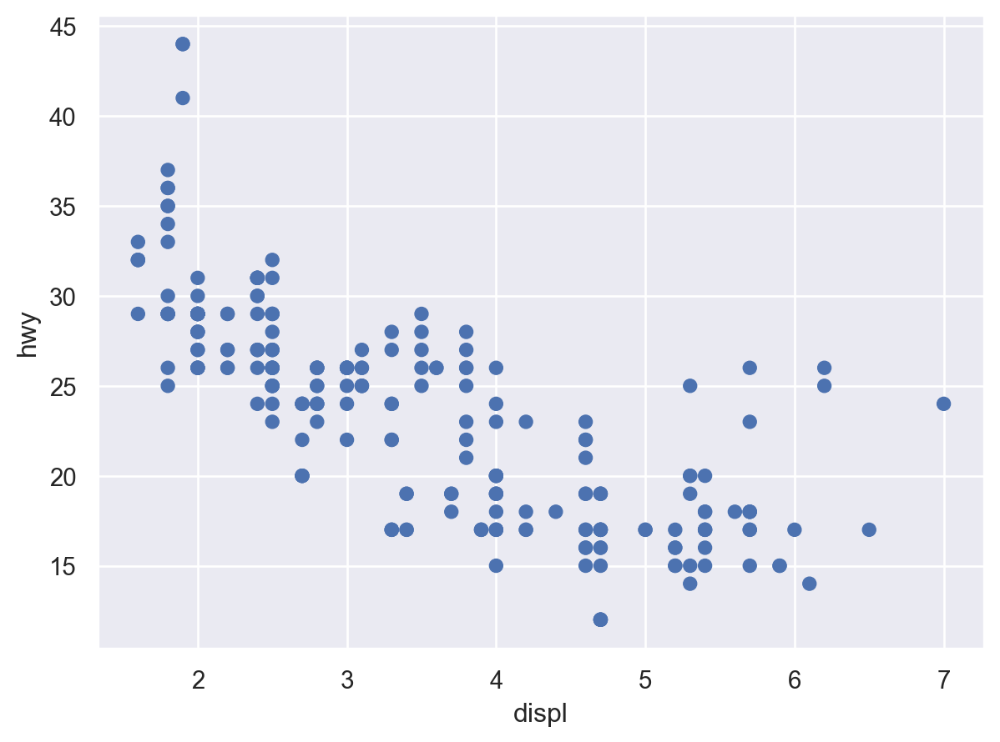

In [4]:
# Scatter plot: 산포도
(
    so.Plot(mpg, x="displ", y="hwy") # empty plot을 생성하고, x, y축에 mapping할 mpg 데이터의 변수를 지정
    .add(so.Dot()) # layer를 추가하여, points들을 Dot이라는 mark object를 써서 표현
)

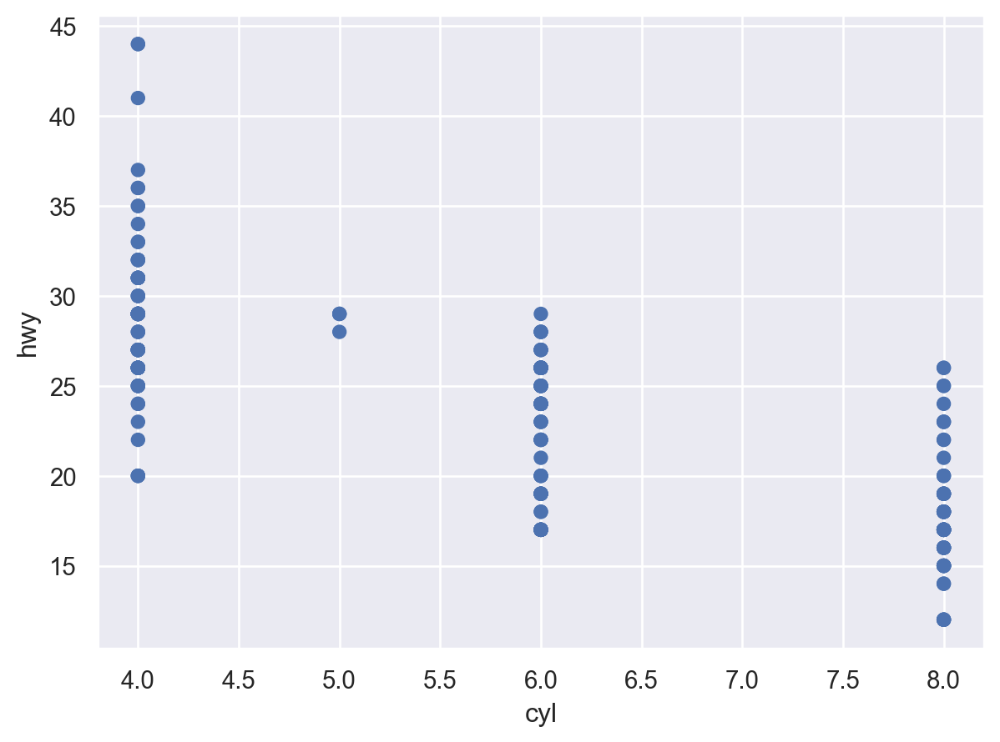

In [5]:
(
    so.Plot(mpg, x = 'cyl', y = 'hwy')
    .add(so.Dot())
)

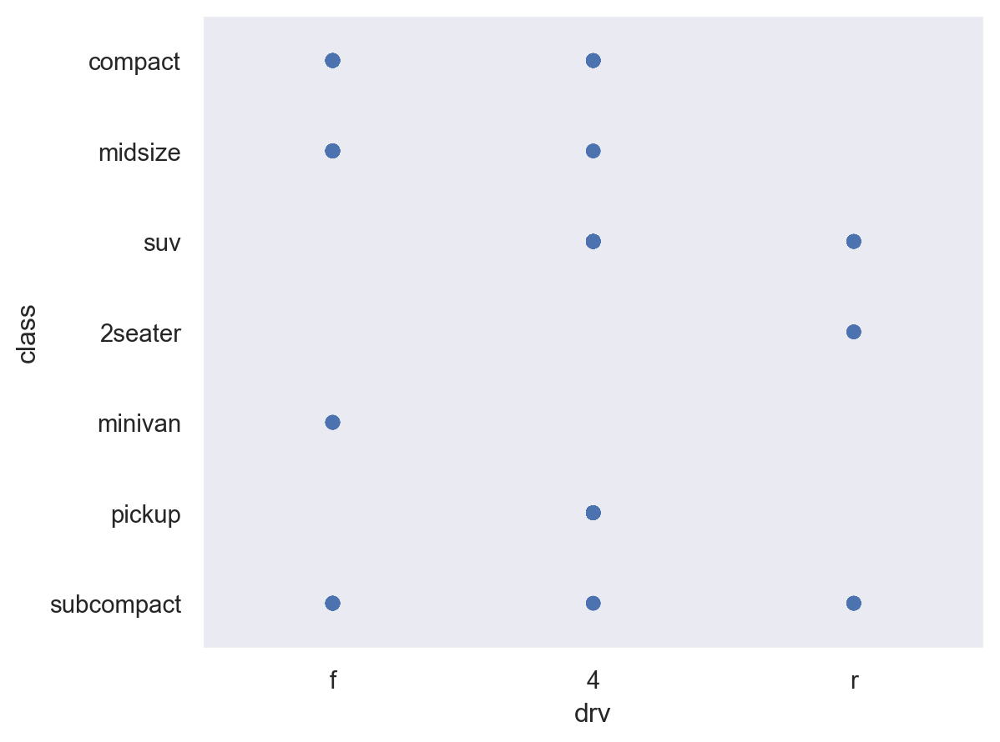

In [6]:
(
    so.Plot(mpg, x = 'drv', y = 'class')
    .add(so.Dot())
)

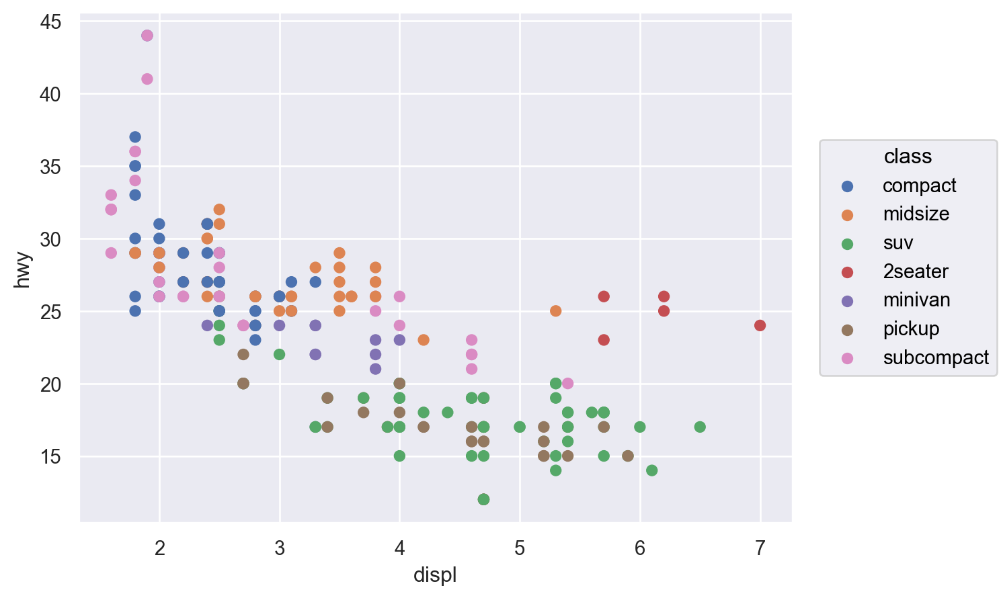

In [4]:
# Color
(
    so.Plot(mpg, x="displ", y="hwy", color="class")
    .add(so.Dot())
)

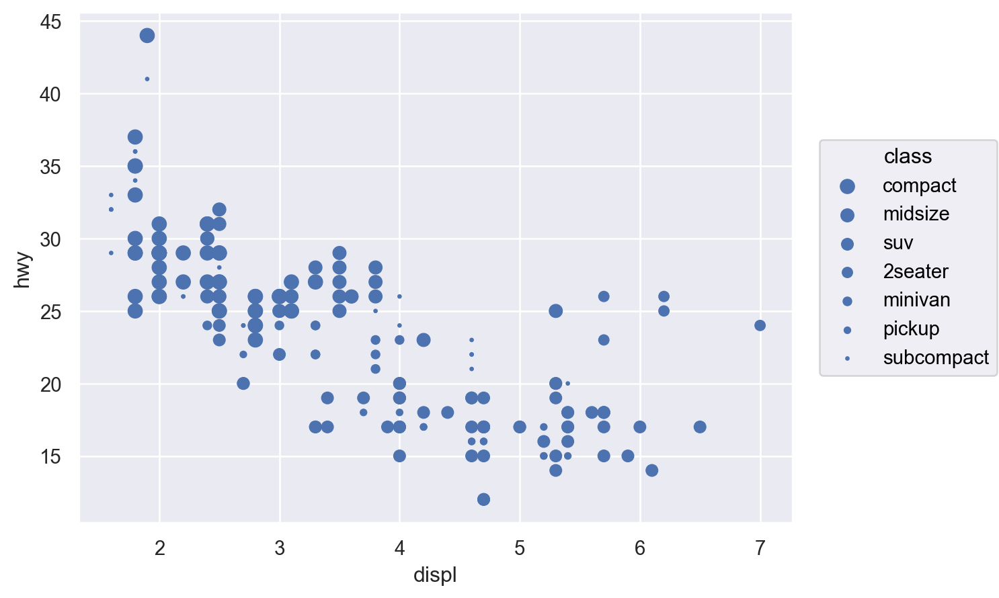

In [5]:
# Pointsize
(
    so.Plot(mpg, x="displ", y="hwy", pointsize="class")
    .add(so.Dot())
)

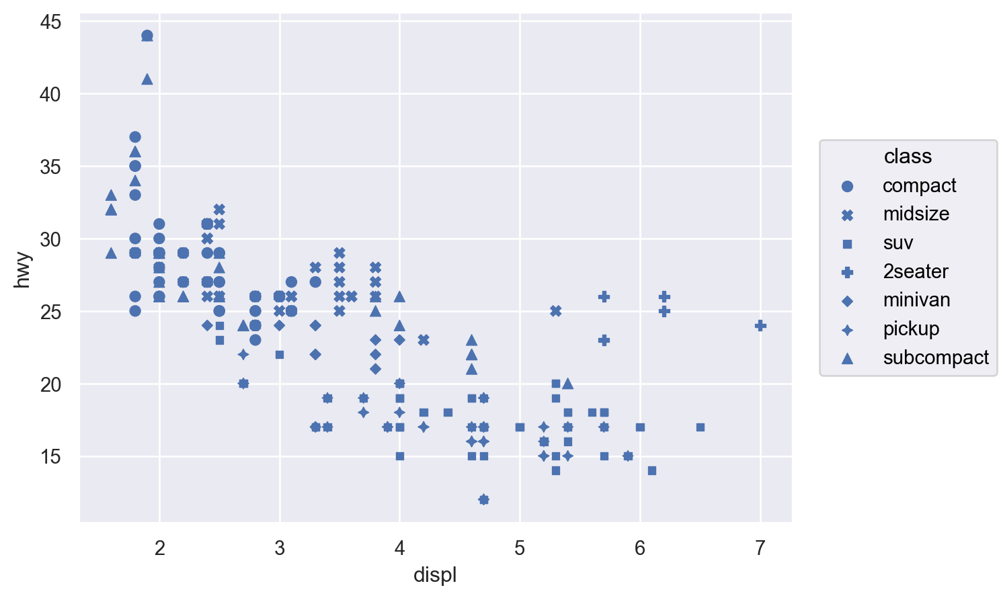

In [6]:
# Marker
(
    so.Plot(mpg, x="displ", y="hwy", marker="class")
    .add(so.Dot())
)

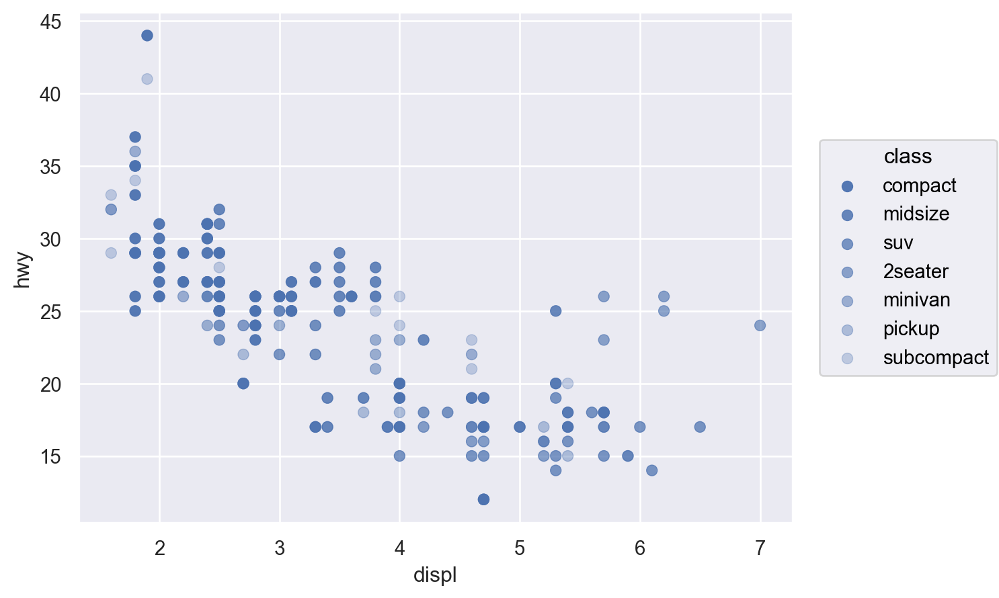

In [7]:
# alpha
(
    so.Plot(mpg, x="displ", y="hwy", alpha="class")
    .add(so.Dot())
)

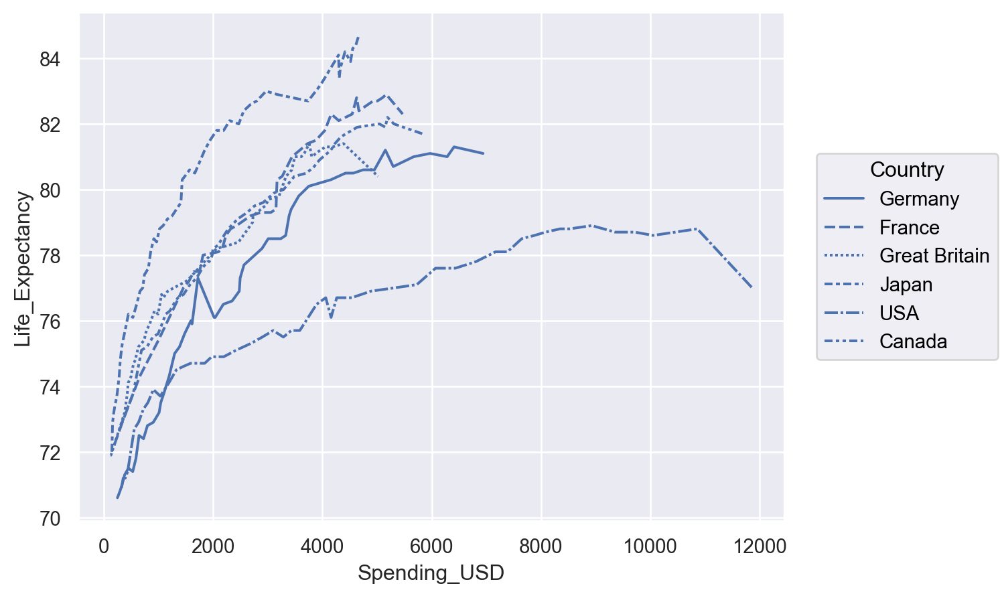

In [9]:
# linestyle
healthexp = sns.load_dataset("healthexp")

p = so.Plot(healthexp, x="Spending_USD", y="Life_Expectancy", linestyle="Country")
p.add(so.Line())

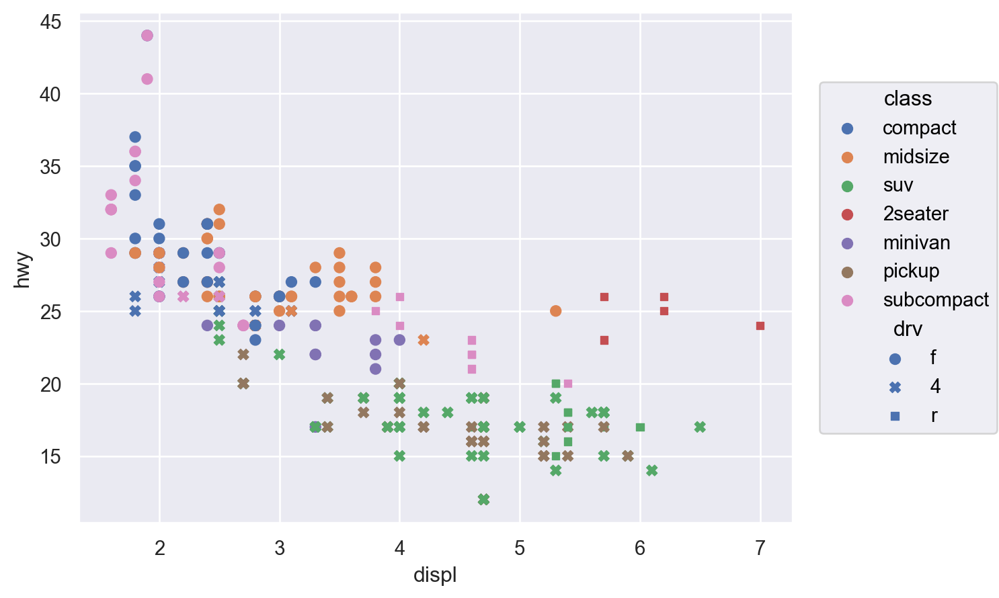

In [10]:
# color & marker
(
    so.Plot(mpg, x="displ", y="hwy", color="class", marker="drv")
    .add(so.Dot())
)

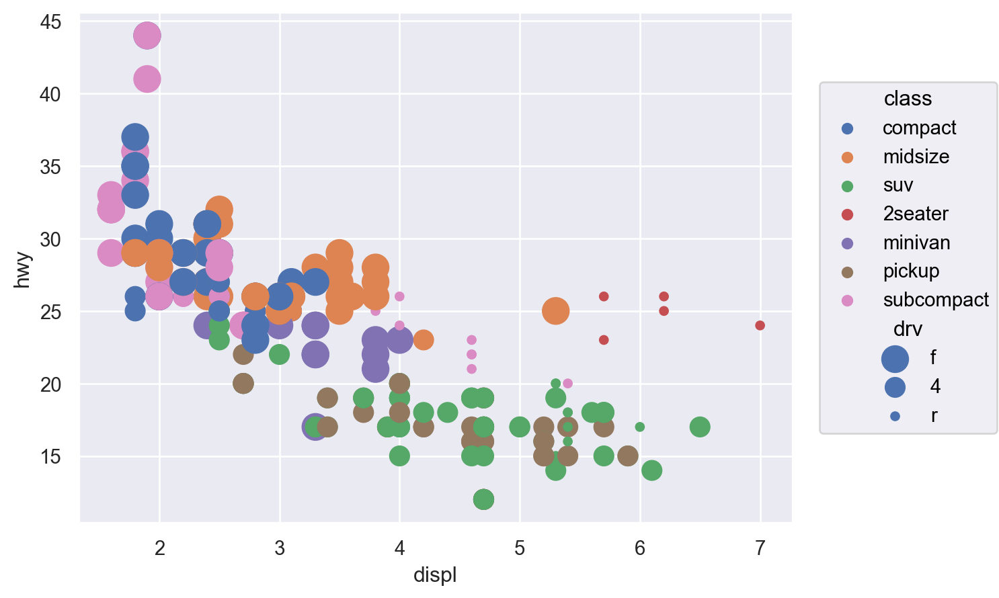

In [11]:
(
    so.Plot(mpg, x="displ", y="hwy", color="class", pointsize="drv")
    .add(so.Dot())
    .scale(pointsize=(5, 15))  # pointsize의 range설정
)

# Setting properties

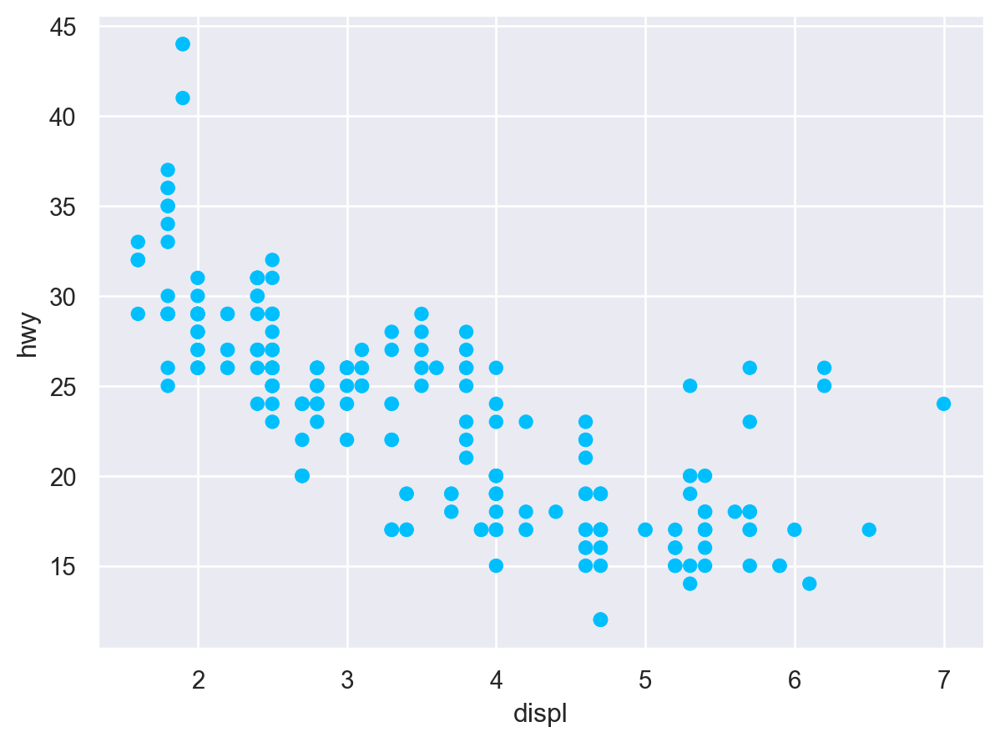

In [12]:
(
    so.Plot(mpg, x="displ", y="hwy")
    .add(so.Dot(color="deepskyblue")) # Mark object 안에 지정!
)

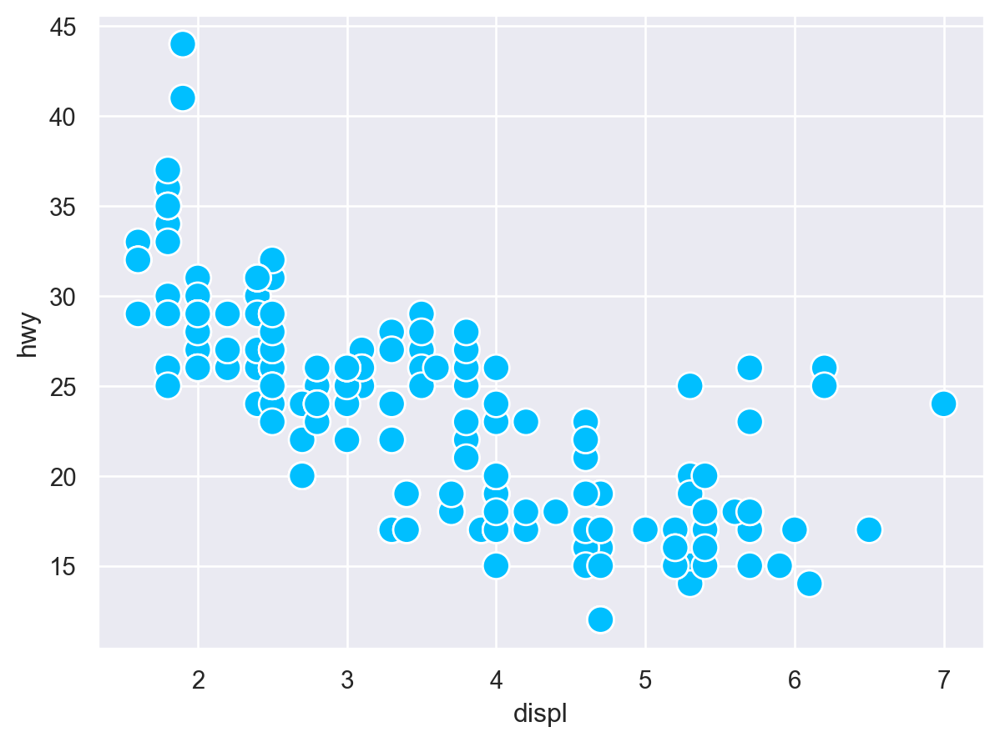

In [13]:
(
    so.Plot(mpg, x="displ", y="hwy")
    .add(so.Dot(color="deepskyblue", pointsize=12, edgecolor="white", edgewidth=1)) # Mark object 안에 지정!
)

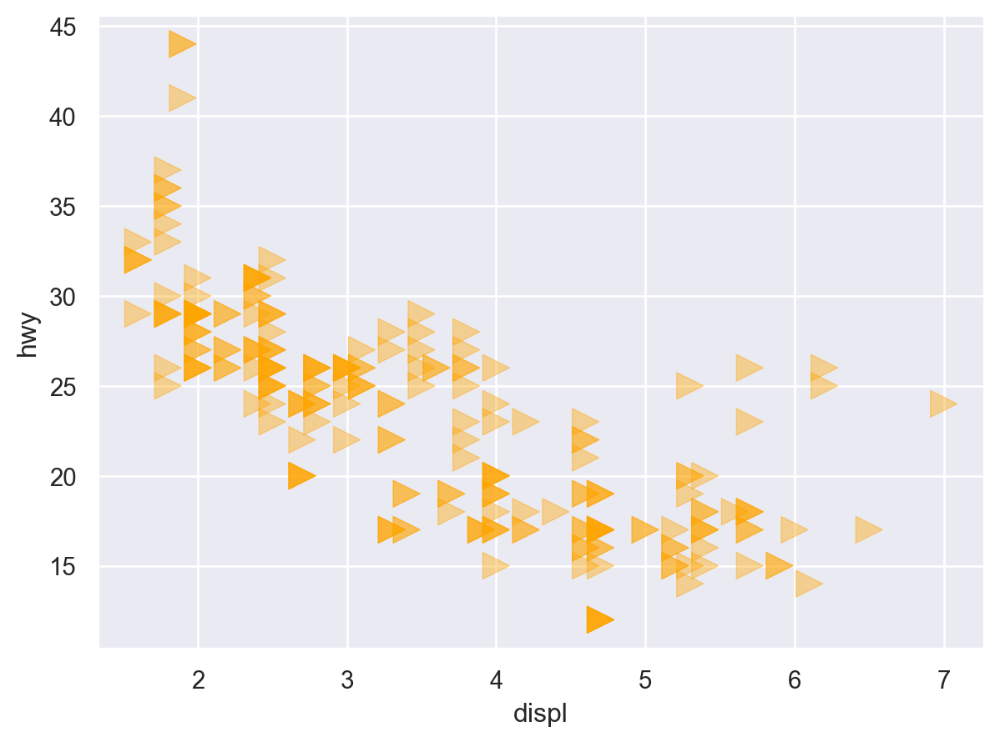

In [14]:
(
    so.Plot(mpg, x="displ", y="hwy")
    .add(so.Dot(color="orange", pointsize=12, marker=">", alpha=.4))  # Mark object 안에 지정!
)

# Faceting

In [16]:
penguins = sns.load_dataset("penguins") # load a dataset: penguins
penguins.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.10,18.70,181.00,3750.00,Male
1,Adelie,Torgersen,39.50,17.40,186.00,3800.00,Female
2,Adelie,Torgersen,40.30,18.00,195.00,3250.00,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.70,19.30,193.00,3450.00,Female


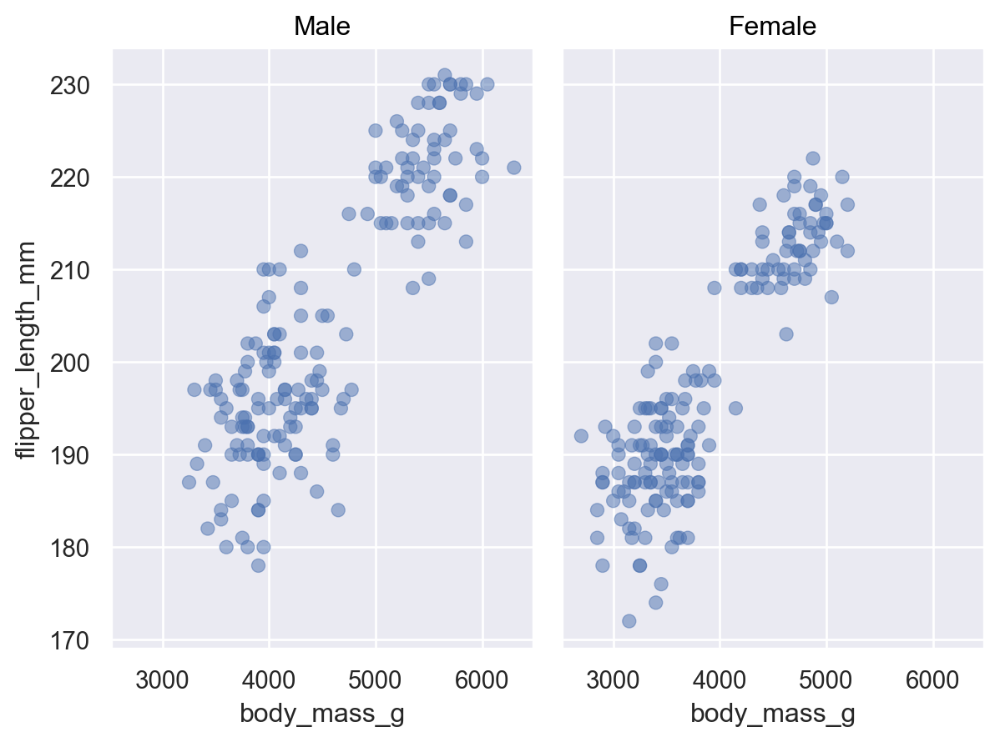

In [17]:
(
    so.Plot(penguins, x="body_mass_g", y="flipper_length_mm")
    .add(so.Dot(alpha=.5))
    .facet("sex")  # 기본적으로 columns으로 나누어져 그림, wrap: column에 몇 개까지 그릴지
)

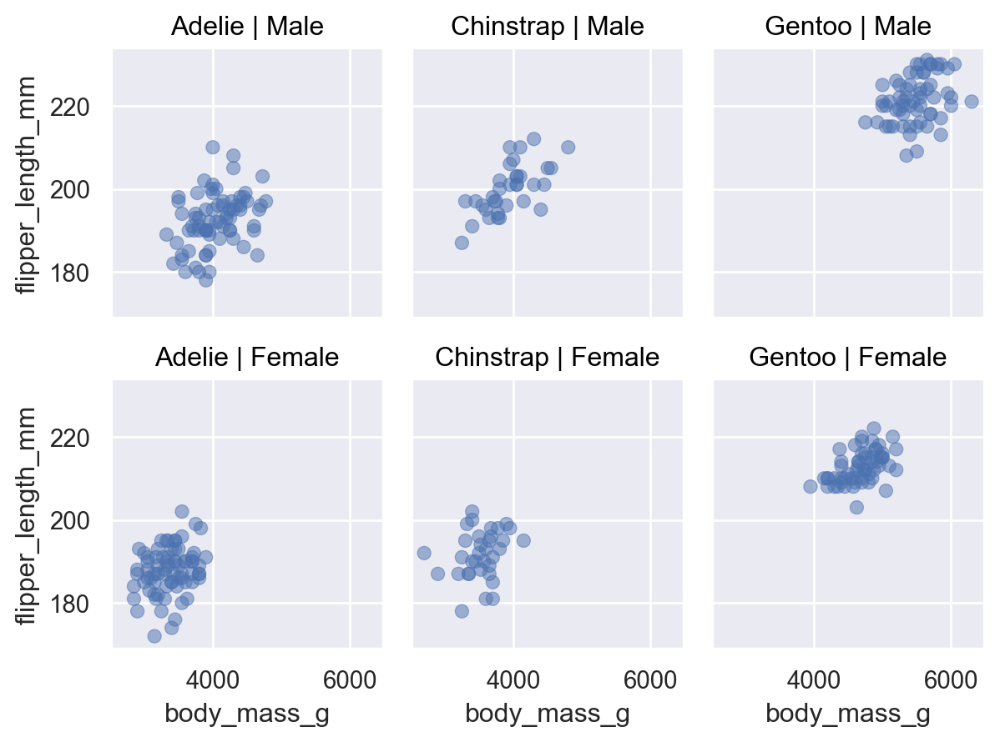

In [18]:
p = (
    so.Plot(penguins, x="body_mass_g", y="flipper_length_mm")
    .facet(col="species", row="sex")
    .add(so.Dot(alpha=.5))
)
p

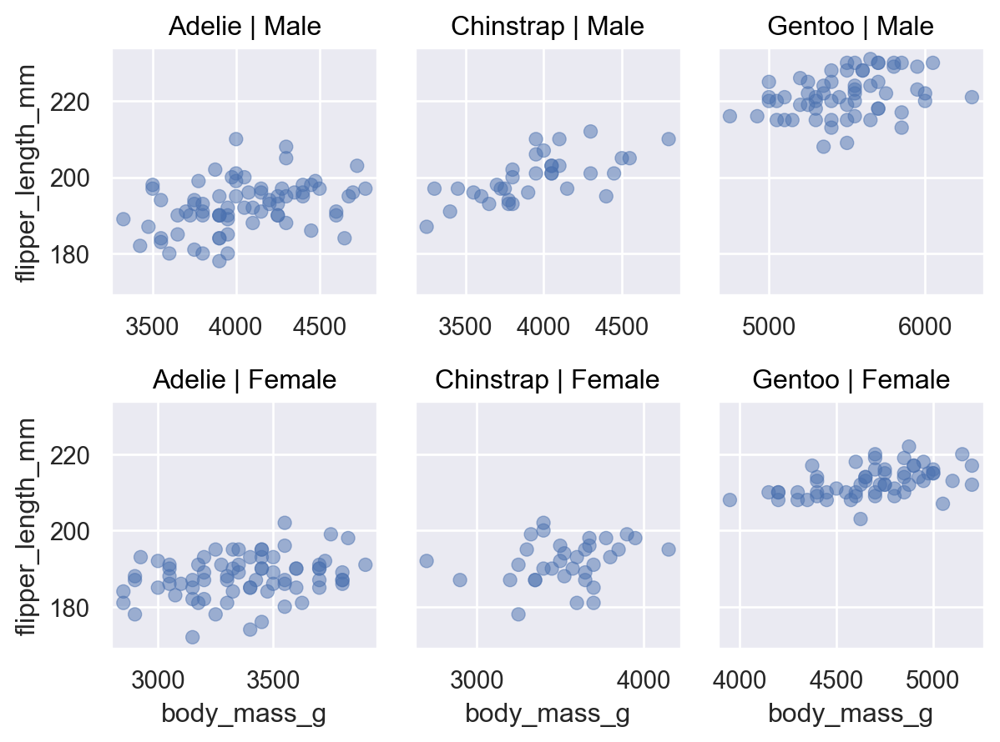

In [19]:
# x, y축의 눈금을 일치할지 여부
p.share(x=False, y=True)

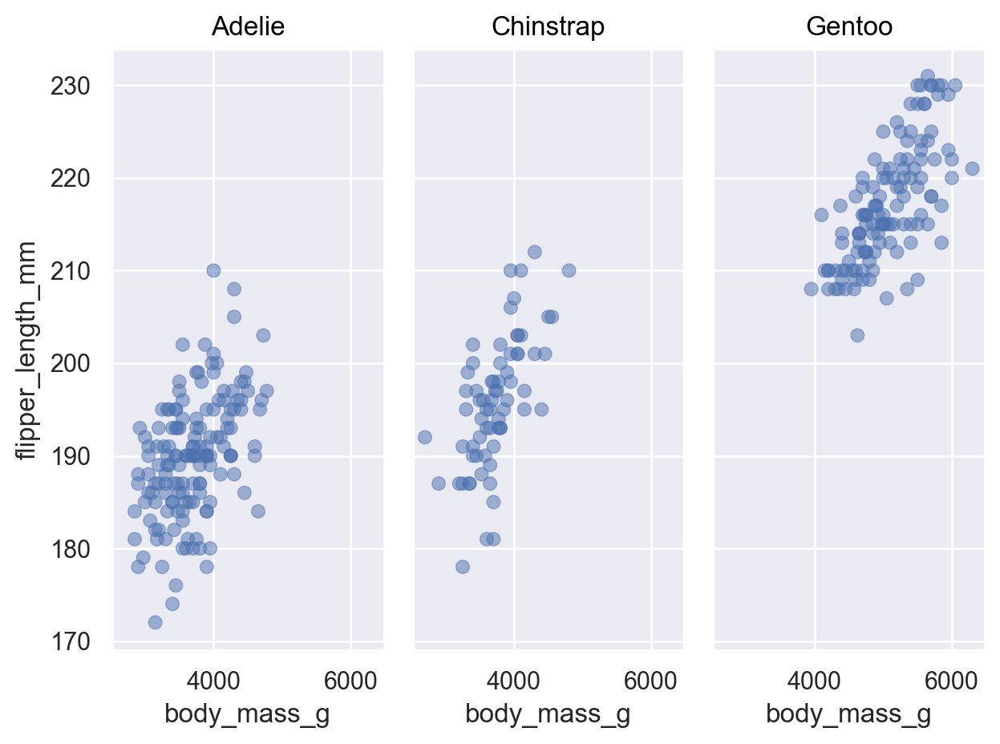

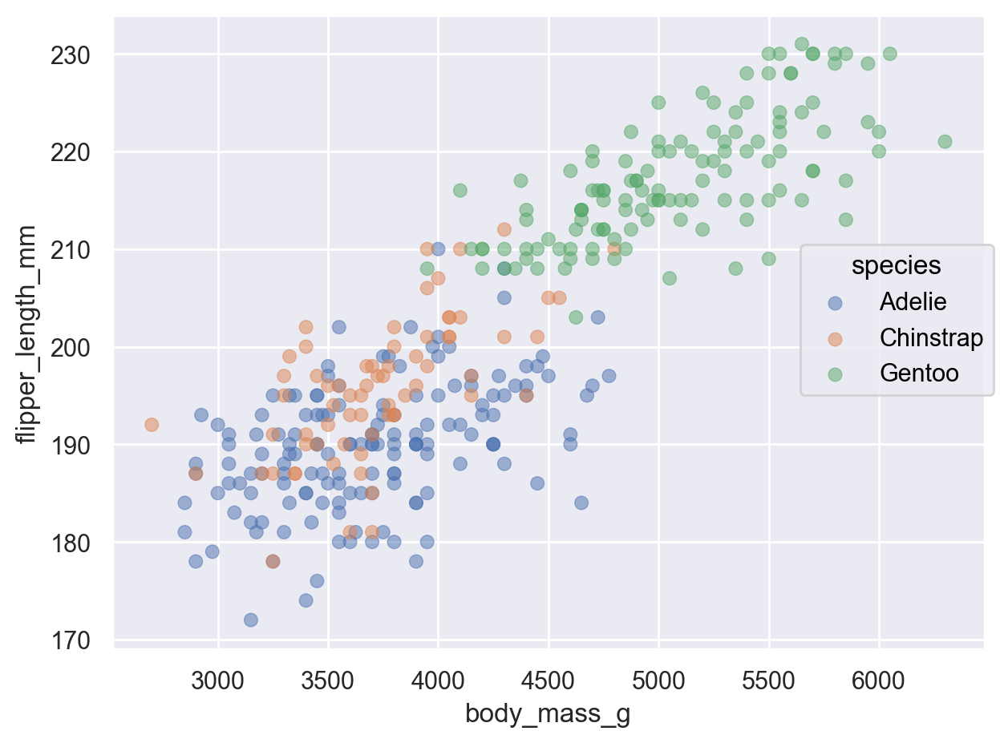

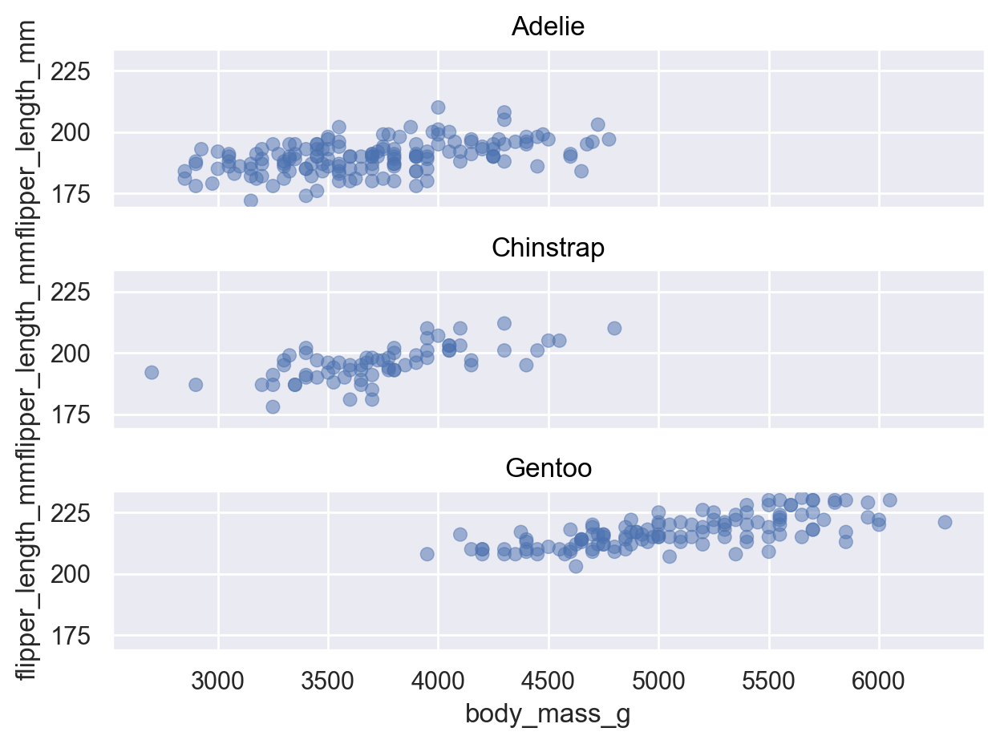

In [20]:
left = (
    so.Plot(penguins, x="body_mass_g", y="flipper_length_mm")
    .facet(col="species")
    .add(so.Dot(alpha=.5))
).show()

right = (
    so.Plot(penguins, x="body_mass_g", y="flipper_length_mm", color="species")
    .add(so.Dot(alpha=.5))
).show()

bottom = (
    so.Plot(penguins, x="body_mass_g", y="flipper_length_mm")
    .facet(row="species")
    .add(so.Dot(alpha=.5))
).show()

# Pairing

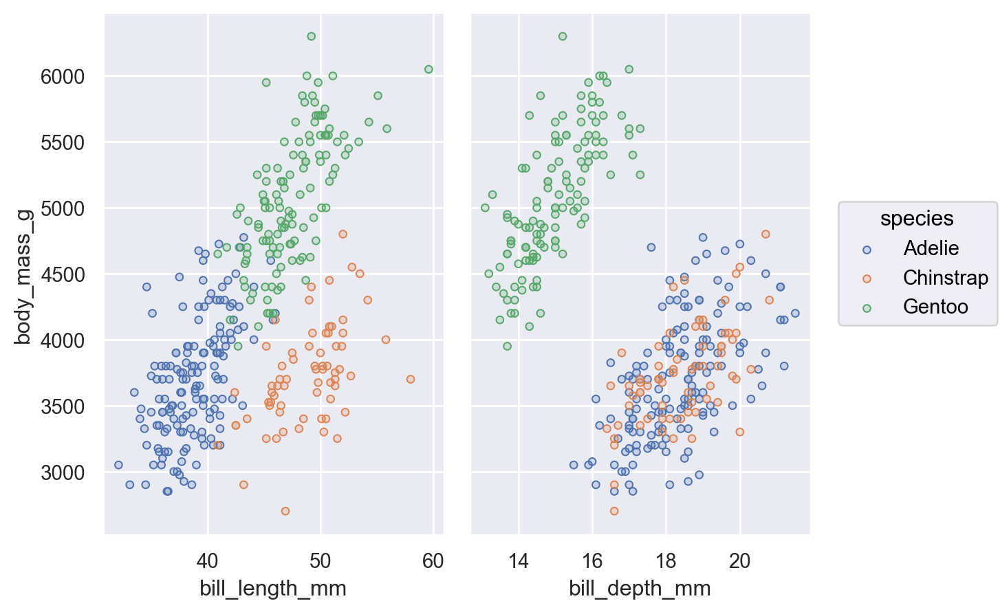

In [21]:
(
    so.Plot(penguins, y="body_mass_g", color="species")  # y축은 공유
    .pair(x=["bill_length_mm", "bill_depth_mm"])  # x축에 다른 변수를 mapping
    .add(so.Dots())  # .Dots()! overploting에 유리. .Dot(alpha=.)로도 비슷
)

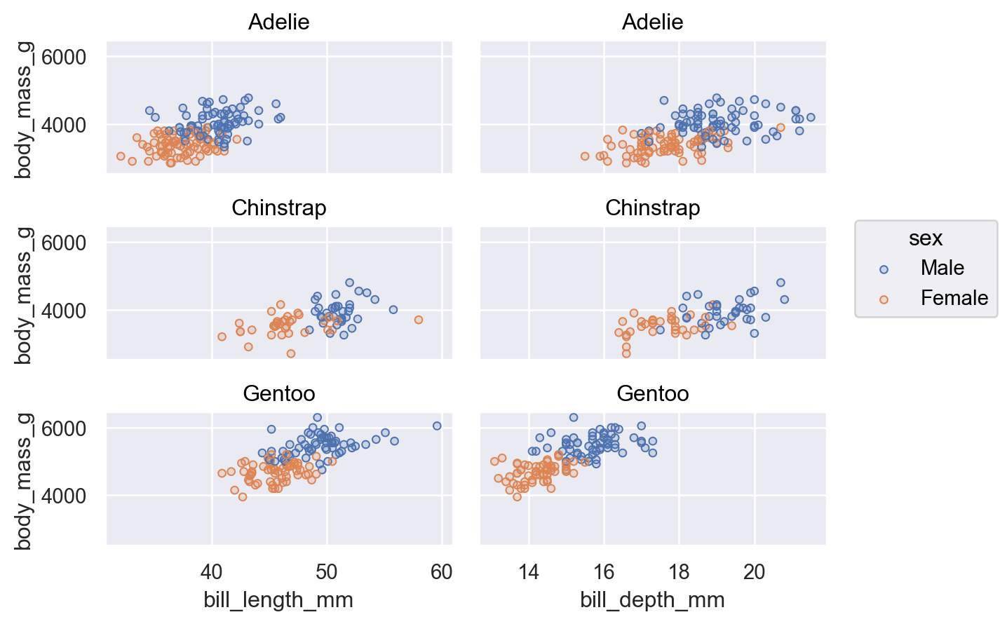

In [22]:
# Facet & pair 동시에
(
    so.Plot(penguins, y="body_mass_g", color="sex")
    .pair(x=["bill_length_mm", "bill_depth_mm"])
    .facet(row="species")
    .add(so.Dots())
)

# Multiple plots

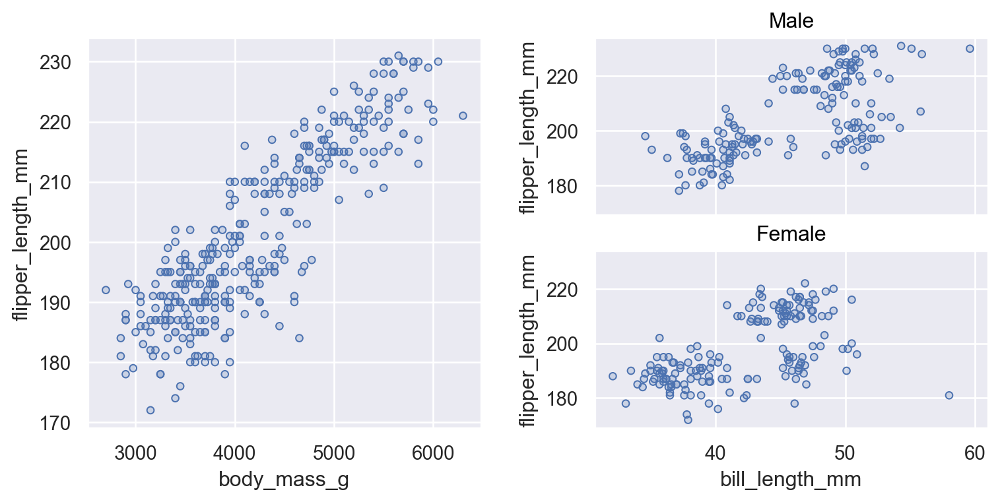

In [23]:
import matplotlib as mpl

f = mpl.figure.Figure(figsize=(8, 4))
sf1, sf2 = f.subfigures(1, 2)
(
    so.Plot(penguins, x="body_mass_g", y="flipper_length_mm")
    .add(so.Dots())
    .on(sf1)
    .plot()
)
(
    so.Plot(penguins, x="bill_length_mm", y="flipper_length_mm")
    .facet(row="sex")
    .add(so.Dots())
    .on(sf2)
    .plot()
)

# Statistical transformation

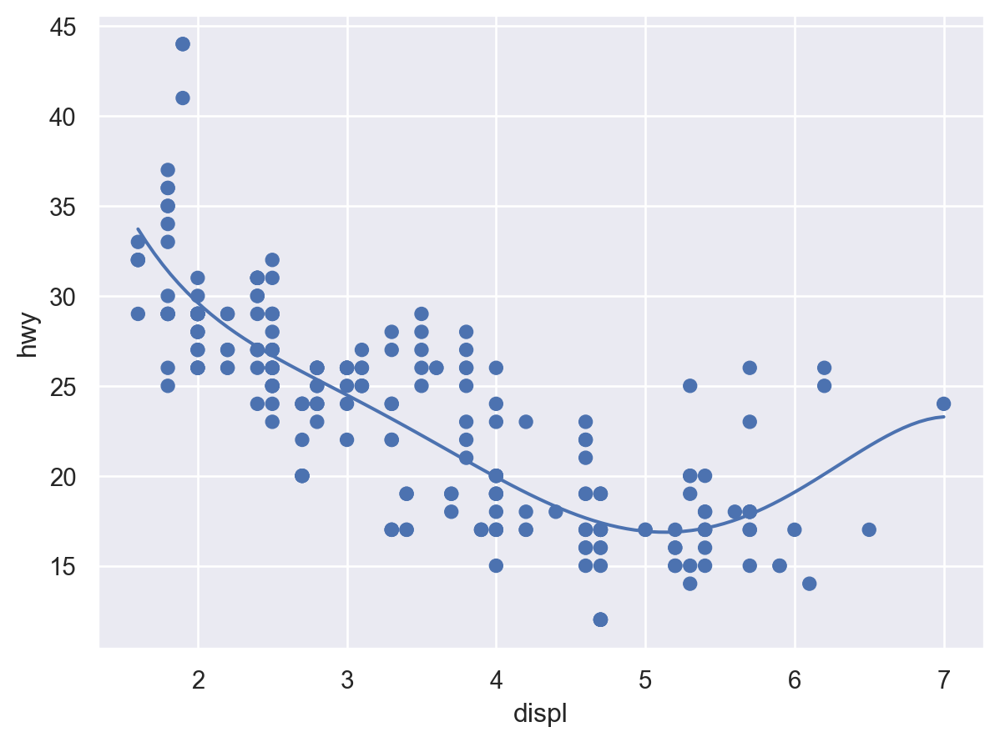

In [24]:
(
    so.Plot(mpg, x="displ", y="hwy") # empty plot을 생성하고, x, y축에 mapping할 mpg 데이터의 변수를 지정
    .add(so.Dot()) # layer를 추가하여, points들을 Dot이라는 mark object를 써서 표현
    .add(so.Line(), so.PolyFit(5))  # PolyFit(n): n차 다항식으로 fit
)

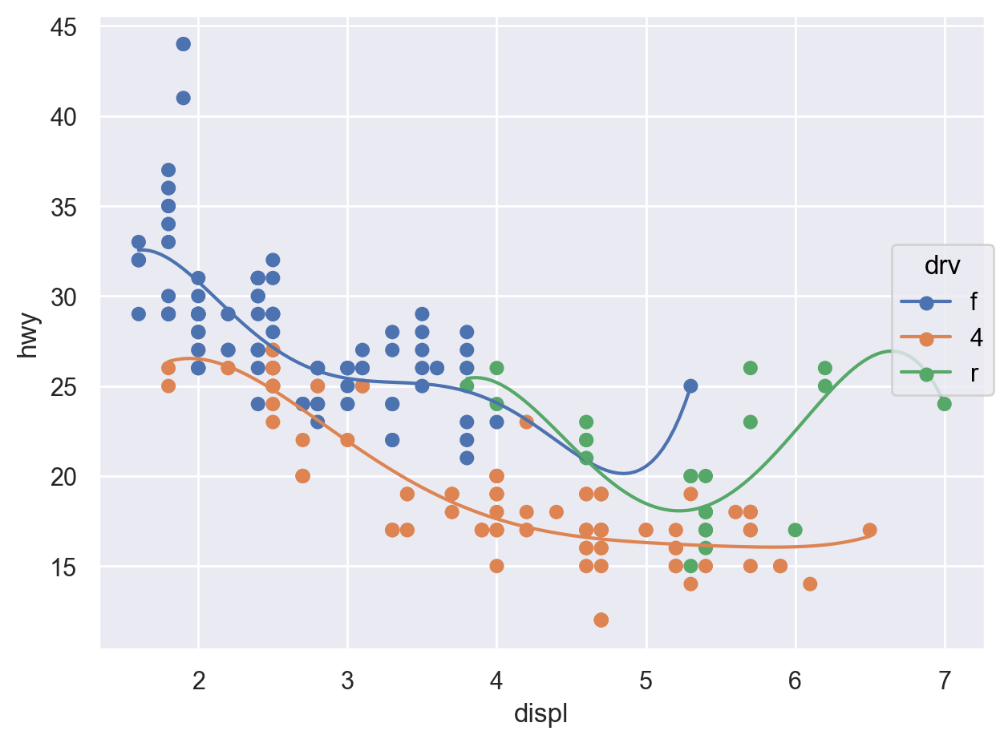

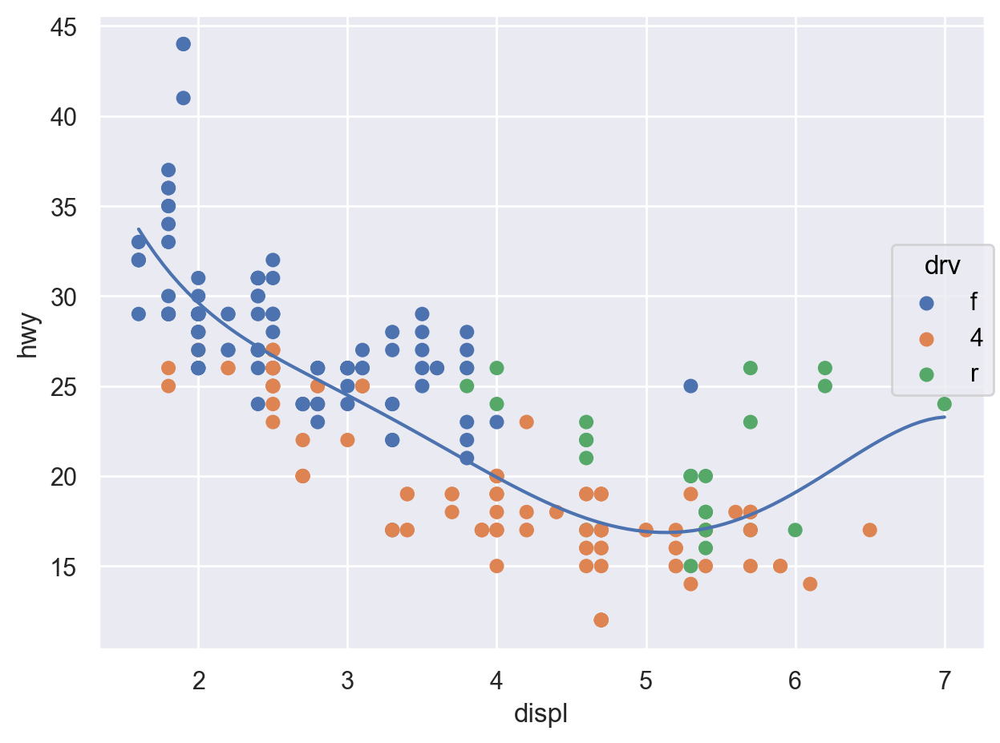

In [25]:
left = (
    so.Plot(mpg, x="displ", y="hwy", color="drv")  # color mapping이 이후 모든 layer에 적용
    .add(so.Dot())
    .add(so.Line(), so.PolyFit(5))
).show()

right = (
    so.Plot(mpg, x="displ", y="hwy")
    .add(so.Dot(), color="drv")  # color mapping이 이 layer에만 적용
    .add(so.Line(), so.PolyFit(5))
).show()

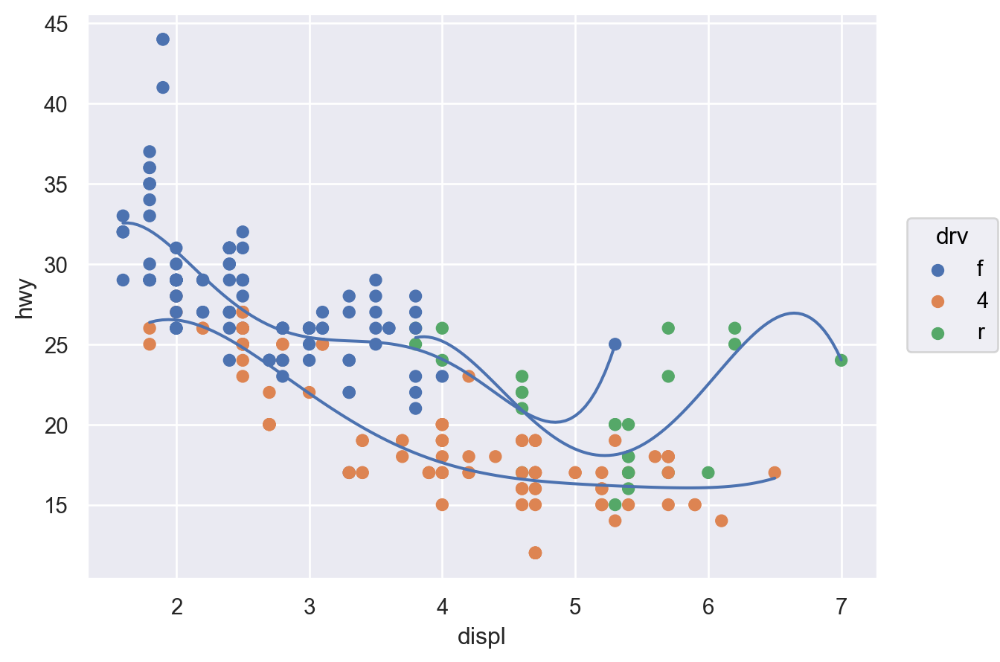

In [27]:
(
    so.Plot(mpg, x="displ", y="hwy")
    .add(so.Dot(), color="drv")
    .add(so.Line(), so.PolyFit(5), group="drv") # color가 아닌 group으로 grouping
)

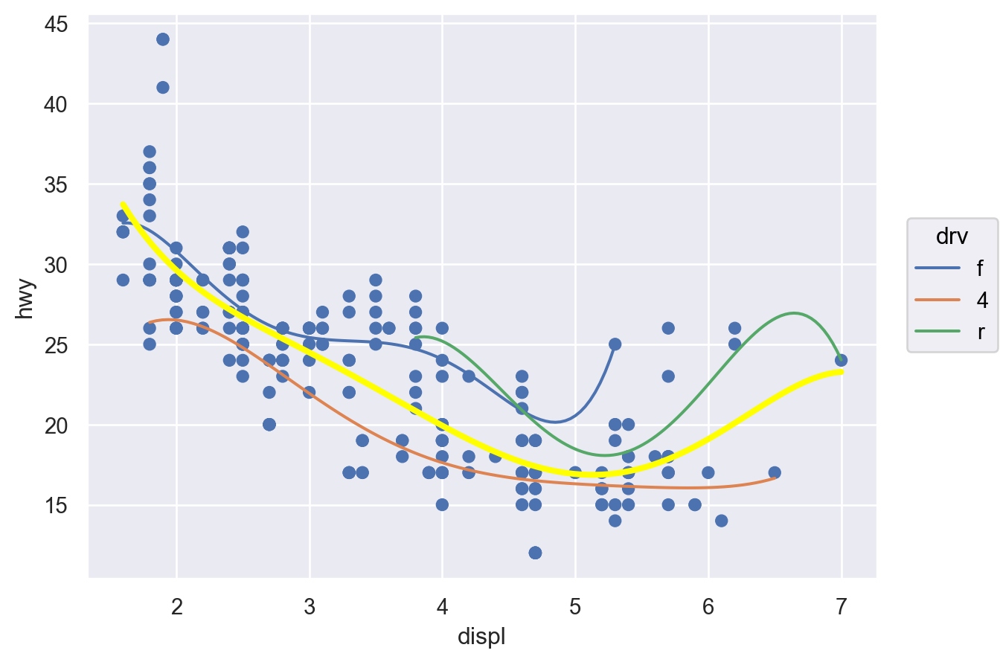

In [23]:
(
    so.Plot(mpg, x="displ", y="hwy")  
    .add(so.Dot())
    .add(so.Line(), so.PolyFit(5), color="drv") # 여기에 mapping을 넣어 이 layer에만 적용함으로써 아래 레이어가 전체 trend를 그림
    .add(so.Line(color = "yellow", linewidth = 3), so.PolyFit(5))  # 여기 color는 property라서 함수 안에 넣어야 함
)


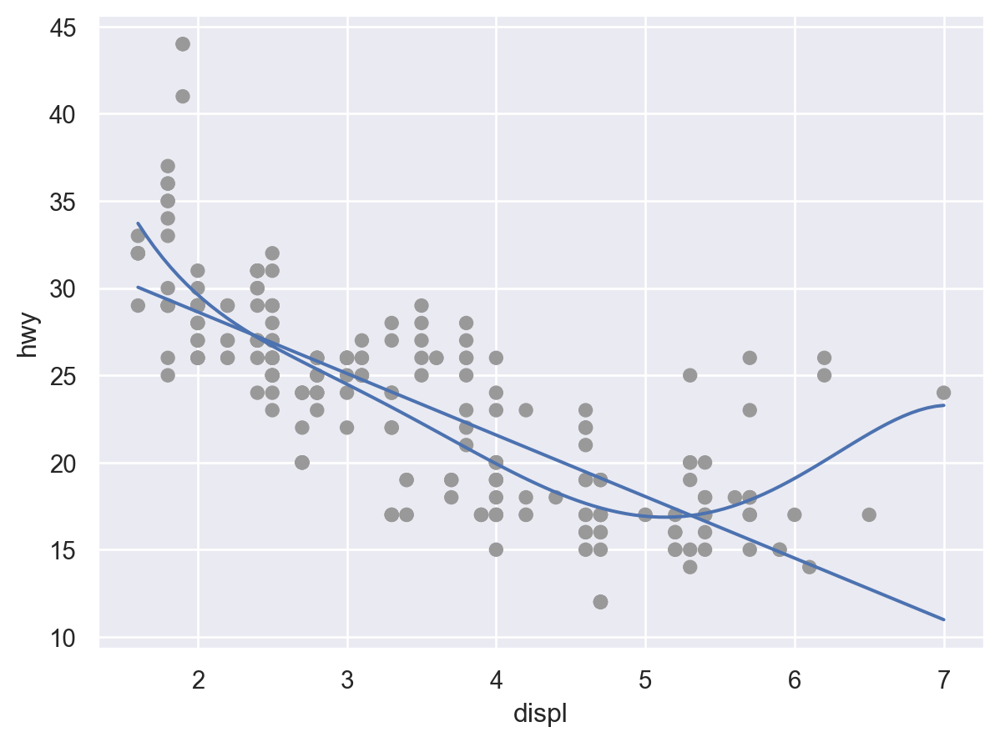

In [24]:
(
    so.Plot(mpg, x="displ", y="hwy")
    .add(so.Dot(color=".6"))
    .add(so.Line(), so.PolyFit(5))
    .add(so.Line(), so.PolyFit(1))
)

# 제일 잘 fit한 것을 그리고, 선형적인 걸 그려서 얼마나 선형적으로 벗어나는지 확인해라

# Visualizaing distributions

In [28]:
tips = sns.load_dataset("tips")
tips.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244 entries, 0 to 243
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   total_bill  244 non-null    float64 
 1   tip         244 non-null    float64 
 2   sex         244 non-null    category
 3   smoker      244 non-null    category
 4   day         244 non-null    category
 5   time        244 non-null    category
 6   size        244 non-null    int64   
dtypes: category(4), float64(2), int64(1)
memory usage: 7.4 KB


In [29]:
tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
...,...,...,...,...,...,...,...
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2
243,18.78,3.00,Female,No,Thur,Dinner,2


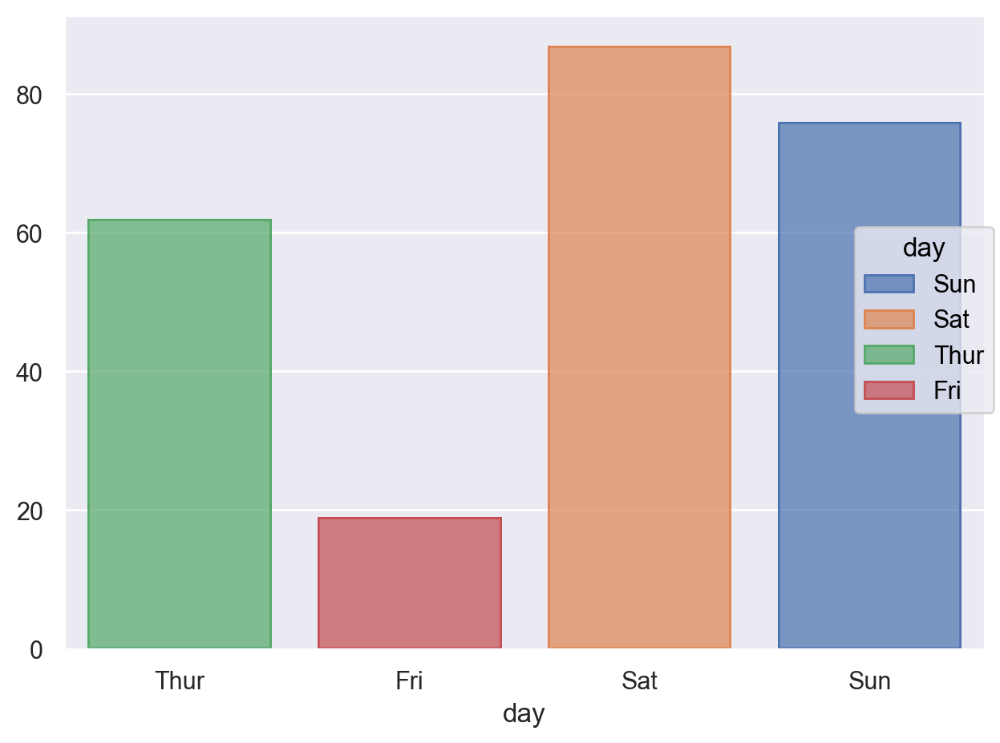

In [30]:
(
    so.Plot(tips, x="day", color = 'day')
    .add(so.Bar(), so.Count())  # category type의 변수는 순서가 존재. 
                                # 그렇지 않은 경우 알파벳 순서로. 
).show()  # .show()는 생략해도 됨

In [35]:
count_day = tips.value_counts("day", normalize = True).reset_index(name="pct")
# value_counts하면 Series인데, reset_index로 데이터프레임으로 변경

count_day

,day,pct
0,Sat,0.36
1,Sun,0.31
2,Thur,0.25
3,Fri,0.08


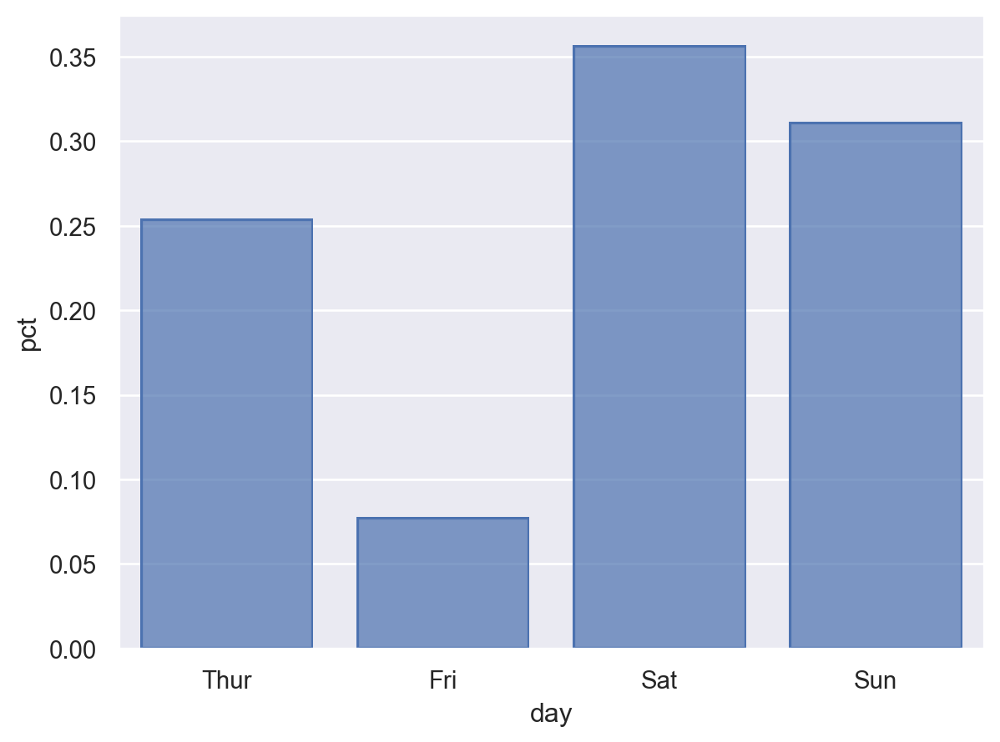

In [36]:
(
    so.Plot(count_day, x="day", y="pct")
    .add(so.Bar())
)

In [39]:
penguins = sns.load_dataset("penguins") # load a dataset: penguins
penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.10,18.70,181.00,3750.00,Male
1,Adelie,Torgersen,39.50,17.40,186.00,3800.00,Female
2,Adelie,Torgersen,40.30,18.00,195.00,3250.00,Female
...,...,...,...,...,...,...,...
341,Gentoo,Biscoe,50.40,15.70,222.00,5750.00,Male
342,Gentoo,Biscoe,45.20,14.80,212.00,5200.00,Female
343,Gentoo,Biscoe,49.90,16.10,213.00,5400.00,Male


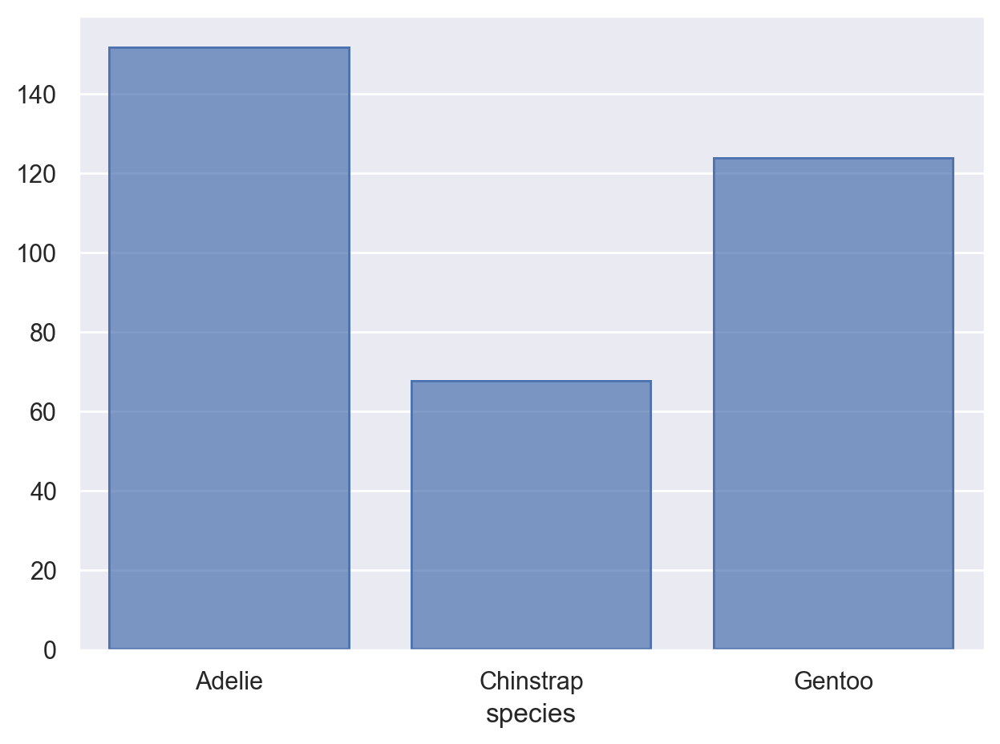

In [31]:
penguins = sns.load_dataset("penguins") # load a dataset: penguins

# Species에 inherent order가 없음; 알파벳 순으로 정렬
(
    so.Plot(penguins, x="species")
    .add(so.Bar(), so.Count())
).show()

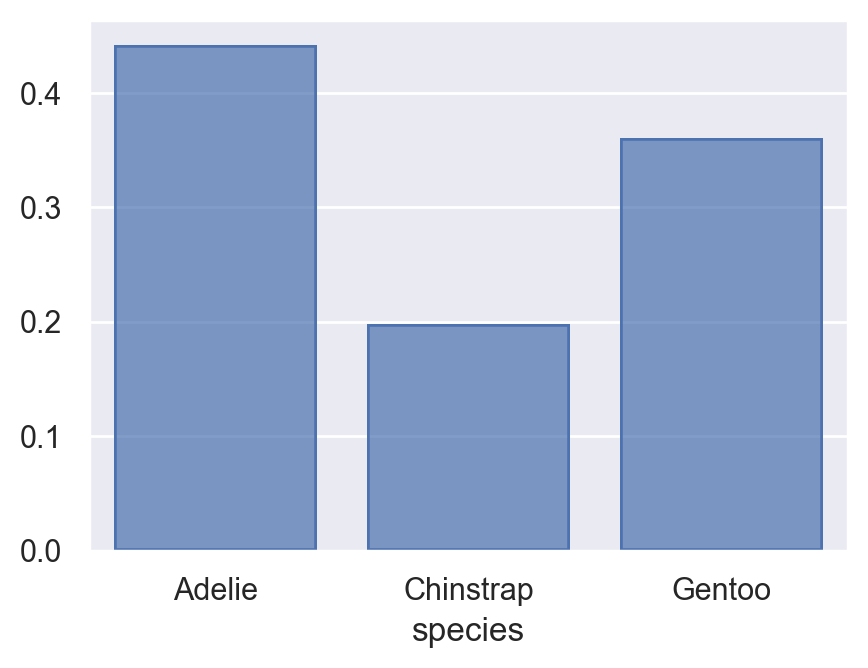

In [32]:
(
    so.Plot(penguins, x="species")
    .add(so.Bar(), so.Hist("proportion"))  # Hist()의 default는 stat="count"
    .layout(size=(4.5, 3.5))
).show()

# grouping의 처리에 대해서는 뒤에... 에를 들어, color="sex"

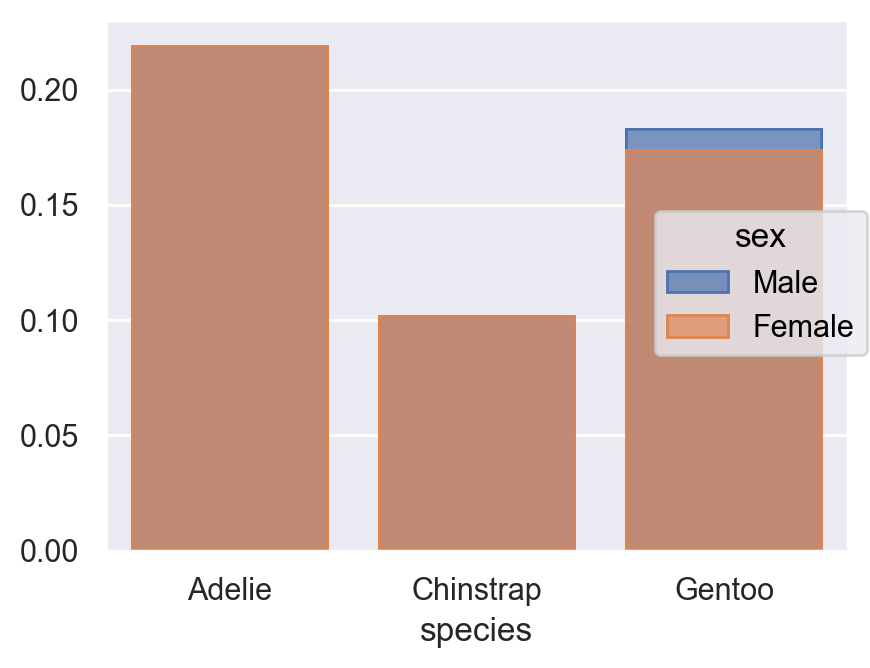

In [40]:
(
    so.Plot(penguins, x="species", color = "sex")
    .add(so.Bar(), so.Hist("proportion"))  # Hist()의 default는 stat="count"
    .layout(size=(4.5, 3.5))
).show()

# 겹쳐서 그려져서 의미가 없어짐

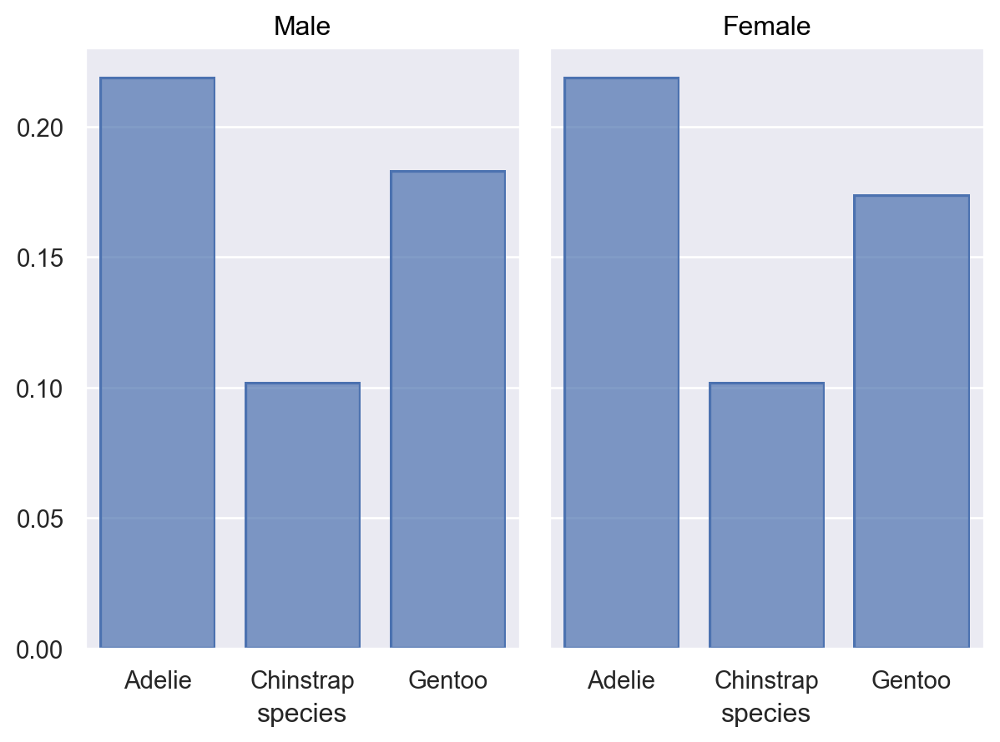

In [43]:
(
    so.Plot(penguins, x="species")
    .add(so.Bar(), so.Hist("proportion"))  # Hist()의 default는 stat="count"
    .facet("sex") # 따로따로 그리기
)

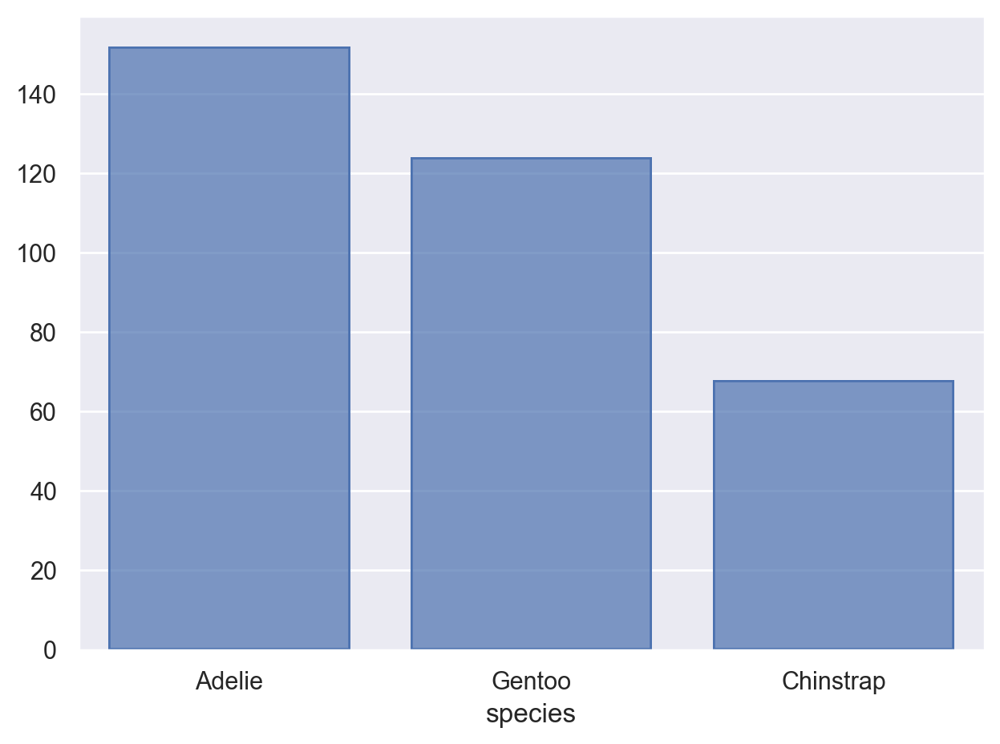

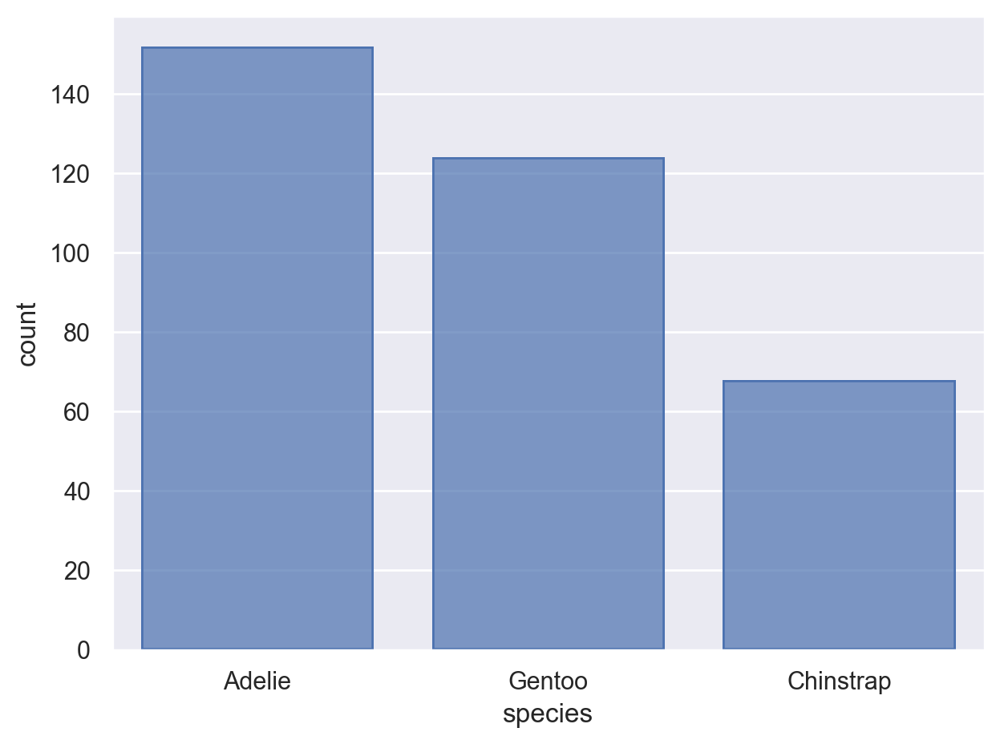

In [46]:
# value_counts()는 크기대로 sorting!
reorder = penguins.value_counts("species").index.values


(
    so.Plot(penguins, x="species")
    .add(so.Bar(), so.Count())
    .scale(x=so.Nominal(order=reorder))  # x축의 카테고리 순서를 변경
).show()

# 직접 개수를 구해 그리는 경우, 테이블의 순서대로 그려짐
(
    so.Plot(penguins.value_counts("species").reset_index(), 
            x="species", y="count")
    .add(so.Bar())
).show()

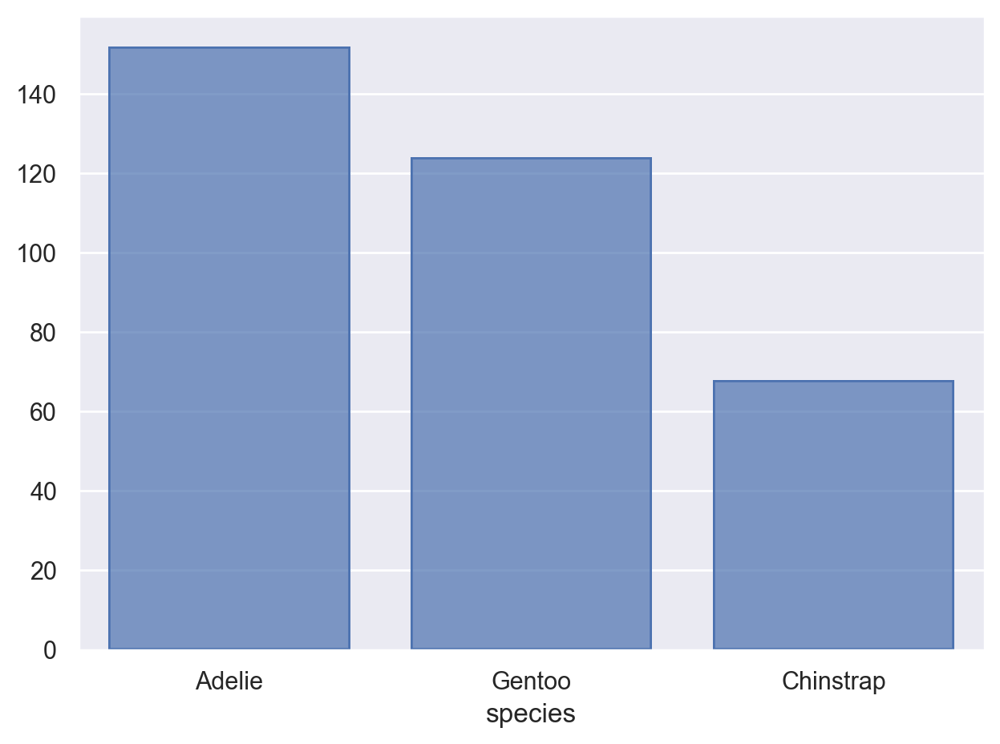

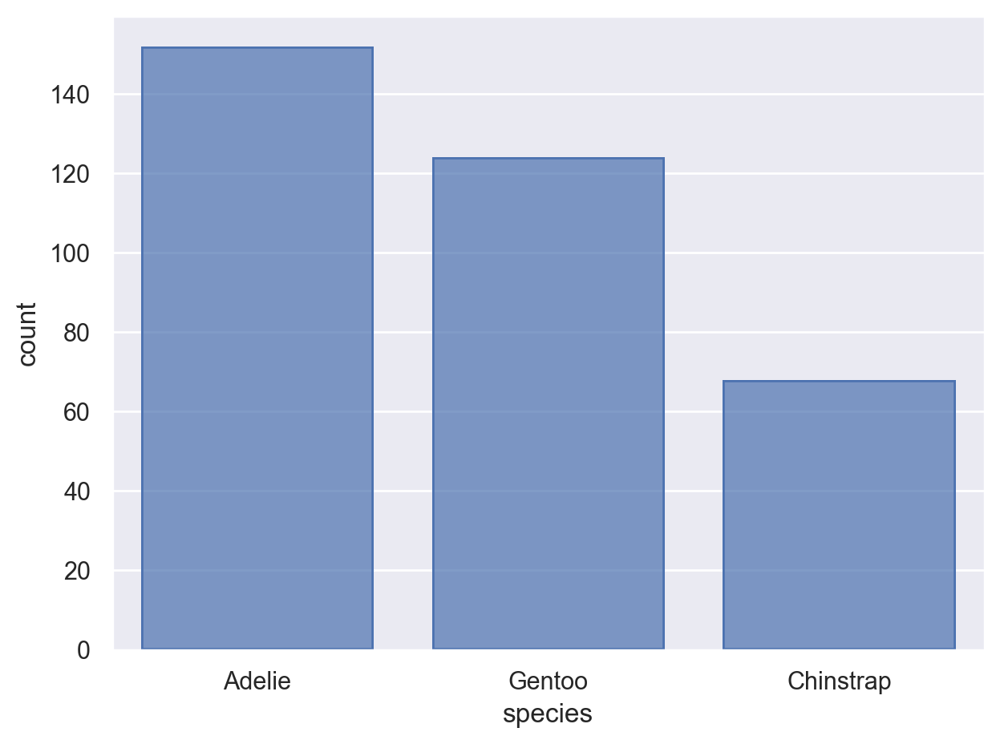

In [47]:
(
    so.Plot(penguins, x="species")
    .add(so.Bar(), so.Count())
    .scale(x=so.Nominal(order=penguins.value_counts("species").index))  # index만 해도 받아진다
).show()

# 직접 개수를 구해 그리는 경우, 테이블의 순서대로 그려짐
(
    so.Plot(penguins.value_counts("species").reset_index(), 
            x="species", y="count")
    .add(so.Bar())
).show()

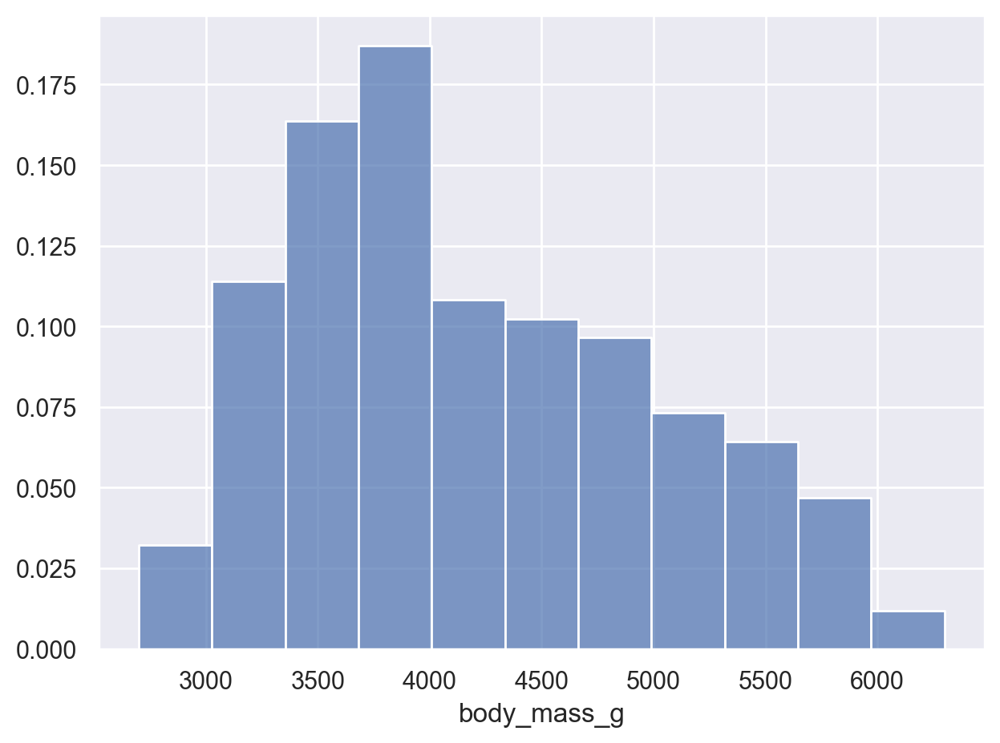

In [49]:
(
    so.Plot(penguins, x="body_mass_g")
    .add(so.Bars(), so.Hist("proportion"))  # Histogram; x값을 bins으로 나누어 count를 계산!
                                # .Bars()는 .Bar()에 비해 연속변수에 더 적합: 얇은 경계선으로 나란히 붙혀서 그려짐
).show()

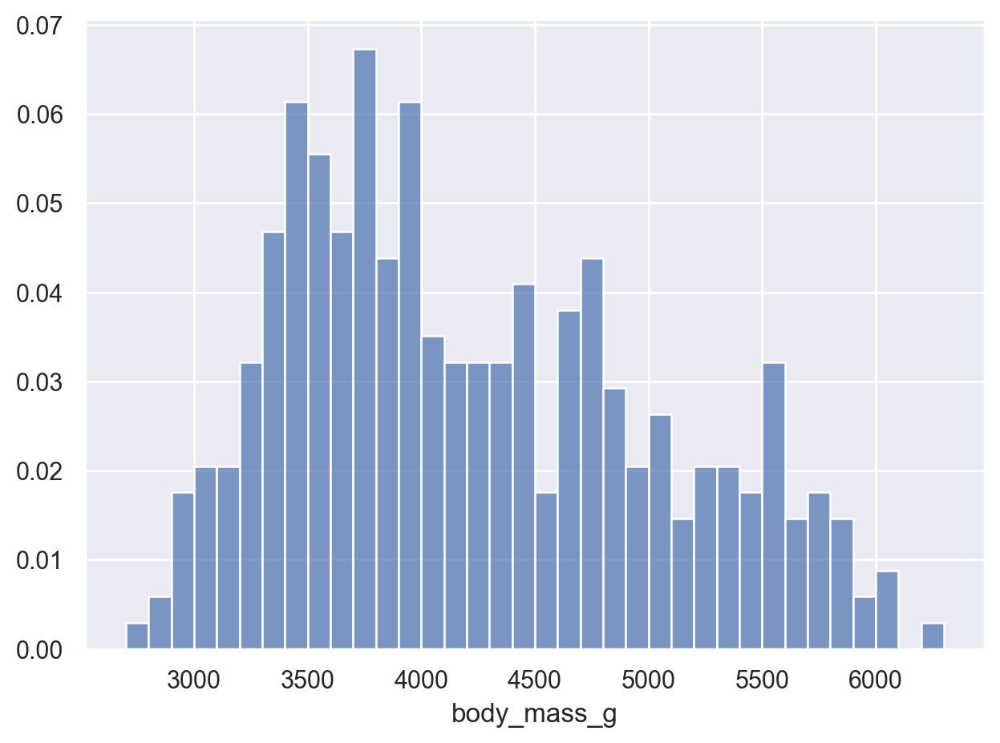

In [50]:
(
    so.Plot(penguins, x="body_mass_g")
    .add(so.Bars(), so.Hist("proportion", binwidth = 100)) # x값을 binwidth 나누어 count를 계산! binwidth를 100로 설정해서 100g 단위로 펭귄 쪼갬
).show()

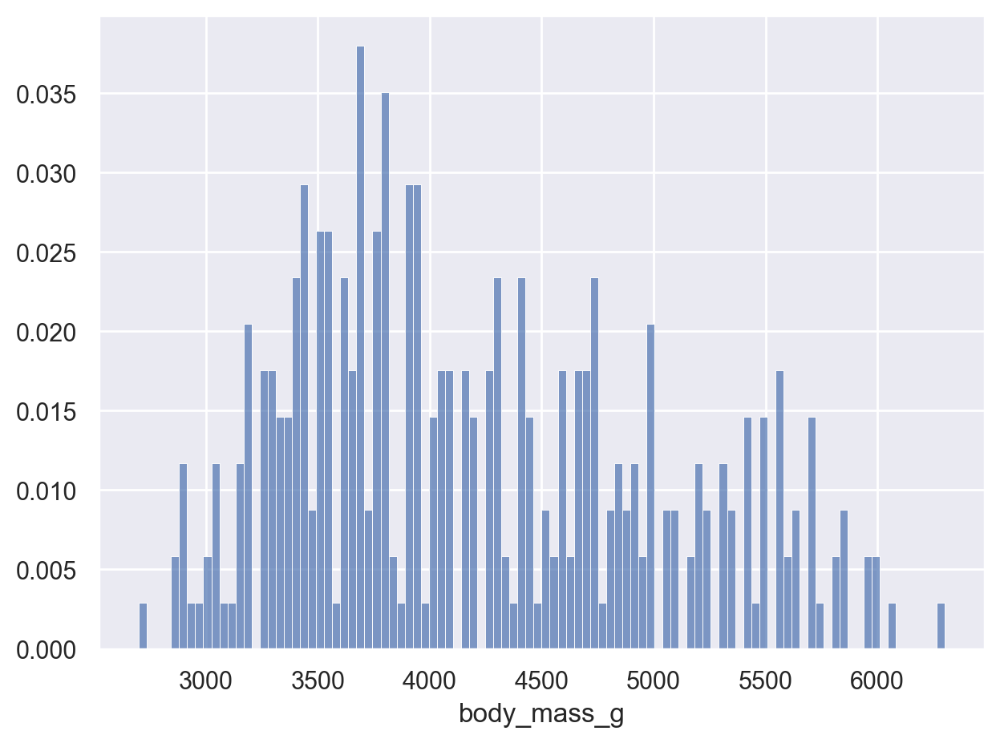

In [52]:
(
    so.Plot(penguins, x="body_mass_g")
    .add(so.Bars(), so.Hist("proportion", bins = 100))  # bin의 개수
).show()

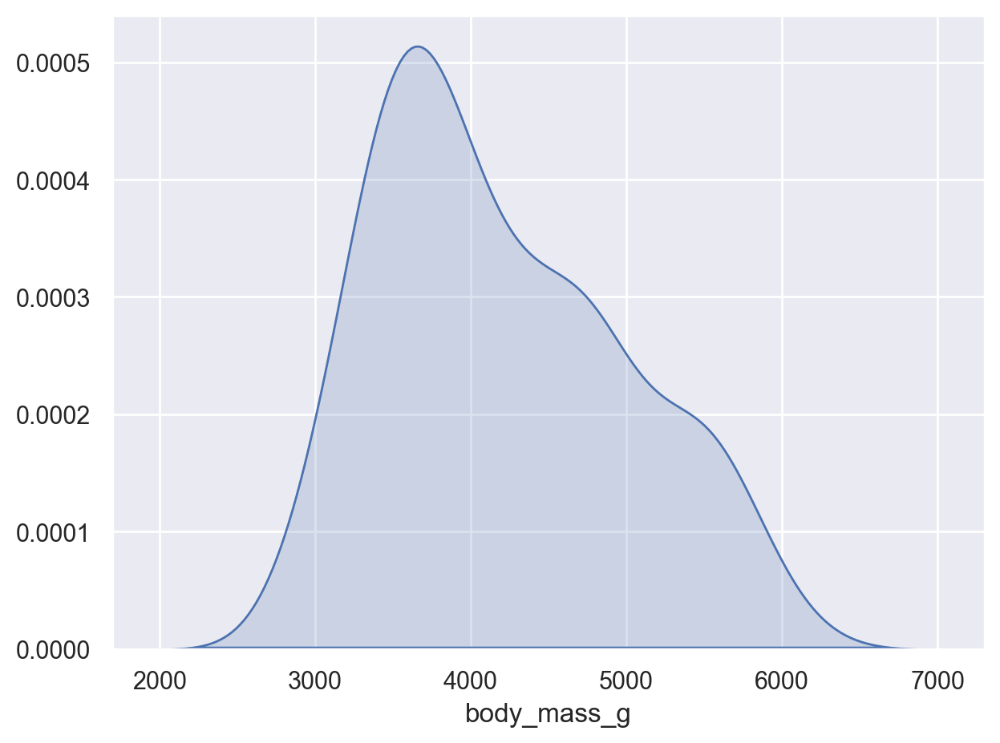

In [53]:
# Density plot: 넓이가 1이 되도록
(
    so.Plot(penguins, x="body_mass_g")
    .add(so.Area(), so.KDE())  # Density plot
).show()

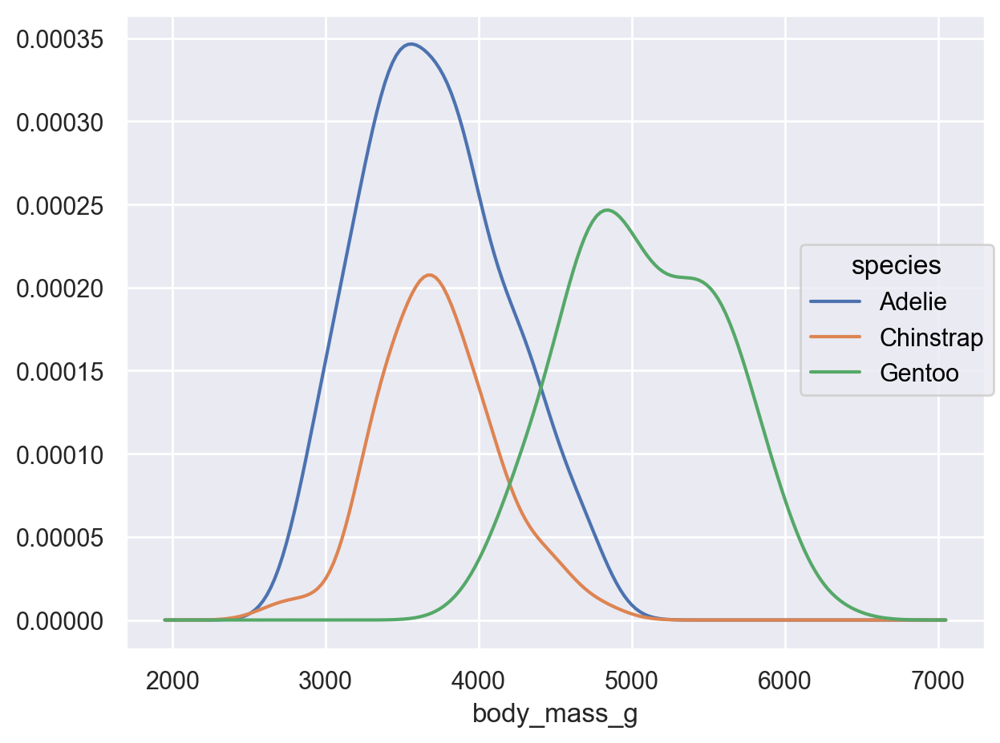

In [55]:
# Density plot: 넓이가 1이 되도록
(
    so.Plot(penguins, x="body_mass_g", color = "species")
    .add(so.Line(), so.KDE())  # Density plot
).show()

# 종별 분포 확인

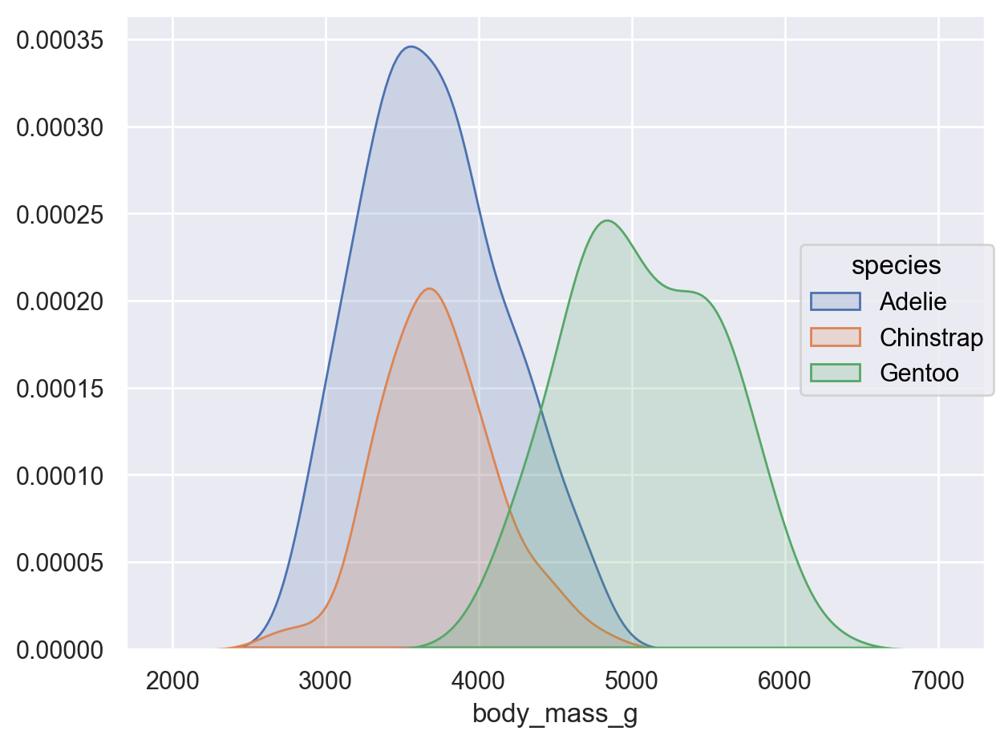

In [56]:
# Density plot: 넓이가 1이 되도록
(
    so.Plot(penguins, x="body_mass_g", color = "species")
    .add(so.Area(), so.KDE())  # Density plot
).show()

# 종별 분포 확인

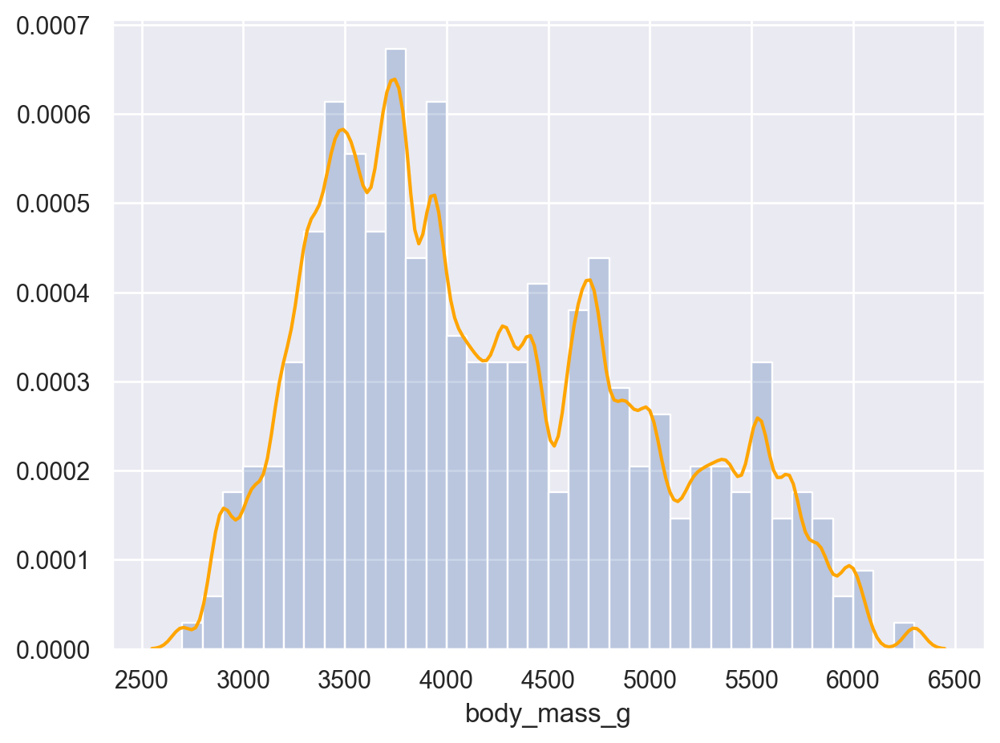

In [57]:
# Density plot: 넓이가 1이 되도록
(
    so.Plot(penguins, x="body_mass_g")
    .add(so.Line(color="orange"), so.KDE(bw_adjust=.2))  # Density bandwidth: binwidth에 대응
    .add(so.Bars(alpha=.3), so.Hist("density", binwidth=100))  # stat="density" 밀도
).show()

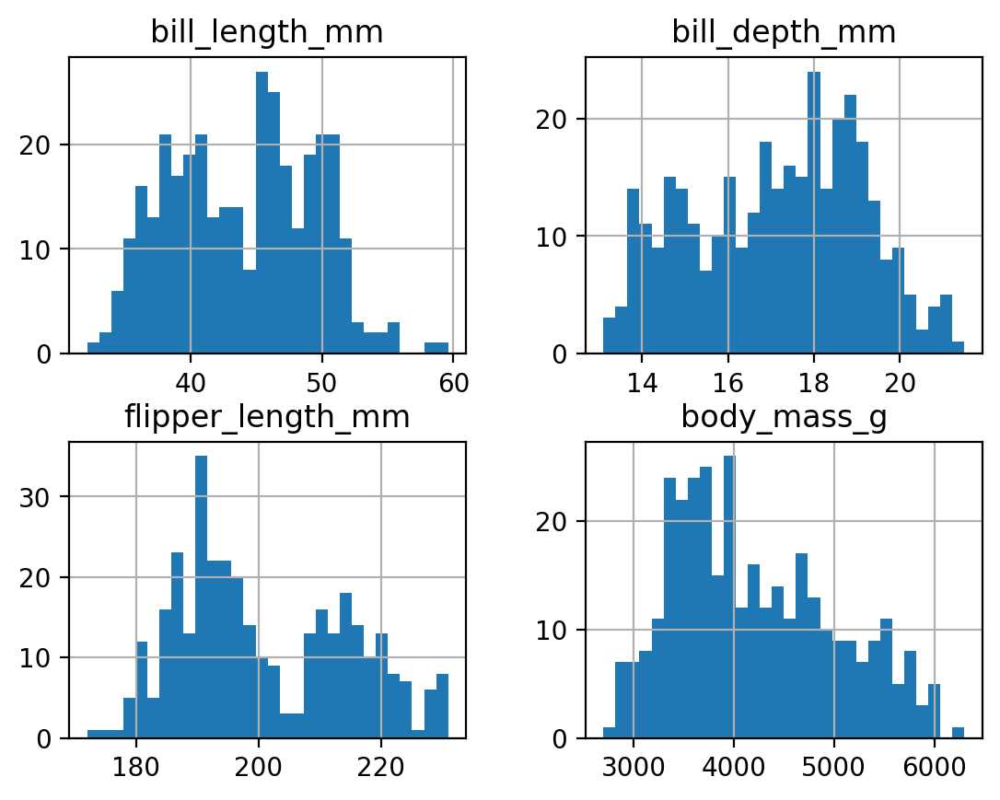

In [58]:
# pandas의 hist() method: 모든 연속 변수에 대해 histogram을 그림
penguins.hist(bins=30)
plt.show() # 생략

# Visualizing relationships

## A numerical and a categorical variable

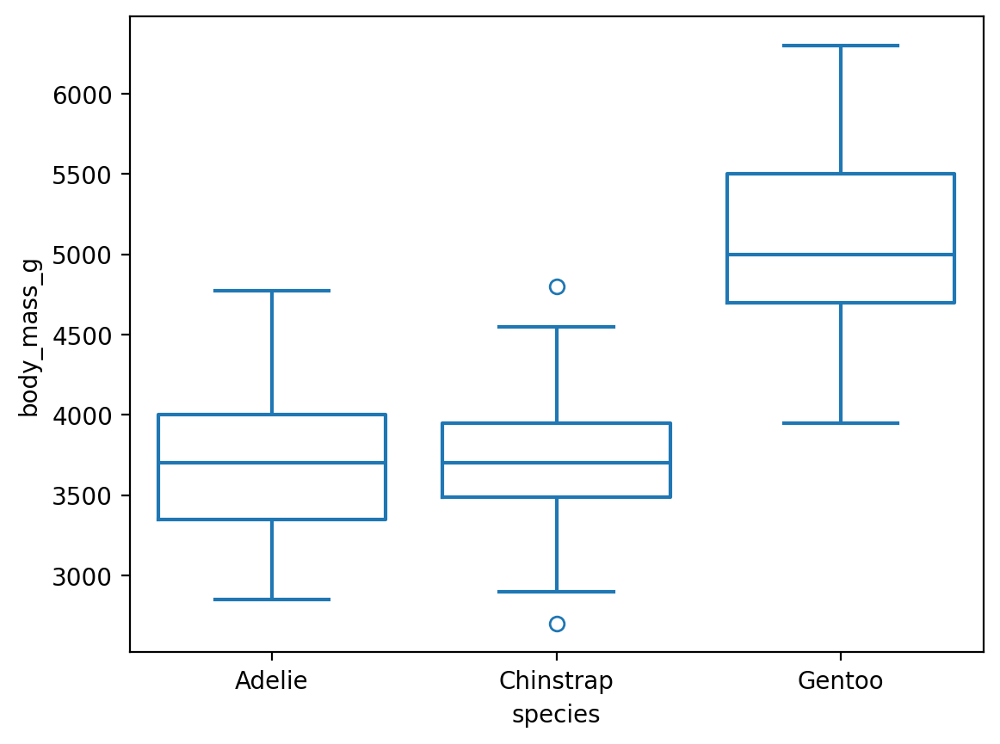

In [34]:
sns.boxplot(penguins, x="species", y="body_mass_g", fill=False)  # fill: box의 색을 채울지 여부
plt.show()  # 생략해도 무방

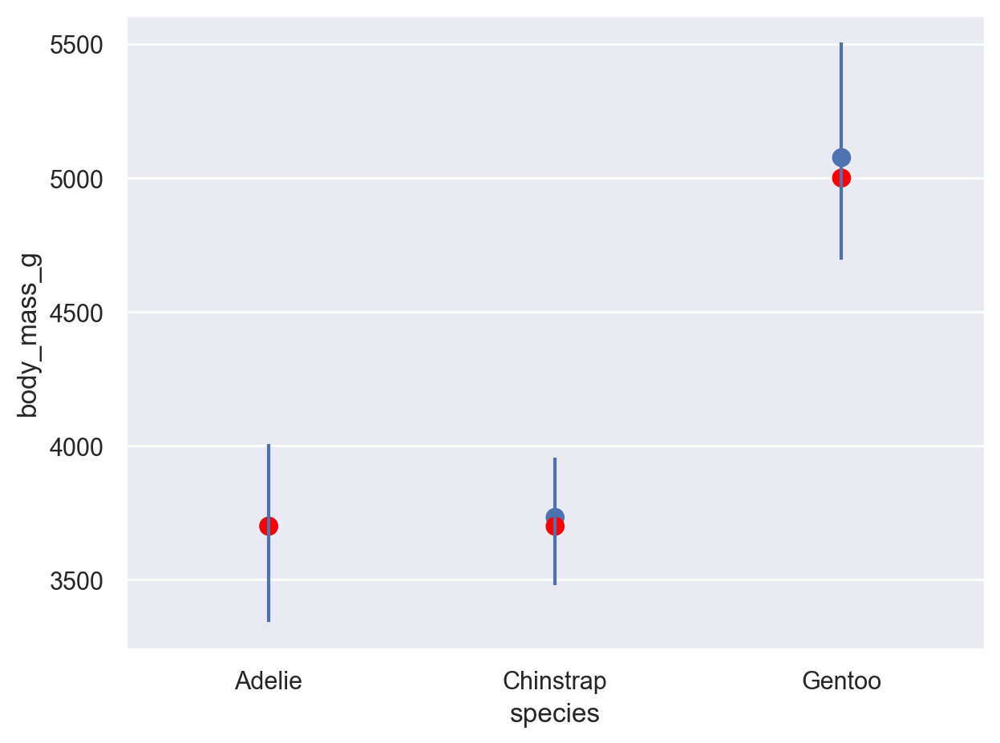

In [35]:
(
    so.Plot(penguins, x="species", y="body_mass_g")
    .add(so.Dot(pointsize=8), so.Agg("mean"))  # .Agg(): aggregation, default는 mean
    .add(so.Dot(pointsize=8, color= 'red'), so.Agg("median")) 
    .add(so.Range(), so.Est(errorbar=("pi", 50)))   # .Range(): 기본 min/max range, 
                                                    # .Est(): estimator (50이면 median을 중간으로 해서 50, 즉 25~75%를 나타낸다? pi: percentile interval)
).show()

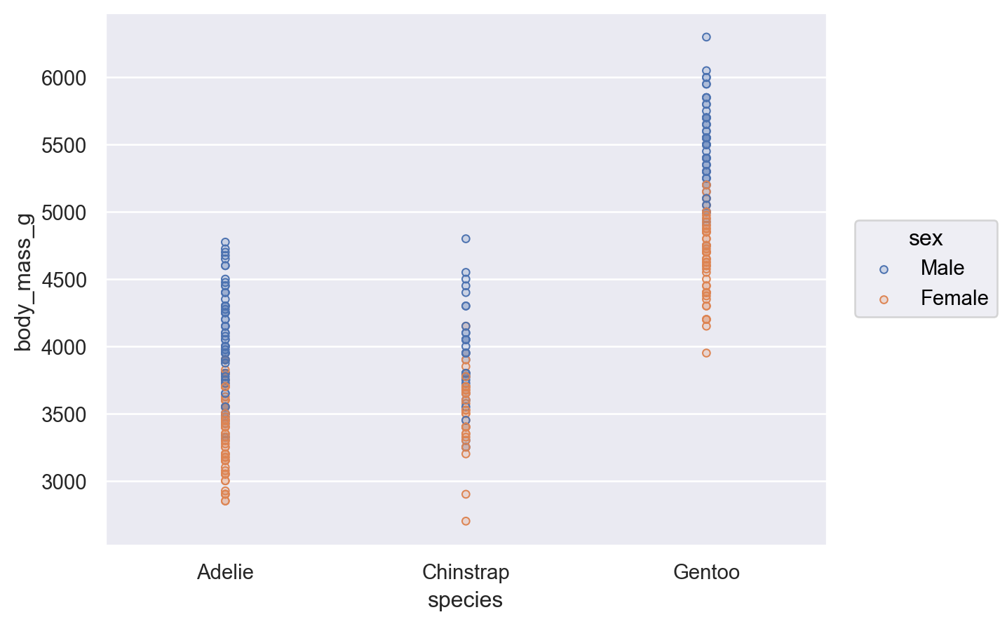

In [36]:
(
    so.Plot(penguins, x="species", y="body_mass_g", color="sex")
    .add(so.Dots()) # Jitter, Dodge를 해야 좌우로 흩어지고 빗겨져서 그려진다, Dots만 하면 일직선

)

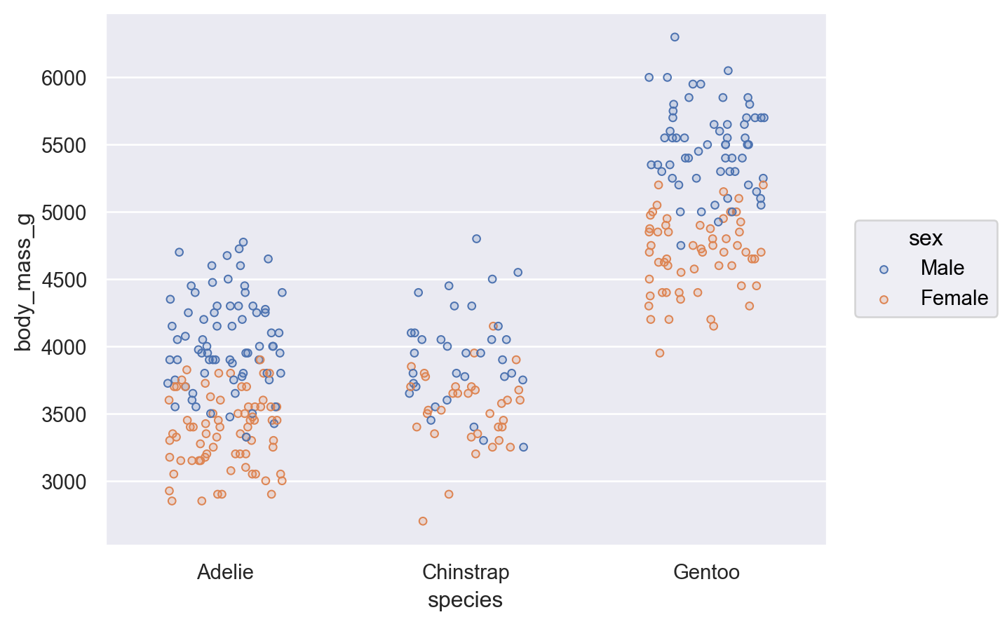

In [37]:
(
    so.Plot(penguins, x="species", y="body_mass_g", color="sex")
    .add(so.Dots(), so.Jitter(width=0.6)) # Jitter 해야 좌우로 흩어져서 그려진다, Dots만 하면 일직선

)

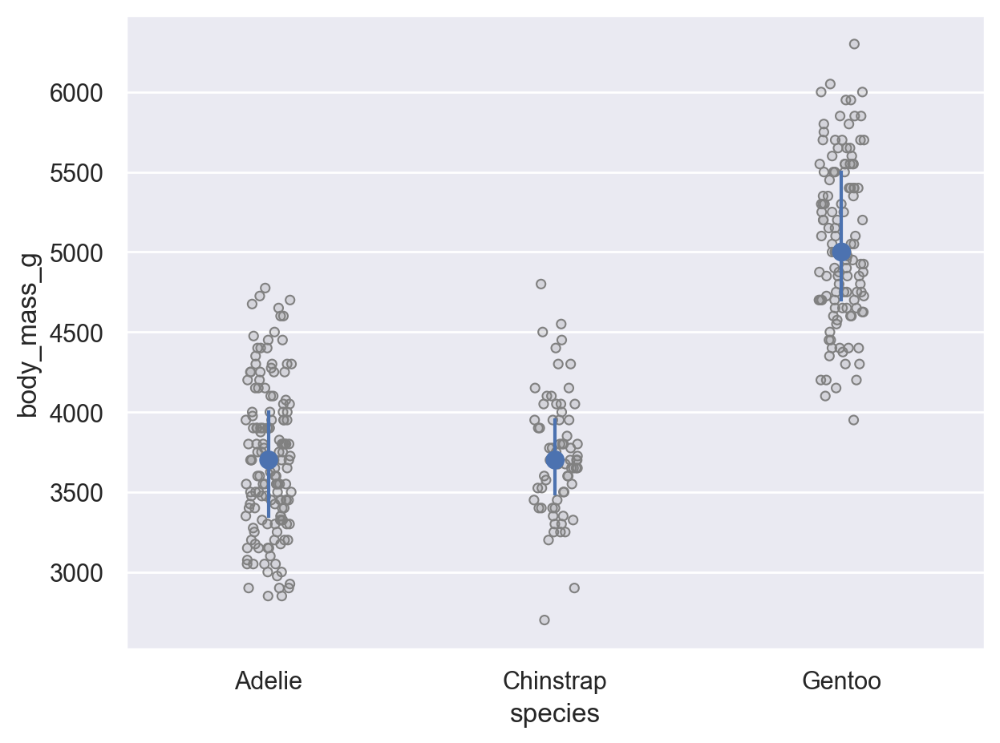

In [38]:
(
    so.Plot(penguins, x="species", y="body_mass_g")
    .add(so.Dots(color=".5"), so.Jitter()) # so.Jitter(): 흐트려뜨려 그리기
    .add(so.Dot(pointsize=8), so.Agg("median"))  # .Agg(): aggregation, default는 mean
    .add(so.Range(), so.Est(errorbar=("pi", 50)))   # .Range(): 기본 min/max range, 
                                                    # .Est(): estimator
).show()

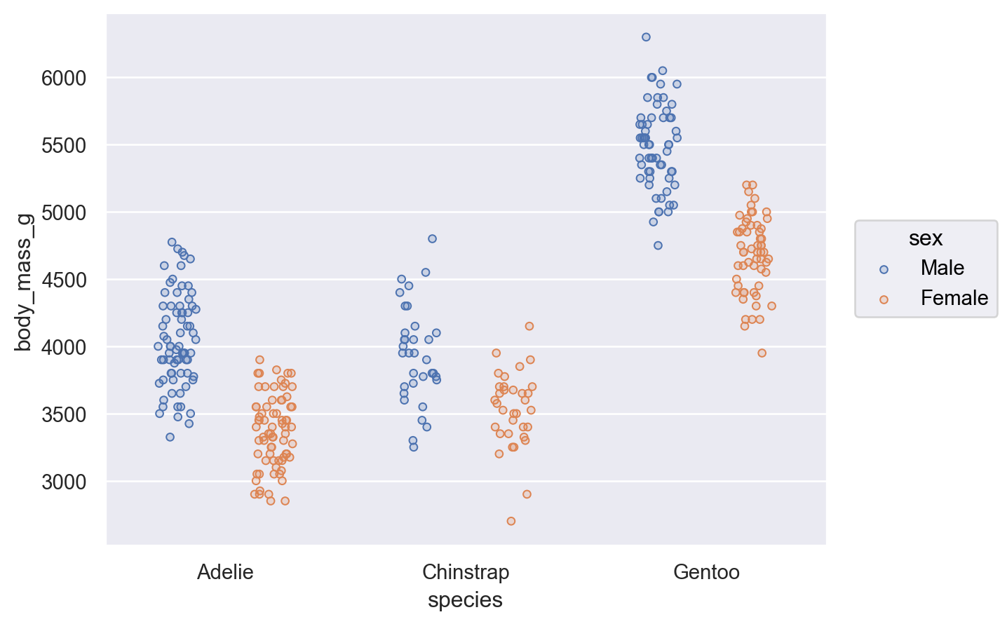

In [39]:
(
    so.Plot(penguins, x="species", y="body_mass_g", color="sex")
    .add(so.Dots(), so.Jitter(), so.Dodge(gap=.9)) # Dodge는 살짝 빗겨서 그린다

)

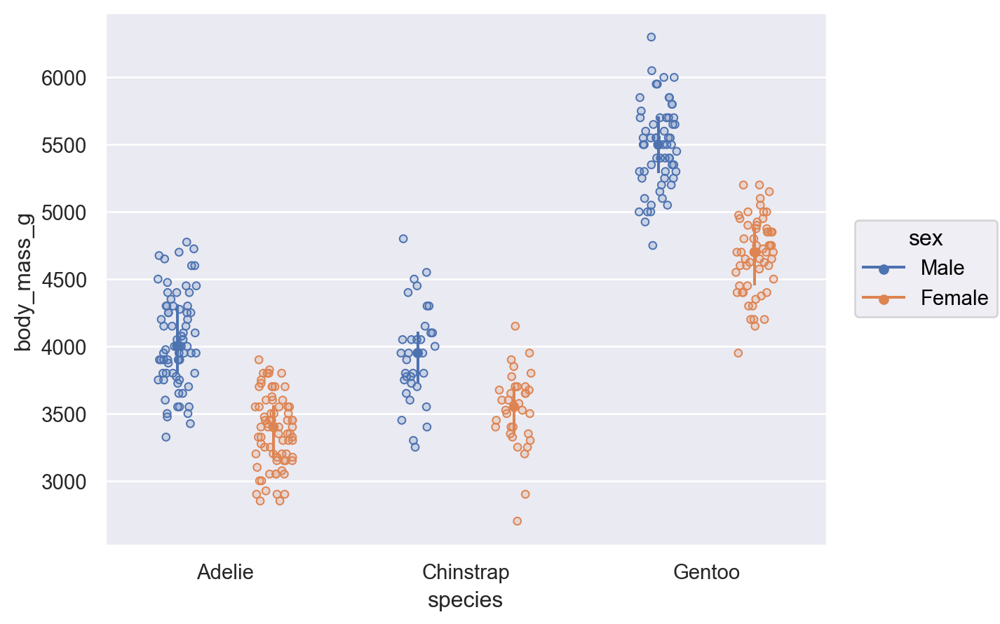

In [40]:
(
    so.Plot(penguins, x="species", y="body_mass_g", color="sex")
    .add(so.Dots(), so.Jitter(), so.Dodge())
    .add(so.Dot(pointsize=5), so.Agg("median"), so.Dodge())
    .add(so.Range(), so.Est(errorbar=("pi", 50)), so.Dodge())
)

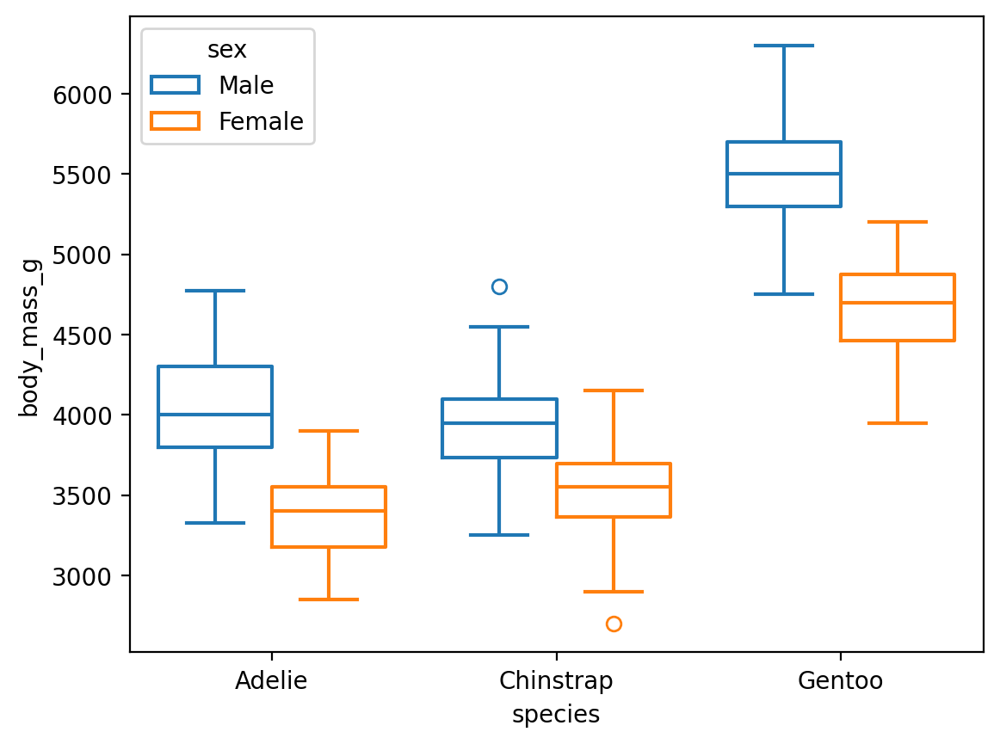

In [41]:
sns.boxplot(penguins, x="species", y="body_mass_g", hue="sex", fill=False)
plt.show() # 생략해도 무방

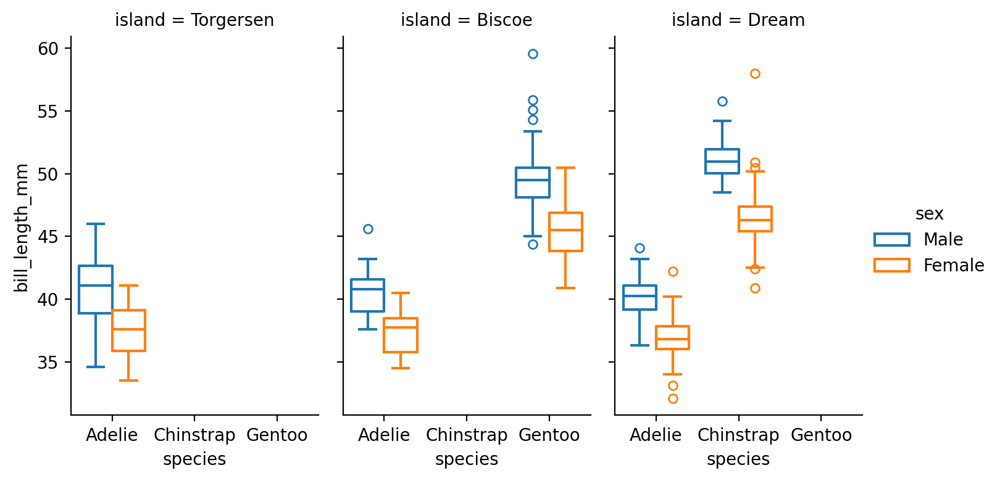

In [42]:
# 여러 개 그리려면 boxplot에서 확장된 게 아니라 catplot 그려야된다. 
sns.catplot(
    data=penguins, x="species", y="bill_length_mm", hue="sex", col="island",
    kind="box", fill=False, height=4, aspect=.6,
) # height 높이 / aspect 가로세로 비율
plt.show()

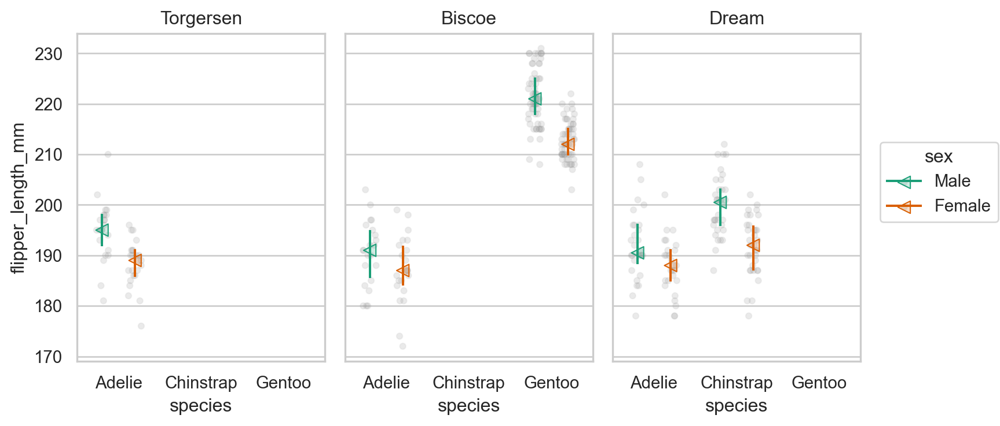

In [43]:
# Build a boxplot!
def boxplot(df, x, y, color=None, alpha=0.1):
    return (
        so.Plot(df, x=x, y=y, color=color)
        .add(so.Dots(alpha=alpha, color=".6"), so.Jitter(), so.Dodge())
        .add(so.Range(), so.Est(errorbar=("pi", 50)), so.Dodge())
        .add(so.Dots(pointsize=8, marker="<"), so.Agg("median"), so.Dodge())
        .scale(color="Dark2")
        .theme({**sns.axes_style("whitegrid")})
    )

(
    boxplot(penguins, x="species", y="flipper_length_mm", color="sex")
    .facet("island")
    .layout(size=(8, 4))
)

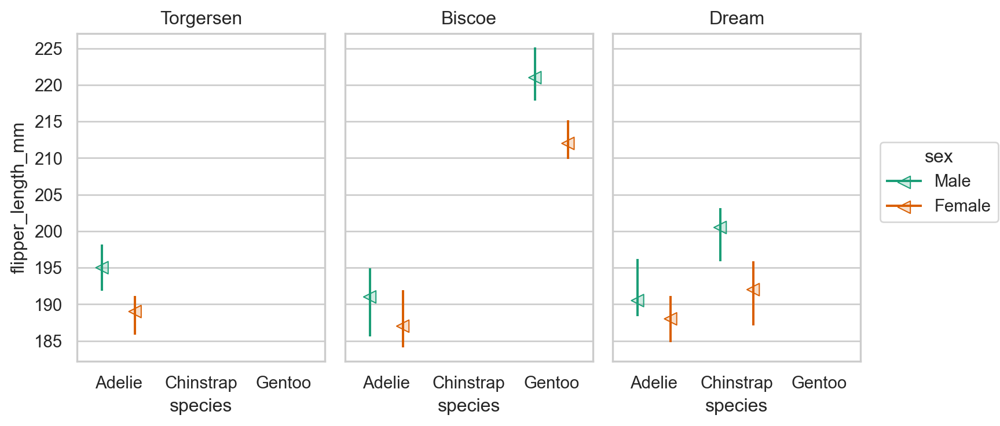

In [44]:
# Build a rangeplot!
def rangeplot(df, x, y, color=None):
    return (
        so.Plot(df, x=x, y=y, color=color)
        .add(so.Range(), so.Est(errorbar=("pi", 50)), so.Dodge())
        .add(so.Dots(pointsize=8, marker="<"), so.Agg("median"), so.Dodge())
        .scale(color="Dark2")
        .theme({**sns.axes_style("whitegrid")})
    )

(
    rangeplot(penguins, x="species", y="flipper_length_mm", color="sex")
    .facet("island")
    .layout(size=(8, 4))
)

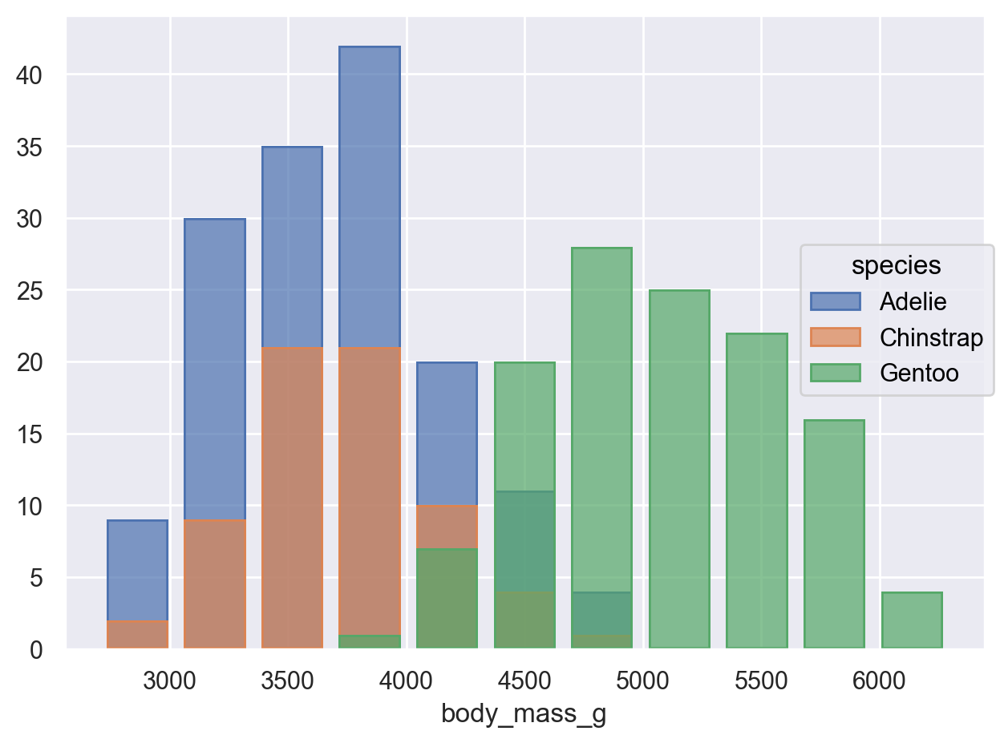

In [45]:
(
    so.Plot(penguins, x="body_mass_g", color="species")
    .add(so.Bar(), so.Hist()) 
).show()
# Hist(): 다양한 parameter가 있음...

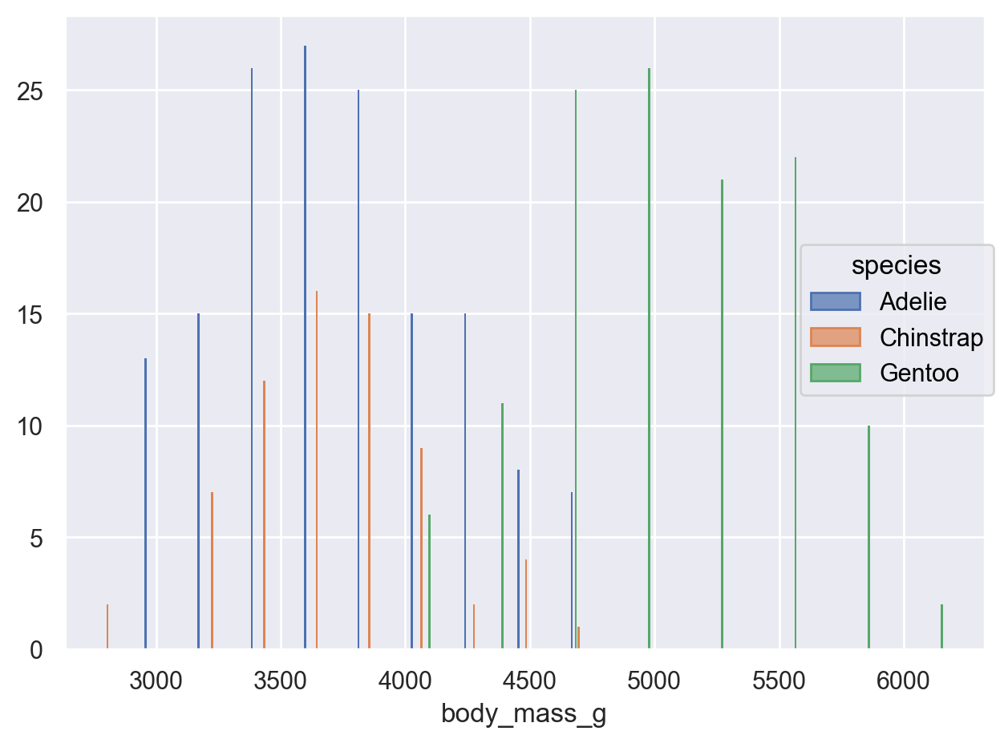

In [46]:
(
    so.Plot(penguins, x="body_mass_g", color="species")
    .add(so.Bar(), so.Hist(common_bins=False)) # bins을 공유하지 않도록
).show()

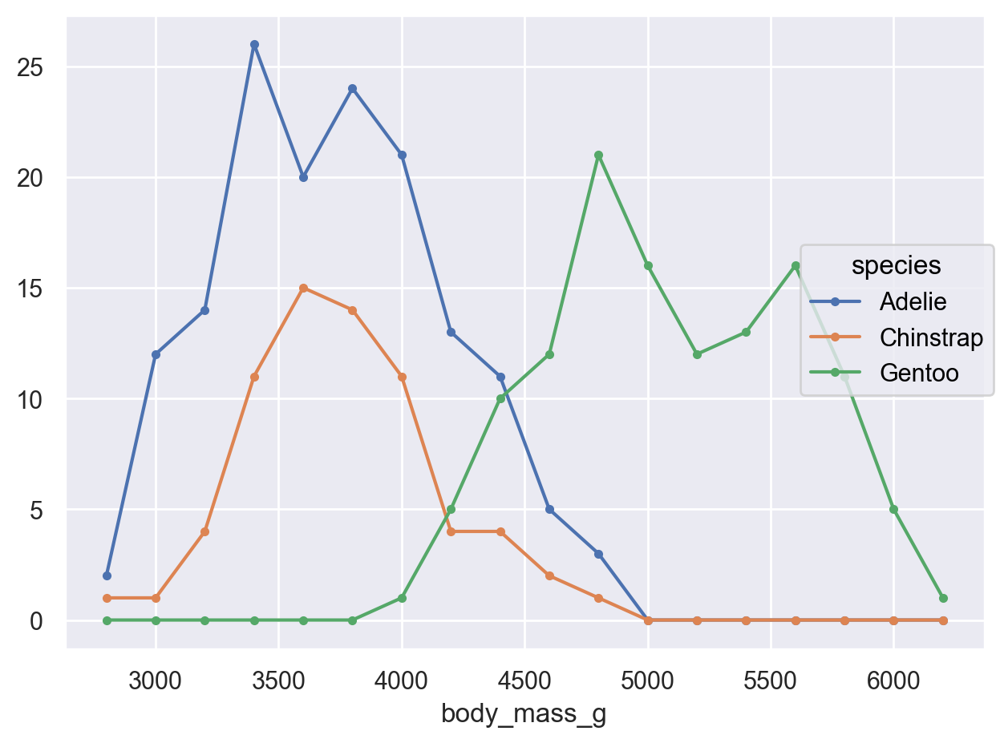

In [47]:
(
    so.Plot(penguins, x="body_mass_g", color="species")
    .add(so.Line(marker="."), so.Hist(binwidth=200))  # Line에 maker "."을 표시
).show()

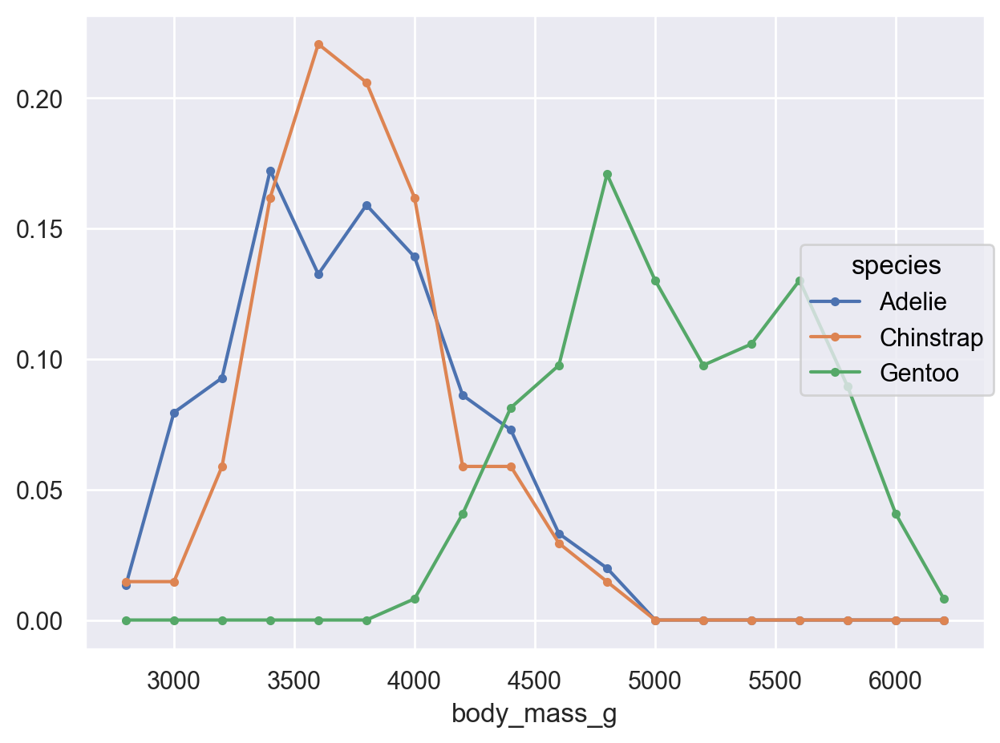

In [48]:
(
    so.Plot(penguins, x="body_mass_g", color="species")
    .add(so.Line(marker="."), so.Hist(binwidth=200, stat="proportion",  common_norm=False))  # common_norm = False, 전체가 아닌 저 specie 각각을 100퍼로 본다.
).show()

# 목적: 종 안에서의 상대적인 분포를 보고 싶어서
# Gentoo가 퍼져 있는 이유: 원래 뚱뚱해서 range가 퍼질 수 밖에 없다..? 값이 원래 큰 경우, range가 크다. 가격도 5천만원인 경우 천만원씩 왔다갔다, 만원인 경우는 얼마 안 왓다갔다 한다. 

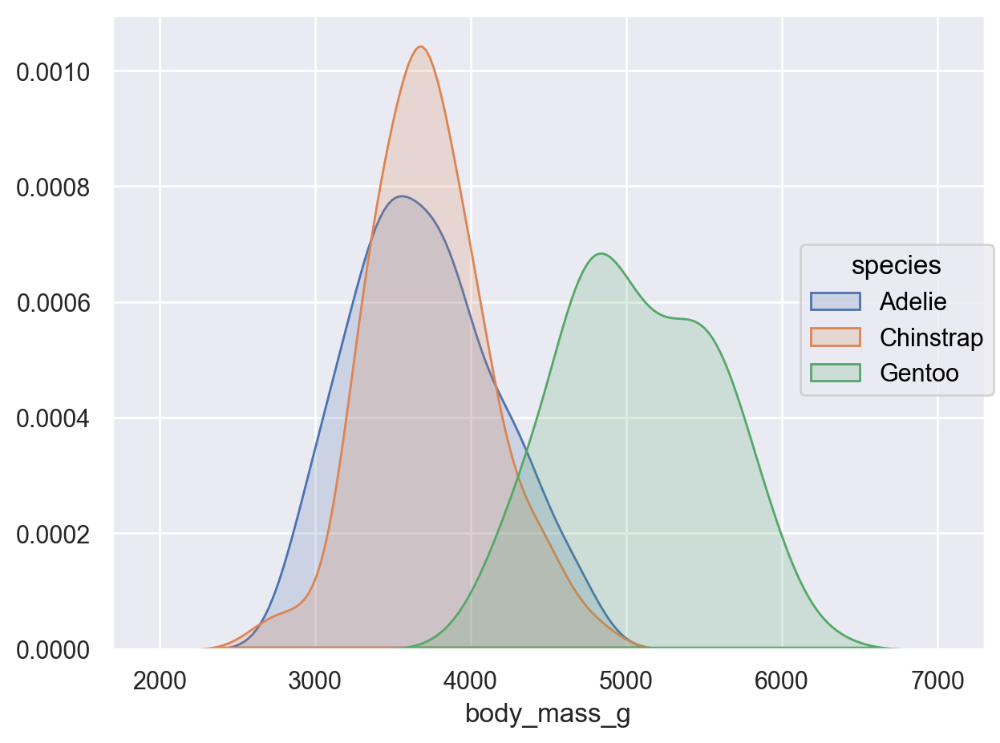

In [49]:
(
    so.Plot(penguins, x="body_mass_g", color="species")
    .add(so.Area(), so.KDE(common_norm=False))  # Density plot, species별로 넓이가 1이 되도록
).show()

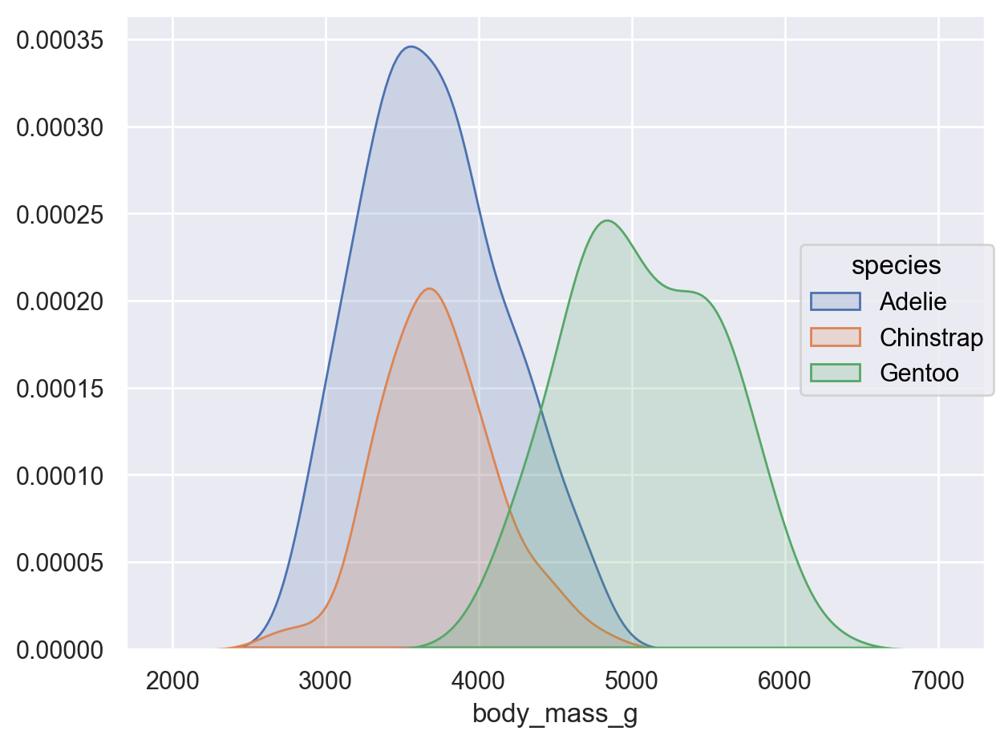

In [50]:
(
    so.Plot(penguins, x="body_mass_g", color="species")
    .add(so.Area(), so.KDE(common_norm=True))  # species 총 넓이가 1이 되도록
).show()

## Two categorical variables

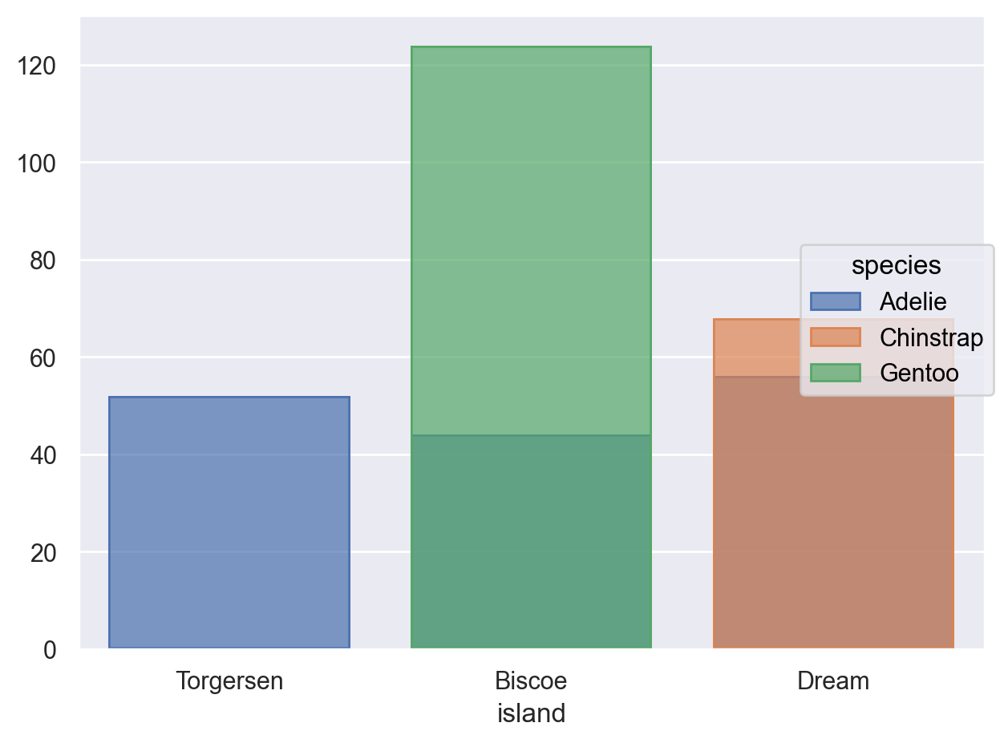

In [51]:
p = so.Plot(penguins, x="island", color="species")
p.add(so.Bar(), so.Count()).show()  # Bar() mark + Count() transformation

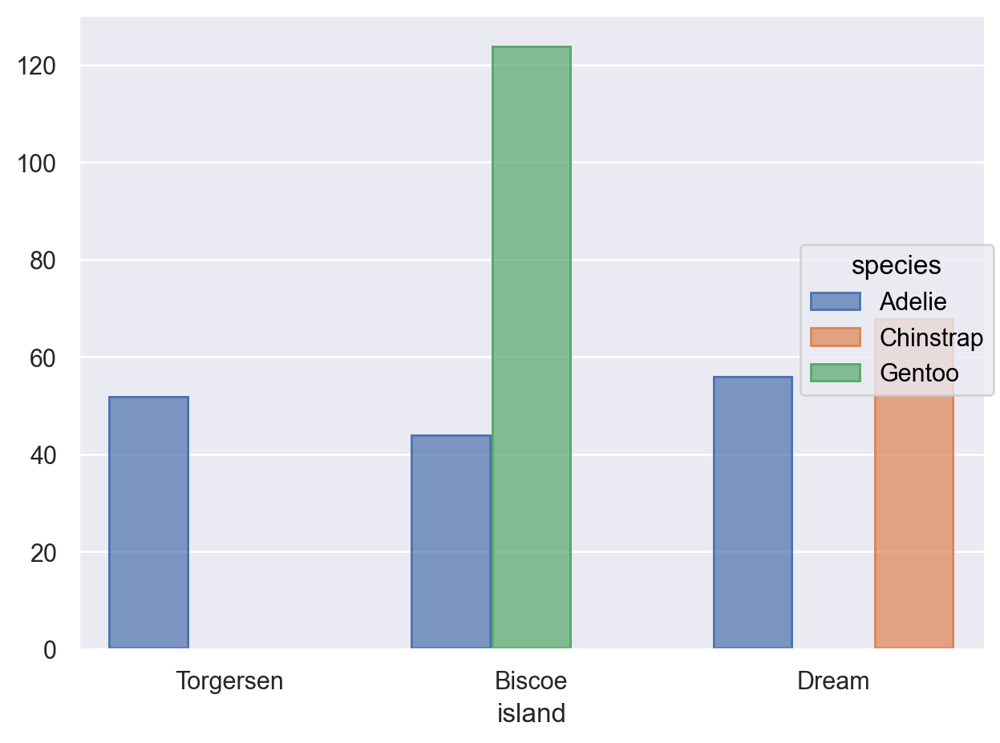

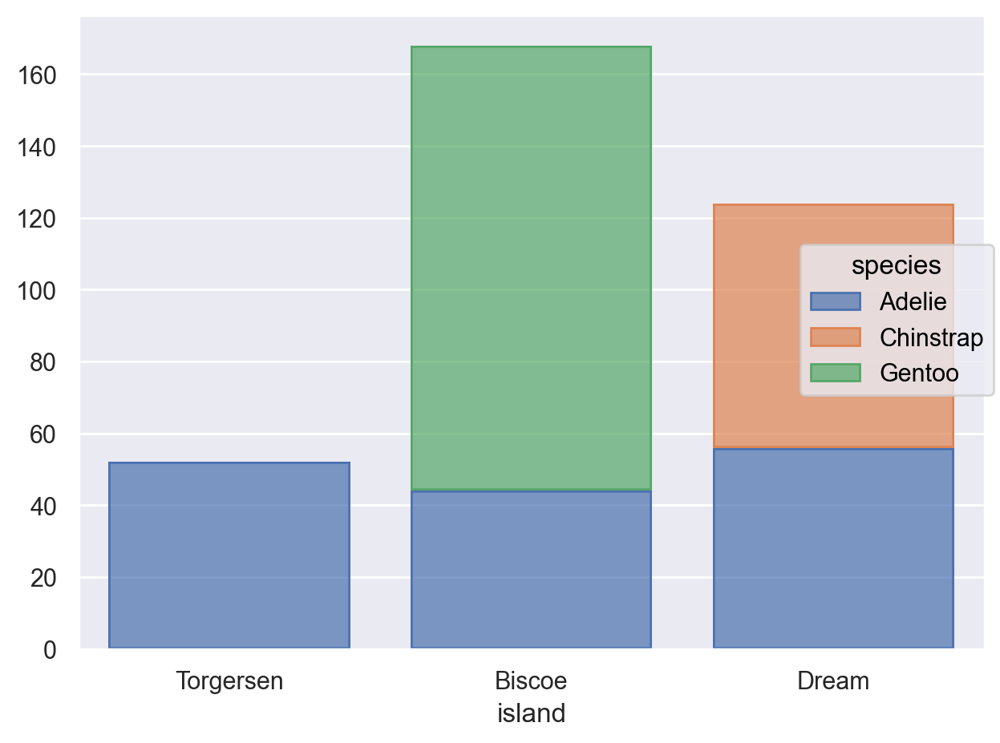

In [52]:
left = p.add(so.Bar(), so.Count(), so.Dodge()).show()   # 나란히 표시
right = p.add(so.Bar(), so.Count(), so.Stack()).show()  # stacking

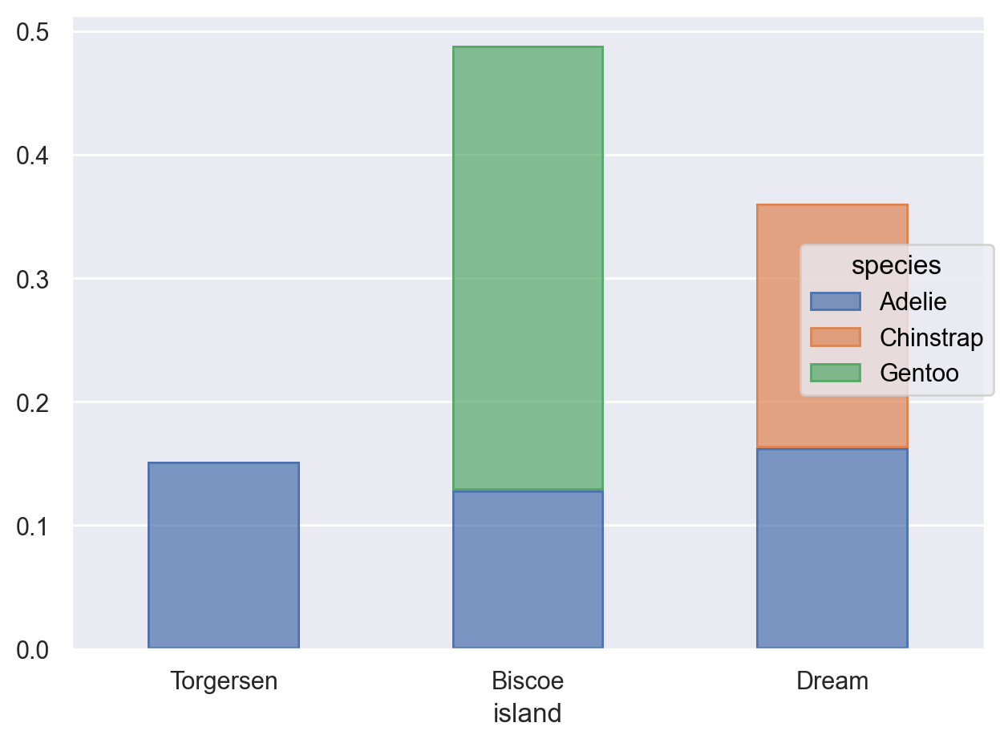

In [53]:
# 각 비율값의 합이 1이 되도록, 즉 모든 카테고리에 걸쳐 normalize
p.add(
    so.Bar(width=.5), so.Hist("proportion"),  # proportion; stat="count"로 하면 앞서 so.Count()와 동일
    so.Stack()  # stacking
).show()

C:\Users\ygeun\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_stats\counting.py:228: UserWarning: Undefined variable(s) passed for Hist.common_norm: 'x'.
  self._check_grouping_vars("common_norm", grouping_vars)


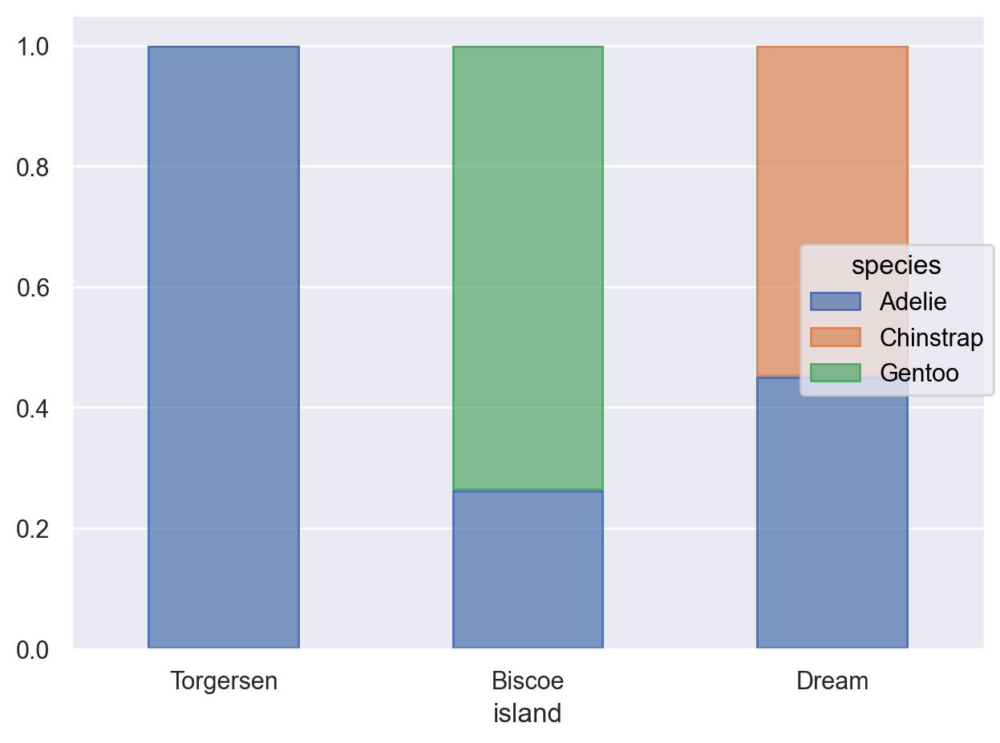

In [54]:
# x축 기준으로 normalize (지금은 각 island 별로 1로 하고 싶을 때)
p.add(
    so.Bar(width=.5), so.Hist("proportion", common_norm=["x"]),  # proportion; 
    so.Stack()  # stacking
).show()
# warning이 뜰 수 있음!

C:\Users\ygeun\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_stats\counting.py:228: UserWarning: Undefined variable(s) passed for Hist.common_norm: 'x'.
  self._check_grouping_vars("common_norm", grouping_vars)


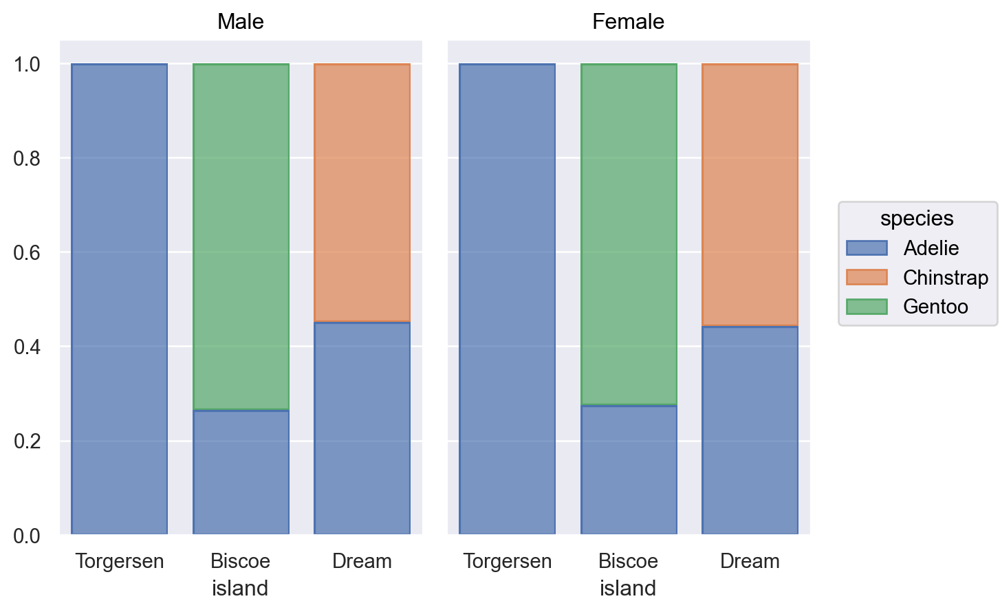

In [55]:
# x축, facet의 column 기준으로 normalize
p.add(
    so.Bar(width=.8), so.Hist("proportion", common_norm=["x", "col"]),  # proportion
    so.Stack(),  # stacking
).facet(col="sex")  # faceting

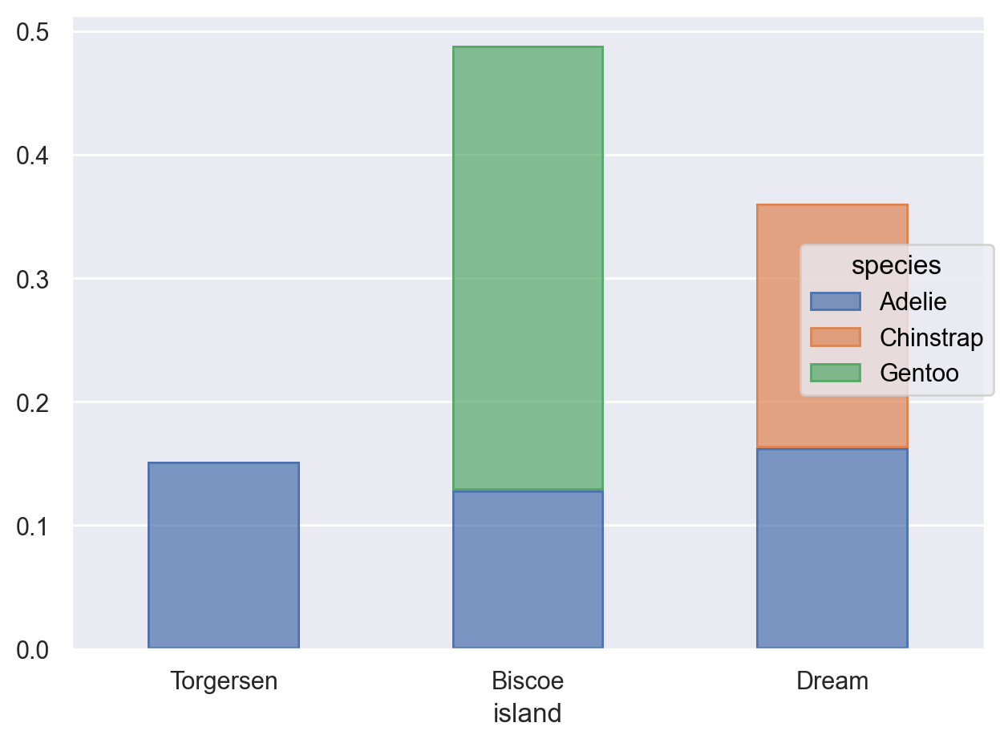

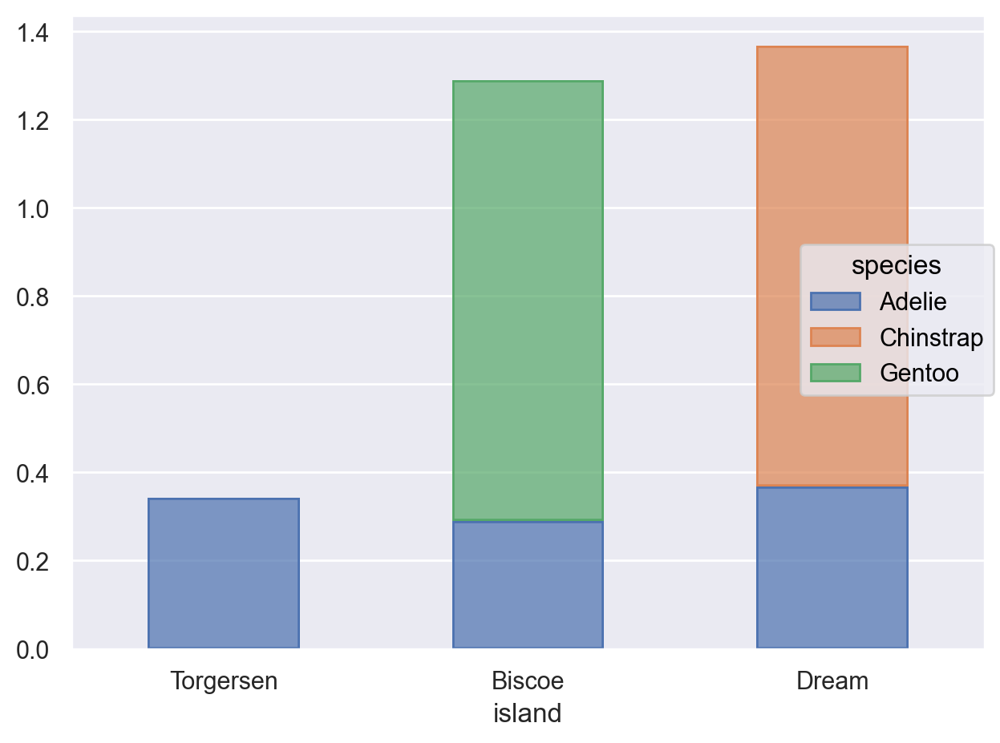

In [56]:
# 각 비율값의 합이 1이 되도록, 즉 모든 카테고리에 걸쳐 normalize (모든 비율 총합 1)
left = p.add(
    so.Bar(width=.5), so.Hist("proportion", common_norm=True),  # common_norm default: True 
    so.Stack()
).show()

# 각 species별로 normalize (그럼 총합은 3, 파란 거끼리 더하면 1, 초록색만 더하면 1 이런 식)
right = p.add(
    so.Bar(width=.5), so.Hist("proportion", common_norm=False),
    so.Stack()
).show()

## Two numerical variables

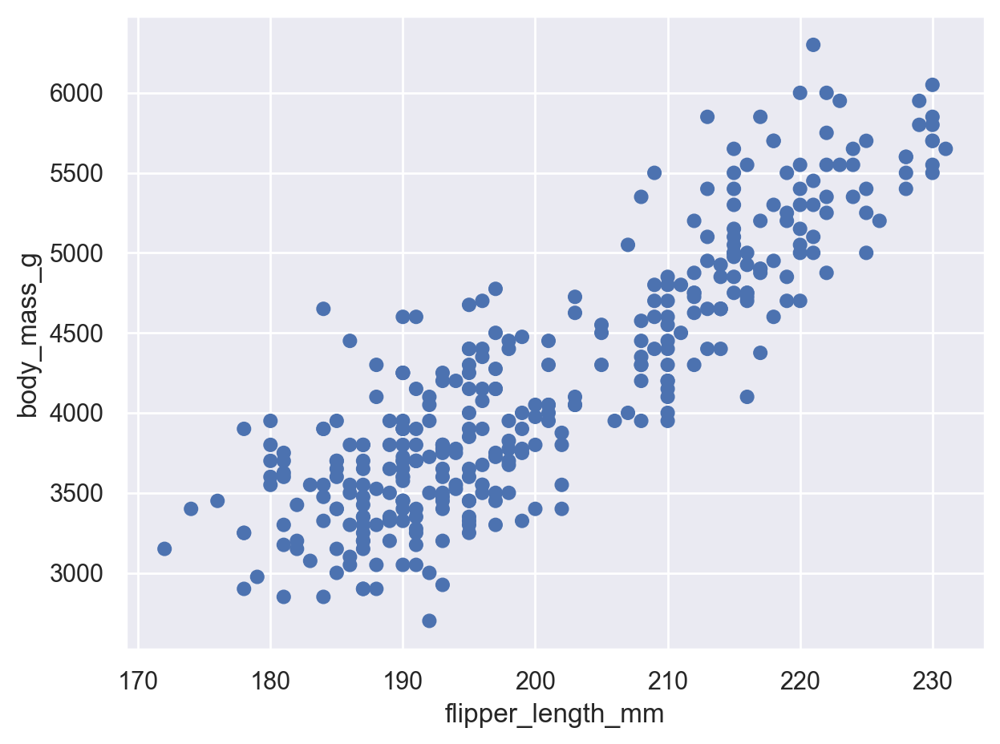

In [57]:
(
    so.Plot(penguins, x="flipper_length_mm", y="body_mass_g")
    .add(so.Dot())  # overplotting에는 so.Dots()가 유리 
).show()

## Three or more variables

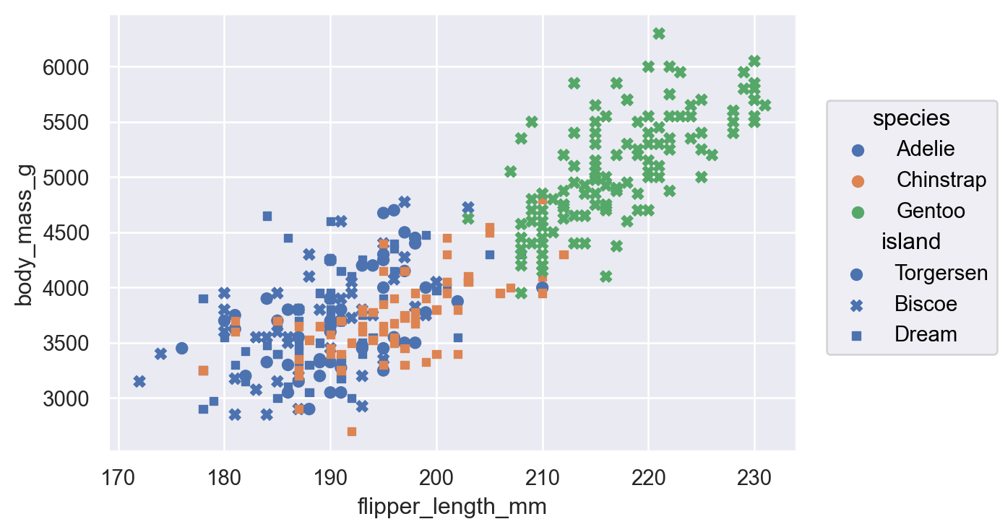

In [58]:
(
    so.Plot(penguins, x="flipper_length_mm", y="body_mass_g",
            color="species", marker="island")
    .add(so.Dot())
    .layout(size=(6, 4))
)

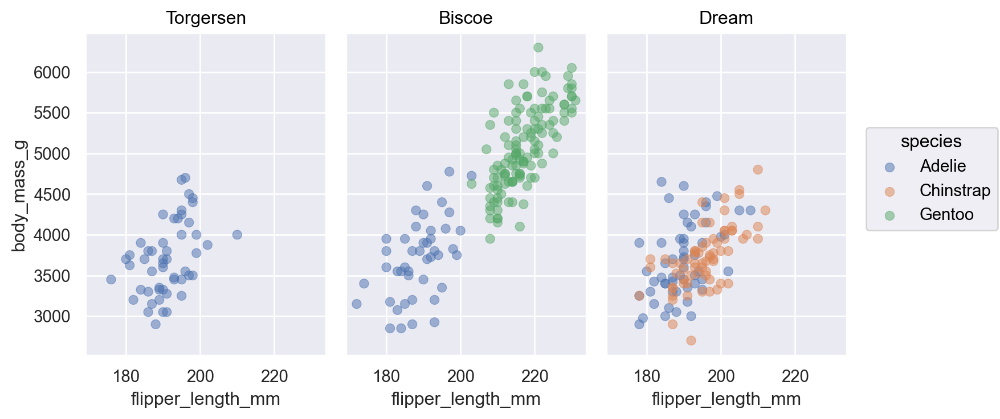

In [59]:
(
    so.Plot(penguins, x="flipper_length_mm", y="body_mass_g",
            color="species")
    .add(so.Dot(alpha=.5))
    .facet("island")
    .layout(size=(8, 4)) 
)

## Time series

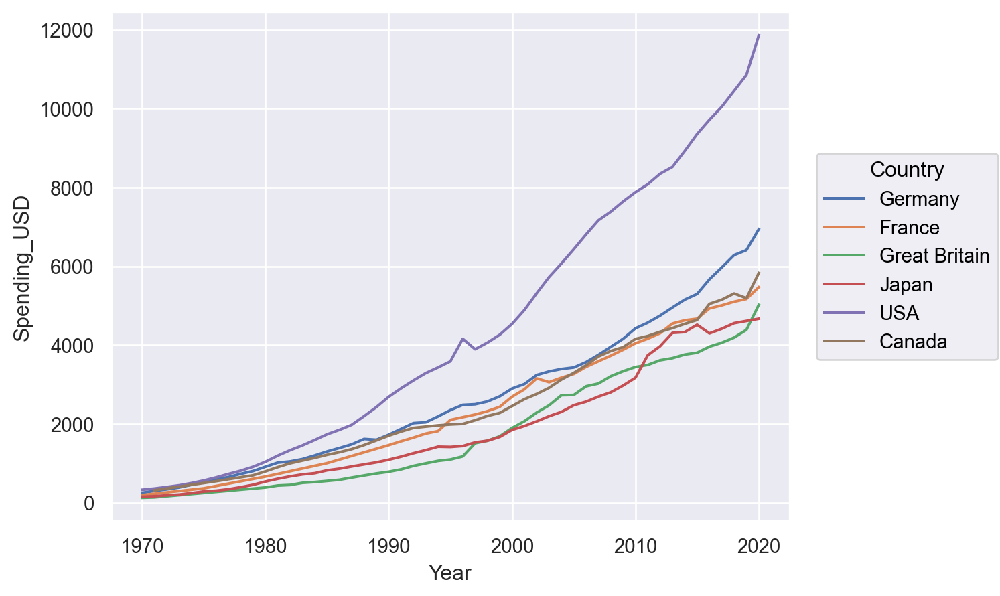

In [60]:
healthexp = sns.load_dataset("healthexp")

(
    so.Plot(healthexp, x="Year", y="Spending_USD", color="Country")
    .add(so.Lines())
)

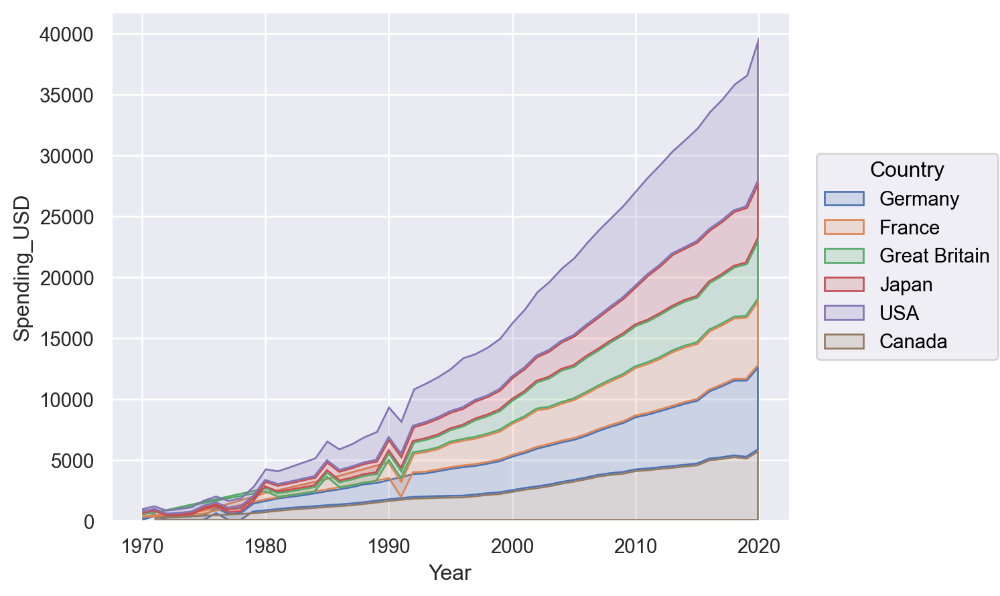

In [61]:
# 전체와 각 그룹의 상태를 동시에 파악
(
    so.Plot(healthexp, x="Year", y="Spending_USD", color="Country")
    .add(so.Area(), so.Stack()) # add stacking
)

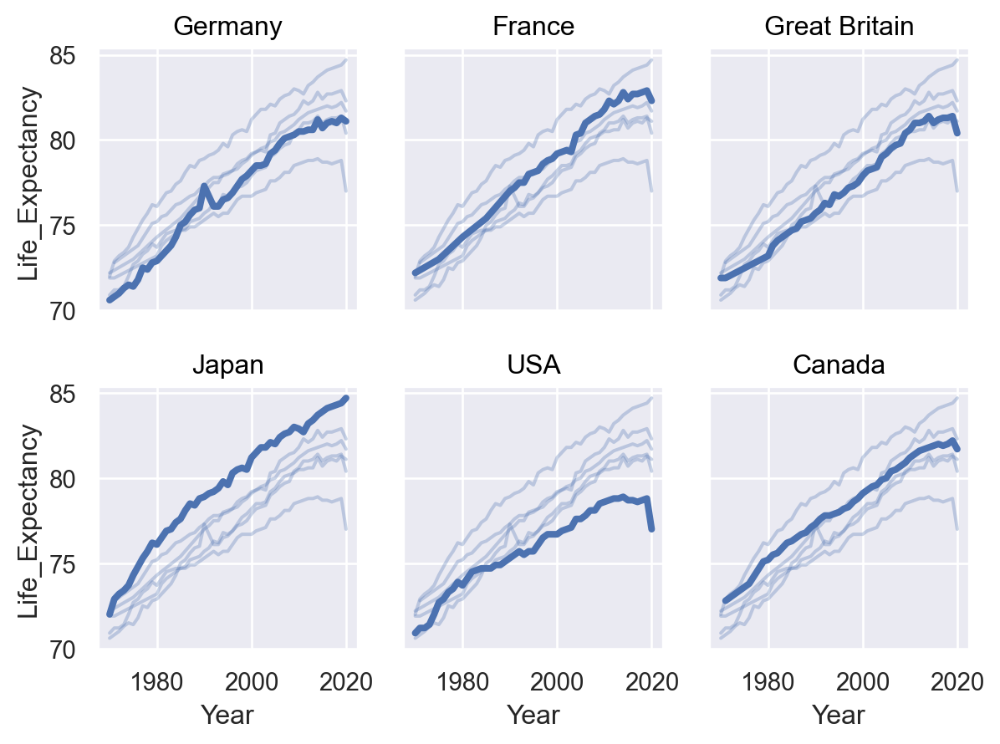

In [62]:
# 국가별로 facet을 하는데, 가운데 굵게 있는 게 해당하는 나라에 데이터이고,

(
    so.Plot(healthexp, x="Year", y="Life_Expectancy")
    .add(so.Line(alpha=.3), group="Country", col=None)
    .add(so.Line(linewidth=3))
    .facet("Country", wrap=3)  # wrap!!!
)

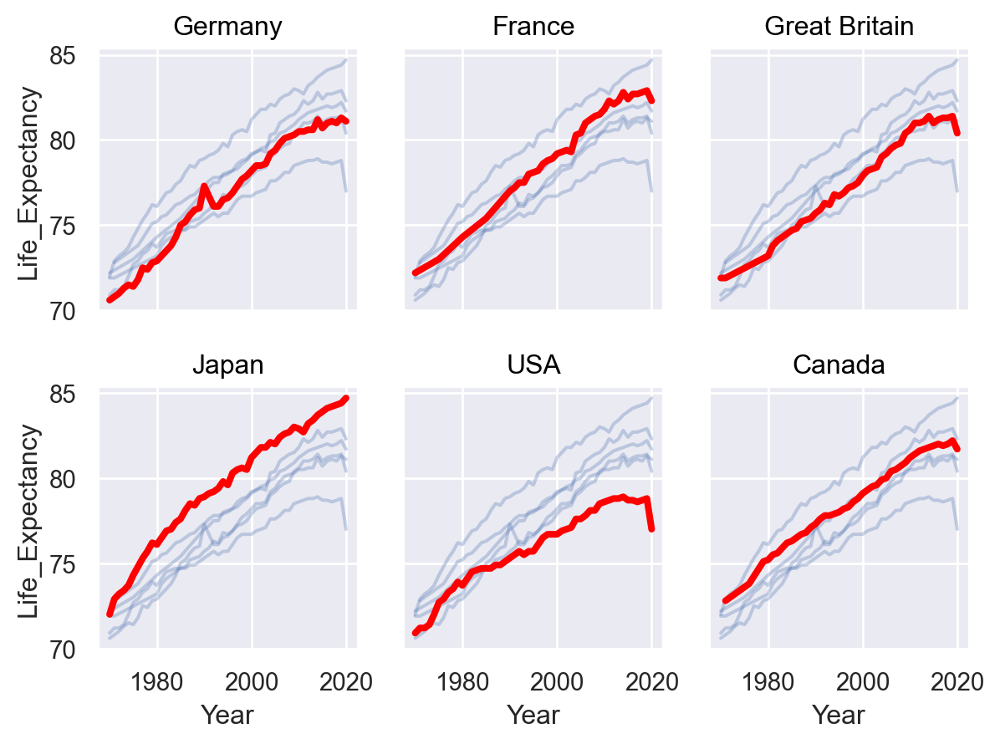

In [63]:
# 국가별로 facet을 하는데, 가운데 굵게 있는 게 해당하는 나라에 데이터이고,

(
    so.Plot(healthexp, x="Year", y="Life_Expectancy")
    .add(so.Line(alpha=.3), group="Country", col = None)
    .add(so.Line(linewidth=3, color = "red"), group = "Country")
    .facet("Country", wrap=3)  # wrap!!!
)

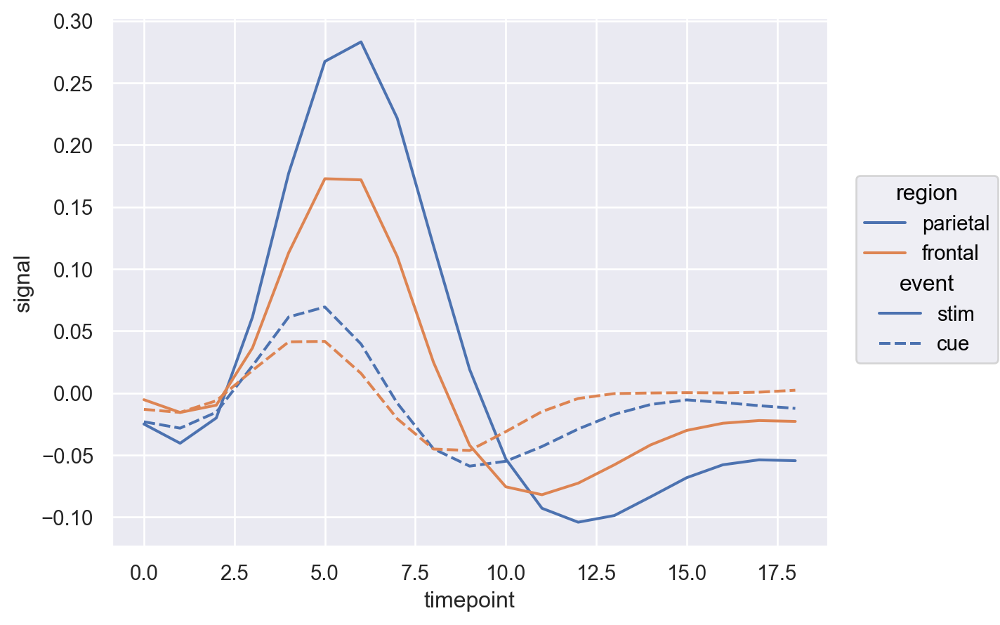

In [64]:
fmri = sns.load_dataset("fmri")

p = so.Plot(fmri, x="timepoint", y="signal", color="region", linestyle="event")
p.add(so.Line(), so.Agg())  # Agg()의 default 함수는 mean

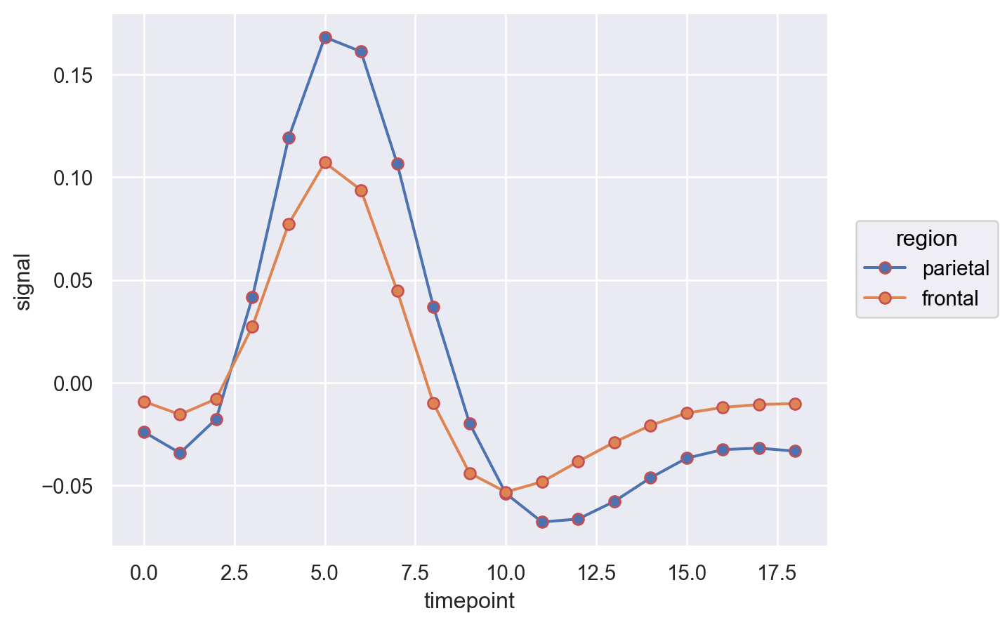

In [65]:
p.add(so.Line(marker="o", edgecolor="r"), so.Agg(), linestyle=None)  # linestyle을 overwrite!

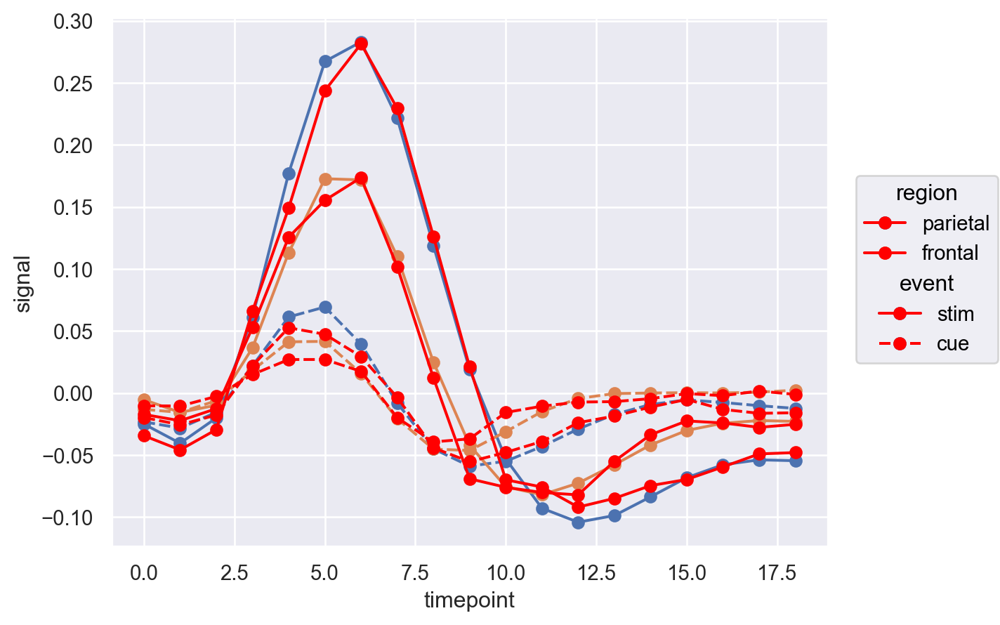

In [66]:
p = so.Plot(fmri, x = "timepoint", y = "signal", color = 'region', linestyle='event')
(
    p.add(so.Line(marker = "o"), so.Agg())
    .add(so.Line(marker = "o", color='red'), so.Agg("median"))
)

# Overploting

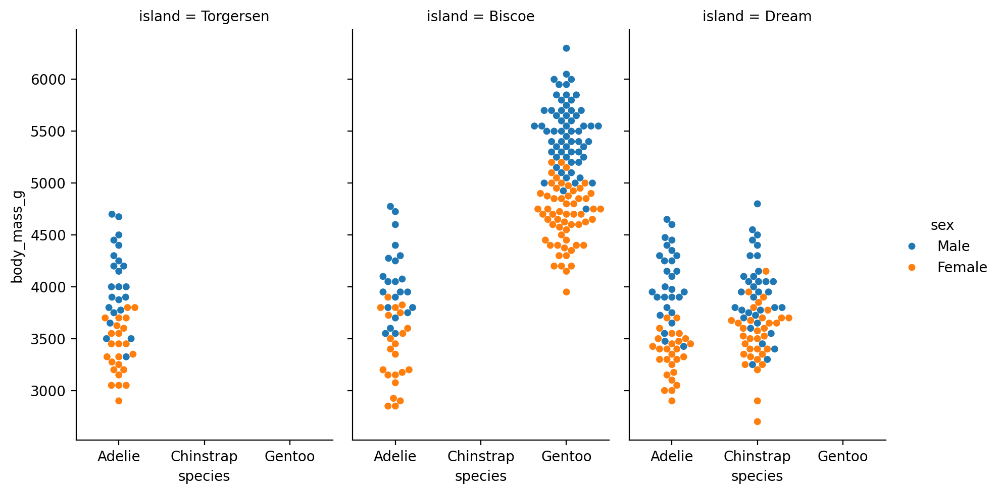

In [67]:
sns.catplot(
    data=penguins, kind="swarm",
    x="species", y="body_mass_g", hue="sex", col="island",
    aspect=.6
)
plt.show()

# 암컷, 수컷의 몸짓 크기인데, Chinstrap 종이 암컷, 수컷 크기가 상대적으로 비슷한 편

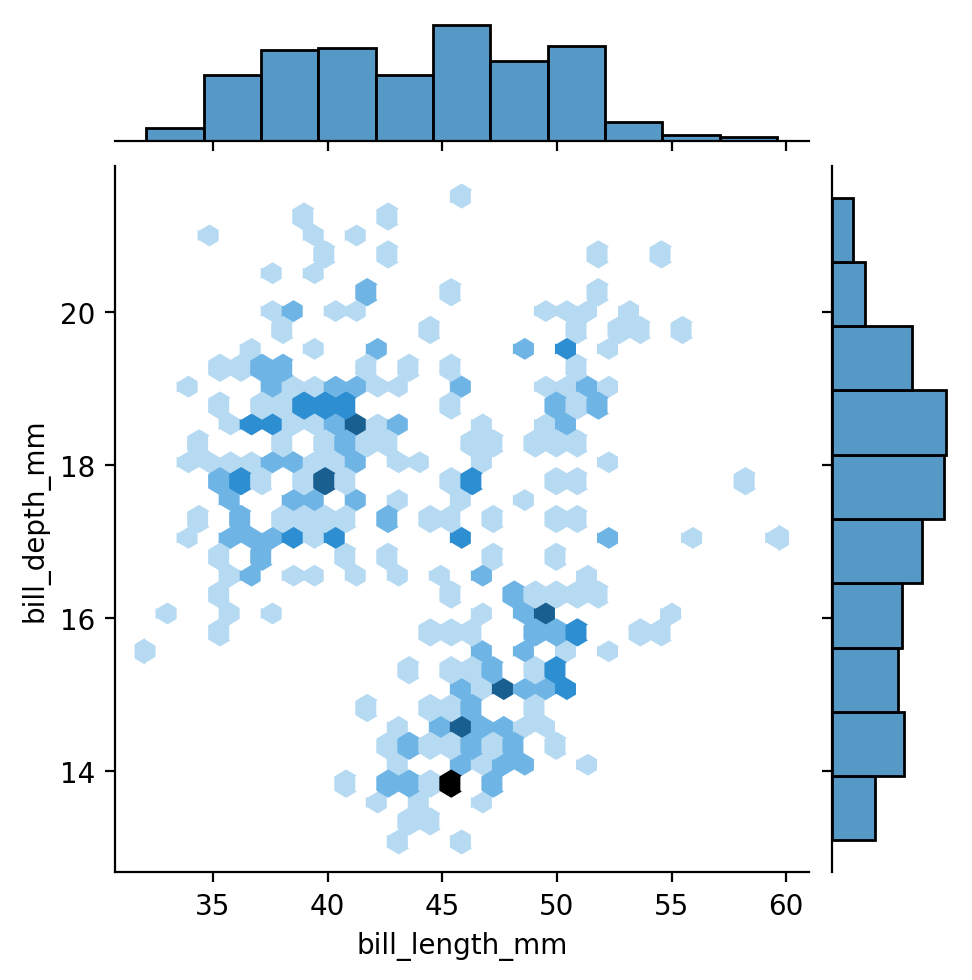

In [68]:
sns.jointplot(penguins, x="bill_length_mm", y="bill_depth_mm", kind="hex", gridsize=30, height=5)  # gridsize: bin 개수
plt.show()

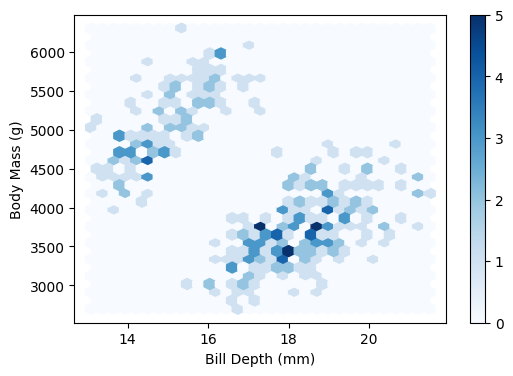

In [69]:
plt.figure(figsize=(6, 4), dpi=50)
plt.hexbin(x=penguins["bill_depth_mm"], y=penguins["body_mass_g"], gridsize=30, cmap="Blues")

plt.colorbar()
plt.xlabel("Bill Depth (mm)")
plt.ylabel("Body Mass (g)")
plt.show()

# New data

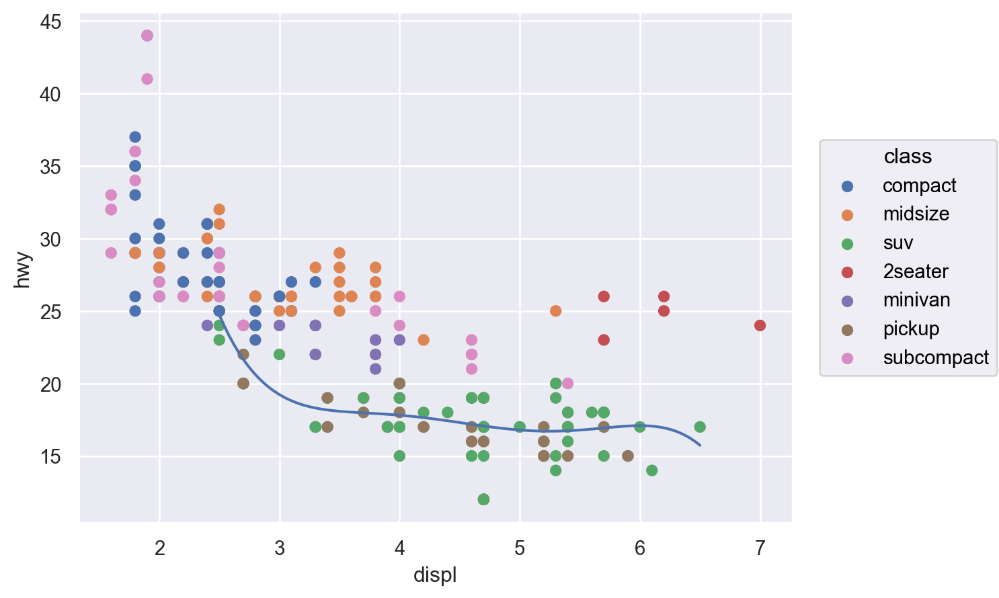

In [70]:
mpg_suv = mpg.query('`class` == "suv"')

(
    so.Plot(mpg, x="displ", y="hwy")
    .add(so.Dot(), color="class")
    .add(so.Line(), so.PolyFit(5), 
         x=mpg_suv["displ"], y=mpg_suv["hwy"])
)

# Alternative Plots

In [74]:
mpg = sm.datasets.get_rdataset("mpg", "ggplot2").data

In [75]:
import plotly.express as px
(
    px.scatter(mpg, x="displ", y="hwy", color="drv", trendline="lowess")
    .update_layout(width=700, height=500)
)

# trend line을 local로 잡아준다.

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': 'drv=f<br>displ=%{x}<br>hwy=%{y}<extra></extra>',
              'legendgroup': 'f',
              'marker': {'color': '#636efa', 'symbol': 'circle'},
              'mode': 'markers',
              'name': 'f',
              'orientation': 'v',
              'showlegend': True,
              'type': 'scatter',
              'x': array([1.8, 1.8, 2. , 2. , 2.8, 2.8, 3.1, 2.4, 2.4, 3.1, 3.5, 3.6, 2.4, 3. ,
                          3.3, 3.3, 3.3, 3.3, 3.3, 3.8, 3.8, 3.8, 4. , 1.6, 1.6, 1.6, 1.6, 1.6,
                          1.8, 1.8, 1.8, 2. , 2.4, 2.4, 2.4, 2.4, 2.5, 2.5, 3.3, 2. , 2. , 2. ,
                          2. , 2.7, 2.7, 2.7, 2.4, 2.4, 2.5, 2.5, 3.5, 3.5, 3. , 3. , 3.5, 3.1,
                          3.8, 3.8, 3.8, 5.3, 2.2, 2.2, 2.4, 2.4, 3. , 3. , 3.5, 2.2, 2.2, 2.4,
                          2.4, 3. , 3. , 3.3, 1.8, 1.8, 1.8, 1.8, 1.8, 2. , 2. , 2. , 2. , 2.8,
                          1.9, 2. , 2. , 2. , 2. , 2.5, 2.5, 2.8, 2.8, 1.9, 1.9, 2. , 2. , 2.5,
                          2.5, 1.8, 1.8, 2. , 2. , 2.8, 2.8, 3.6]),
              'xaxis': 'x',
              'y': array([29, 29, 31, 30, 26, 26, 27, 27, 30, 26, 29, 26, 24, 24, 22, 22, 24, 24,
                          17, 22, 21, 23, 23, 33, 32, 32, 29, 32, 34, 36, 36, 29, 26, 27, 30, 31,
                          26, 26, 28, 26, 29, 28, 27, 24, 24, 24, 29, 27, 31, 32, 27, 26, 26, 25,
                          25, 26, 26, 27, 28, 25, 29, 27, 31, 31, 26, 26, 28, 27, 29, 31, 31, 26,
                          26, 27, 30, 33, 35, 37, 35, 29, 26, 29, 29, 24, 44, 29, 26, 29, 29, 29,
                          29, 23, 24, 44, 41, 29, 26, 28, 29, 29, 29, 28, 29, 26, 26, 26],
                         dtype=int64),
              'yaxis': 'y'},
             {'hovertemplate': ('<b>LOWESS trendline</b><br><br' ... ' <b>(trend)</b><extra></extra>'),
              'legendgroup': 'f',
              'marker': {'color': '#636efa', 'symbol': 'circle'},
              'mode': 'lines',
              'name': 'f',
              'showlegend': False,
              'type': 'scatter',
              'x': array([1.6, 1.6, 1.6, 1.6, 1.6, 1.8, 1.8, 1.8, 1.8, 1.8, 1.8, 1.8, 1.8, 1.8,
                          1.8, 1.8, 1.8, 1.9, 1.9, 1.9, 2. , 2. , 2. , 2. , 2. , 2. , 2. , 2. ,
                          2. , 2. , 2. , 2. , 2. , 2. , 2. , 2. , 2. , 2. , 2. , 2.2, 2.2, 2.2,
                          2.2, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4,
                          2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.7, 2.7, 2.7, 2.8, 2.8, 2.8,
                          2.8, 2.8, 2.8, 2.8, 3. , 3. , 3. , 3. , 3. , 3. , 3. , 3.1, 3.1, 3.1,
                          3.3, 3.3, 3.3, 3.3, 3.3, 3.3, 3.3, 3.5, 3.5, 3.5, 3.5, 3.5, 3.6, 3.6,
                          3.8, 3.8, 3.8, 3.8, 3.8, 3.8, 4. , 5.3]),
              'xaxis': 'x',
              'y': array([31.48, 31.48, 31.48, 31.48, 31.48, 30.45, 30.45, 30.45, 30.45, 30.45,
                          30.45, 30.45, 30.45, 30.45, 30.45, 30.45, 30.45, 30.  , 30.  , 30.  ,
                          29.57, 29.57, 29.57, 29.57, 29.57, 29.57, 29.57, 29.57, 29.57, 29.57,
                          29.57, 29.57, 29.57, 29.57, 29.57, 29.57, 29.57, 29.57, 29.57, 28.73,
                          28.73, 28.73, 28.73, 27.97, 27.97, 27.97, 27.97, 27.97, 27.97, 27.97,
                          27.97, 27.97, 27.97, 27.97, 27.97, 27.97, 27.45, 27.45, 27.45, 27.45,
                          27.45, 27.45, 27.45, 27.45, 26.7 , 26.7 , 26.7 , 26.35, 26.35, 26.35,
                          26.35, 26.35, 26.35, 26.35, 26.04, 26.04, 26.04, 26.04, 26.04, 26.04,
                          26.04, 25.88, 25.88, 25.88, 25.51, 25.51, 25.51, 25.51, 25.51, 25.51,
                          25.51, 25.16, 25.16, 25.16, 25.16, 25.16, 25.  , 25.  , 24.75, 24.75,
                          24.75, 24.75, 24.75, 24.75, 24.66, 23.97]),
              'yaxis': 'y'},
             {'hovertemplate': 'drv=4<br>displ=%{x}<br>hwy=%{y}<extra></ext

In [76]:
(
    px.scatter(mpg, x="displ", y="hwy", color="drv", 
               trendline="lowess", trendline_options=dict(frac=0.3)) # smoothing parameter 
    .update_layout(width=700, height=500)
)

# 다음과 같이 smoothing parameter를 지정할 수 있음
# 더 트렌드 라인에 따라가게 그린다.

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': 'drv=f<br>displ=%{x}<br>hwy=%{y}<extra></extra>',
              'legendgroup': 'f',
              'marker': {'color': '#636efa', 'symbol': 'circle'},
              'mode': 'markers',
              'name': 'f',
              'orientation': 'v',
              'showlegend': True,
              'type': 'scatter',
              'x': array([1.8, 1.8, 2. , 2. , 2.8, 2.8, 3.1, 2.4, 2.4, 3.1, 3.5, 3.6, 2.4, 3. ,
                          3.3, 3.3, 3.3, 3.3, 3.3, 3.8, 3.8, 3.8, 4. , 1.6, 1.6, 1.6, 1.6, 1.6,
                          1.8, 1.8, 1.8, 2. , 2.4, 2.4, 2.4, 2.4, 2.5, 2.5, 3.3, 2. , 2. , 2. ,
                          2. , 2.7, 2.7, 2.7, 2.4, 2.4, 2.5, 2.5, 3.5, 3.5, 3. , 3. , 3.5, 3.1,
                          3.8, 3.8, 3.8, 5.3, 2.2, 2.2, 2.4, 2.4, 3. , 3. , 3.5, 2.2, 2.2, 2.4,
                          2.4, 3. , 3. , 3.3, 1.8, 1.8, 1.8, 1.8, 1.8, 2. , 2. , 2. , 2. , 2.8,
                          1.9, 2. , 2. , 2. , 2. , 2.5, 2.5, 2.8, 2.8, 1.9, 1.9, 2. , 2. , 2.5,
                          2.5, 1.8, 1.8, 2. , 2. , 2.8, 2.8, 3.6]),
              'xaxis': 'x',
              'y': array([29, 29, 31, 30, 26, 26, 27, 27, 30, 26, 29, 26, 24, 24, 22, 22, 24, 24,
                          17, 22, 21, 23, 23, 33, 32, 32, 29, 32, 34, 36, 36, 29, 26, 27, 30, 31,
                          26, 26, 28, 26, 29, 28, 27, 24, 24, 24, 29, 27, 31, 32, 27, 26, 26, 25,
                          25, 26, 26, 27, 28, 25, 29, 27, 31, 31, 26, 26, 28, 27, 29, 31, 31, 26,
                          26, 27, 30, 33, 35, 37, 35, 29, 26, 29, 29, 24, 44, 29, 26, 29, 29, 29,
                          29, 23, 24, 44, 41, 29, 26, 28, 29, 29, 29, 28, 29, 26, 26, 26],
                         dtype=int64),
              'yaxis': 'y'},
             {'hovertemplate': ('<b>LOWESS trendline</b><br><br' ... ' <b>(trend)</b><extra></extra>'),
              'legendgroup': 'f',
              'marker': {'color': '#636efa', 'symbol': 'circle'},
              'mode': 'lines',
              'name': 'f',
              'showlegend': False,
              'type': 'scatter',
              'x': array([1.6, 1.6, 1.6, 1.6, 1.6, 1.8, 1.8, 1.8, 1.8, 1.8, 1.8, 1.8, 1.8, 1.8,
                          1.8, 1.8, 1.8, 1.9, 1.9, 1.9, 2. , 2. , 2. , 2. , 2. , 2. , 2. , 2. ,
                          2. , 2. , 2. , 2. , 2. , 2. , 2. , 2. , 2. , 2. , 2. , 2.2, 2.2, 2.2,
                          2.2, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4,
                          2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.7, 2.7, 2.7, 2.8, 2.8, 2.8,
                          2.8, 2.8, 2.8, 2.8, 3. , 3. , 3. , 3. , 3. , 3. , 3. , 3.1, 3.1, 3.1,
                          3.3, 3.3, 3.3, 3.3, 3.3, 3.3, 3.3, 3.5, 3.5, 3.5, 3.5, 3.5, 3.6, 3.6,
                          3.8, 3.8, 3.8, 3.8, 3.8, 3.8, 4. , 5.3]),
              'xaxis': 'x',
              'y': array([31.19, 31.19, 31.19, 31.19, 31.19, 32.85, 32.85, 32.85, 32.85, 32.85,
                          32.85, 32.85, 32.85, 32.85, 32.85, 32.85, 32.85, 43.07, 43.07, 43.07,
                          28.36, 28.36, 28.36, 28.36, 28.36, 28.36, 28.36, 28.36, 28.36, 28.36,
                          28.36, 28.36, 28.36, 28.36, 28.36, 28.36, 28.36, 28.36, 28.36, 28.  ,
                          28.  , 28.  , 28.  , 28.64, 28.64, 28.64, 28.64, 28.64, 28.64, 28.64,
                          28.64, 28.64, 28.64, 28.64, 28.64, 28.64, 27.99, 27.99, 27.99, 27.99,
                          27.99, 27.99, 27.99, 27.99, 25.67, 25.67, 25.67, 25.42, 25.42, 25.42,
                          25.42, 25.42, 25.42, 25.42, 25.36, 25.36, 25.36, 25.36, 25.36, 25.36,
                          25.36, 25.47, 25.47, 25.47, 25.81, 25.81, 25.81, 25.81, 25.81, 25.81,
                          25.81, 25.67, 25.67, 25.67, 25.67, 25.67, 25.44, 25.44, 24.8 , 24.8 ,
                          24.8 , 24.8 , 24.8 , 24.8 , 23.98, 24.61]),
              'yaxis': 'y'},
             {'hovertemplate': 'drv=4<br>displ=%{x}<br>hwy=%{y}<extra></ext

In [77]:
penguins = sns.load_dataset("penguins")

(
    px.scatter(penguins, x="bill_length_mm", y="bill_depth_mm", color="species",
               trendline="lowess", trendline_options=dict(frac=0.5),
               facet_col="island", # faceting
               opacity=0.5) # alpha
    .update_layout(width=900, height=400) 
)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': ('species=Adelie<br>island=Torge' ... 'l_depth_mm=%{y}<extra></extra>'),
              'legendgroup': 'Adelie',
              'marker': {'color': '#636efa', 'opacity': 0.5, 'symbol': 'circle'},
              'mode': 'markers',
              'name': 'Adelie',
              'orientation': 'v',
              'showlegend': True,
              'type': 'scatter',
              'x': array([39.1, 39.5, 40.3,  nan, 36.7, 39.3, 38.9, 39.2, 34.1, 42. , 37.8, 37.8,
                          41.1, 38.6, 34.6, 36.6, 38.7, 42.5, 34.4, 46. , 35.9, 41.8, 33.5, 39.7,
                          39.6, 45.8, 35.5, 42.8, 40.9, 37.2, 36.2, 42.1, 34.6, 42.9, 36.7, 35.1,
                          38.6, 37.3, 35.7, 41.1, 36.2, 37.7, 40.2, 41.4, 35.2, 40.6, 38.8, 41.5,
                          39. , 44.1, 38.5, 43.1]),
              'xaxis': 'x',
              'y': array([18.7, 17.4, 18. ,  nan, 19.3, 20.6, 17.8, 19.6, 18.1, 20.2, 17.1, 17.3,
                          17.6, 21.2, 21.1, 17.8, 19. , 20.7, 18.4, 21.5, 16.6, 19.4, 19. , 18.4,
                          17.2, 18.9, 17.5, 18.5, 16.8, 19.4, 16.1, 19.1, 17.2, 17.6, 18.8, 19.4,
                          17. , 20.5, 17. , 18.6, 17.2, 19.8, 17. , 18.5, 15.9, 19. , 17.6, 18.3,
                          17.1, 18. , 17.9, 19.2]),
              'yaxis': 'y'},
             {'hovertemplate': ('<b>LOWESS trendline</b><br><br' ... ' <b>(trend)</b><extra></extra>'),
              'legendgroup': 'Adelie',
              'marker': {'color': '#636efa', 'symbol': 'circle'},
              'mode': 'lines',
              'name': 'Adelie',
              'showlegend': False,
              'type': 'scatter',
              'x': array([33.5, 34.1, 34.4, 34.6, 34.6, 35.1, 35.2, 35.5, 35.7, 35.9, 36.2, 36.2,
                          36.6, 36.7, 36.7, 37.2, 37.3, 37.7, 37.8, 37.8, 38.5, 38.6, 38.6, 38.7,
                          38.8, 38.9, 39. , 39.1, 39.2, 39.3, 39.5, 39.6, 39.7, 40.2, 40.3, 40.6,
                          40.9, 41.1, 41.1, 41.4, 41.5, 41.8, 42. , 42.1, 42.5, 42.8, 42.9, 43.1,
                          44.1, 45.8, 46. ]),
              'xaxis': 'x',
              'y': array([18.3 , 18.16, 18.1 , 18.07, 18.07, 18.01, 18.  , 17.98, 17.97, 17.96,
                          17.98, 17.98, 18.03, 18.07, 18.07, 18.28, 18.27, 18.49, 18.49, 18.49,
                          18.39, 18.35, 18.35, 18.31, 18.27, 18.24, 18.22, 18.2 , 18.17, 18.16,
                          18.14, 18.13, 18.12, 18.17, 18.17, 18.21, 18.34, 18.45, 18.45, 18.55,
                          18.59, 18.67, 18.7 , 18.72, 18.79, 18.84, 18.87, 18.94, 19.3 , 19.8 ,
                          19.86]),
              'yaxis': 'y'},
             {'hovertemplate': ('species=Adelie<br>island=Bisco' ... 'l_depth_mm=%{y}<extra></extra>'),
              'legendgroup': 'Adelie',
              'marker': {'color': '#636efa', 'opacity': 0.5, 'symbol': 'circle'},
              'mode': 'markers',
              'name': 'Adelie',
              'orientation': 'v',
              'showlegend': False,
              'type': 'scatter',
              'x': array([37.8, 37.7, 35.9, 38.2, 38.8, 35.3, 40.6, 40.5, 37.9, 40.5, 39.6, 40.1,
                          35. , 42. , 34.5, 41.4, 39. , 40.6, 36.5, 37.6, 35.7, 41.3, 37.6, 41.1,
                          36.4, 41.6, 35.5, 41.1, 35. , 41. , 37.7, 37.8, 37.9, 39.7, 38.6, 38.2,
                          38.1, 43.2, 38.1, 45.6, 39.7, 42.2, 39.6, 42.7]),
              'xaxis': 'x2',
              'y': array([18.3, 18.7, 19.2, 18.1, 17.2, 18.9, 18.6, 17.9, 18.6, 18.9, 17.7, 18.9,
                          17.9, 19.5, 18.1, 18.6, 17.5, 18.8, 16.6, 19.1, 16.9, 21.1, 17. , 18.2,
                          17.1, 18. , 16.2, 19.1, 17.9, 20. , 16. , 20. , 18.6, 18.9, 17.2, 20. ,
                          17. , 19. , 16.5, 20.3, 17.7, 19.5, 20.7, 18.3]),
              'yaxis': 'y2'},
             {'hovertemplate': ('<b>LOWESS trendline</b><br><br' ... ' <b>(trend)</b><extra></extra>'),
          

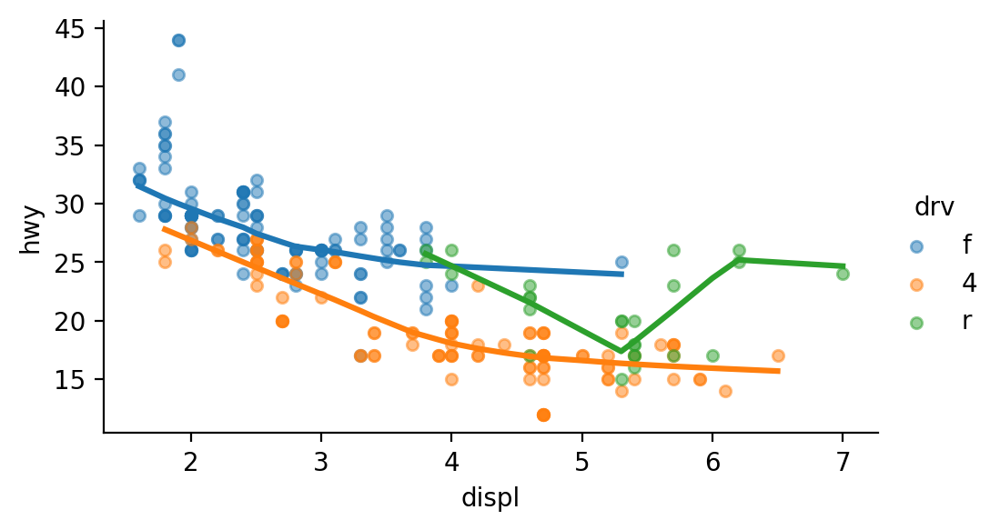

In [78]:
sns.lmplot(mpg, x="displ", y="hwy", hue="drv", # color대신 hue
           lowess=True,  # lowers 켜면 lowers fit을 그려준다
           scatter_kws={"alpha":.5, "s":20}, # s: point size
           height=3, aspect=5/3) 
plt.show() # 생략해도 무방

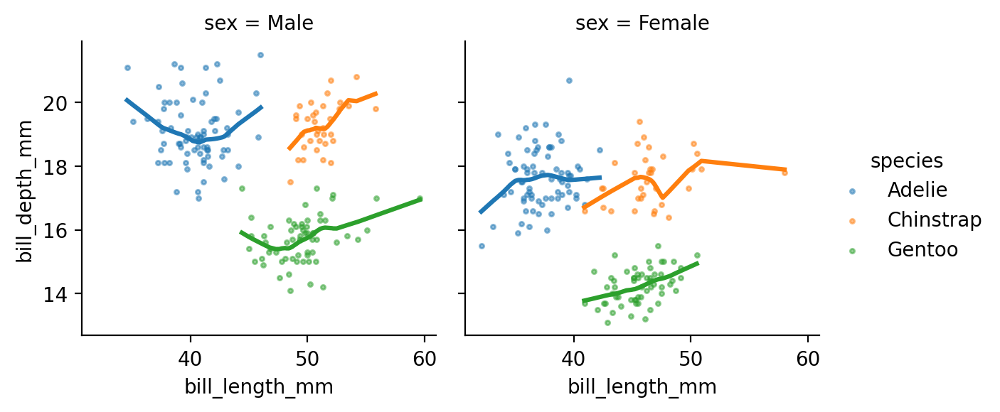

In [79]:
penguins = sns.load_dataset("penguins")

sns.lmplot(penguins, x="bill_length_mm", y="bill_depth_mm", hue="species", 
           lowess=True, 
           col="sex", # faceting: col, row
           height=3, scatter_kws={"alpha":.5, "s":5})
plt.show()

In [80]:
tips = sns.load_dataset("tips")

px.box(tips, x="sex", y="tip", color="day", facet_col="time")

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'hovertemplate': 'day=Sun<br>time=Dinner<br>sex=%{x}<br>tip=%{y}<extra></extra>',
              'legendgroup': 'Sun',
              'marker': {'color': '#636efa'},
              'name': 'Sun',
              'notched': False,
              'offsetgroup': 'Sun',
              'orientation': 'v',
              'showlegend': True,
              'type': 'box',
              'x': array(['Female', 'Male', 'Male', 'Male', 'Female', 'Male', 'Male', 'Male',
                          'Male', 'Male', 'Male', 'Female', 'Male', 'Male', 'Female', 'Male',
                          'Female', 'Male', 'Female', 'Male', 'Male', 'Male', 'Male', 'Male',
                          'Male', 'Male', 'Male', 'Male', 'Male', 'Female', 'Female', 'Male',
                          'Male', 'Male', 'Male', 'Male', 'Female', 'Female', 'Male', 'Male',
                          'Male', 'Male', 'Male', 'Male', 'Female', 'Male', 'Female', 'Female',
                          'Male', 'Male', 'Male', 'Female', 'Male', 'Female', 'Male', 'Male',
                          'Male', 'Male', 'Male', 'Male', 'Male', 'Male', 'Male', 'Female',
                          'Male', 'Male', 'Male', 'Male', 'Male', 'Male', 'Male', 'Female',
                          'Male', 'Female', 'Male', 'Male'], dtype=object),
              'x0': ' ',
              'xaxis': 'x',
              'y': array([1.01, 1.66, 3.5 , 3.31, 3.61, 4.71, 2.  , 3.12, 1.96, 3.23, 1.71, 5.  ,
                          1.57, 3.  , 3.02, 3.92, 1.67, 3.71, 3.5 , 2.54, 3.06, 1.32, 5.6 , 3.  ,
                          5.  , 6.  , 2.05, 3.  , 2.5 , 2.6 , 5.2 , 1.56, 4.34, 3.51, 4.  , 2.55,
                          4.  , 3.5 , 5.07, 2.5 , 2.  , 2.74, 2.  , 2.  , 5.14, 5.  , 3.75, 2.61,
                          2.  , 3.5 , 2.5 , 2.  , 2.  , 3.  , 3.48, 2.24, 4.5 , 5.15, 3.18, 4.  ,
                          3.11, 2.  , 2.  , 4.  , 3.55, 3.68, 5.65, 3.5 , 6.5 , 3.  , 5.  , 3.5 ,
                          2.  , 3.5 , 4.  , 1.5 ]),
              'y0': ' ',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'hovertemplate': 'day=Sat<br>time=Dinner<br>sex=%{x}<br>tip=%{y}<extra></extra>',
              'legendgroup': 'Sat',
              'marker': {'color': '#EF553B'},
              'name': 'Sat',
              'notched': False,
              'offsetgroup': 'Sat',
              'orientation': 'v',
              'showlegend': True,
              'type': 'box',
              'x': array(['Male', 'Male', 'Female', 'Female', 'Male', 'Male', 'Male', 'Male',
                          'Male', 'Male', 'Female', 'Male', 'Male', 'Female', 'Female', 'Male',
                          'Male', 'Male', 'Female', 'Male', 'Male', 'Male', 'Male', 'Female',
                          'Male', 'Male', 'Male', 'Male', 'Male', 'Male', 'Male', 'Male',
                          'Female', 'Female', 'Male', 'Male', 'Male', 'Female', 'Female',
                          'Female', 'Female', 'Male', 'Male', 'Female', 'Female', 'Female',
                          'Male', 'Male', 'Male', 'Male', 'Female', 'Male', 'Female', 'Female',
                          'Female', 'Male', 'Male', 'Male', 'Male', 'Male', 'Female', 'Male',
                          'Male', 'Male', 'Female', 'Female', 'Female', 'Male', 'Male', 'Male',
                          'Female', 'Male', 'Male', 'Female', 'Male', 'Male', 'Male', 'Male',
                          'Male', 'Male', 'Male', 'Male', 'Female', 'Male', 'Female', 'Male',
                          'Male'], dtype=object),
              'x0': ' ',
              'xaxis': 'x',
              'y': array([ 3.35,  4.08,  2.75,  2.23,  7.58,  3.18,  2.34,  2.  ,  2.  ,  4.3 ,
                           3.  ,  1.45,  2.5 ,  3.  ,  2.45,  3.27,  3.6 ,  2.  ,  3.07,  2.31,
                           5.  ,  2.24,  3.  ,  1.5 ,  1.76,  6.73,  3.21,  2.  ,  1.98,  3.76,
                           2.64,  3.15,  2.47,  1.  ,  2.01,  2.09,  1.97,  3. 

# Customizing

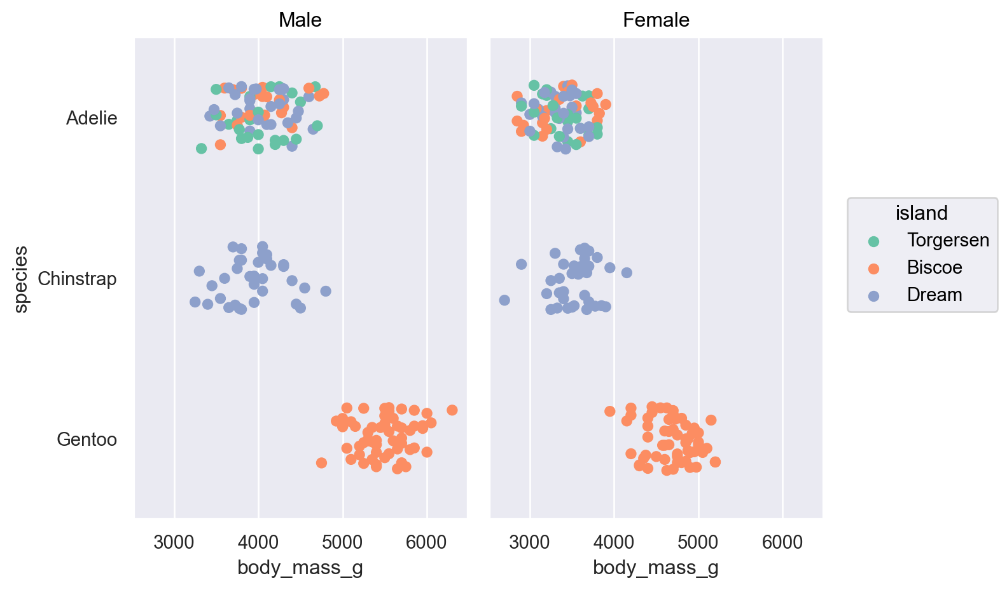

In [81]:
penguins = sns.load_dataset("penguins")
(
    so.Plot(penguins, x="body_mass_g", y="species", color="island")
    .facet(col="sex")
    .add(so.Dot(), so.Jitter(0.5))
    .scale(color="Set2")  # color palettes: "Set2"
    .layout(size=(7, 5))  # plot size
)

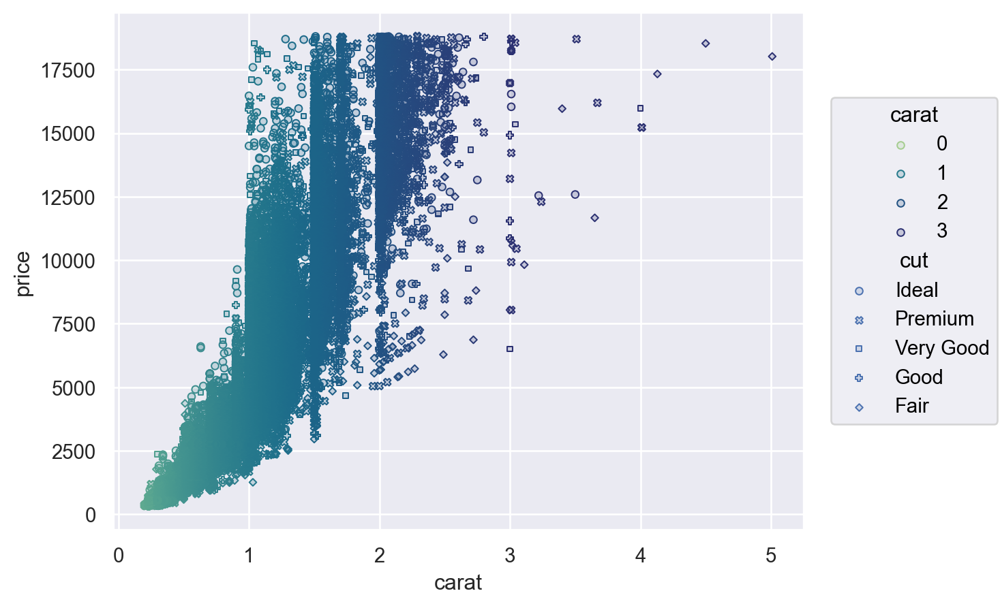

In [82]:
diamonds = sns.load_dataset("diamonds")
(
    so.Plot(diamonds, x="carat", y="price", color="carat", marker="cut")
    .add(so.Dots())
    .scale(
        color=so.Continuous("crest", norm=(0, 3), trans="sqrt"), # carat의 값을?? norm 0에서 3까지 안에서 변화해라..?
    )
)

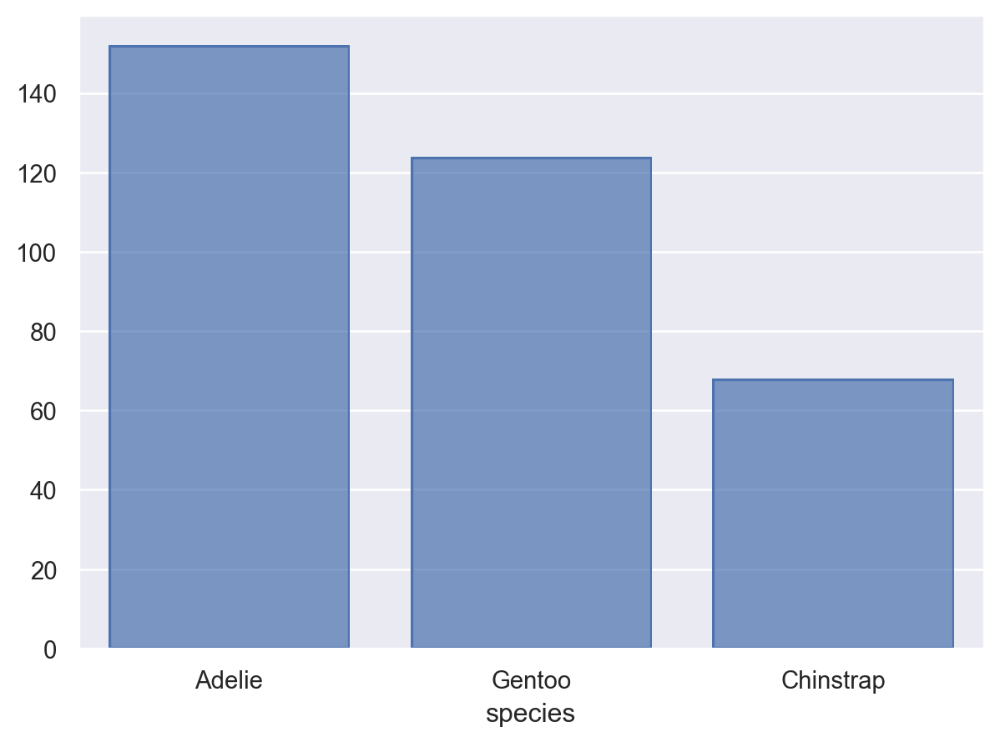

In [83]:
(
    so.Plot(penguins, x="species")
    .add(so.Bar(), so.Count())
    .scale(x=so.Nominal(order=["Adelie", "Gentoo", "Chinstrap"]))  # x축의 카테고리 순서를 변경, order 꼭 알고 있어라
)

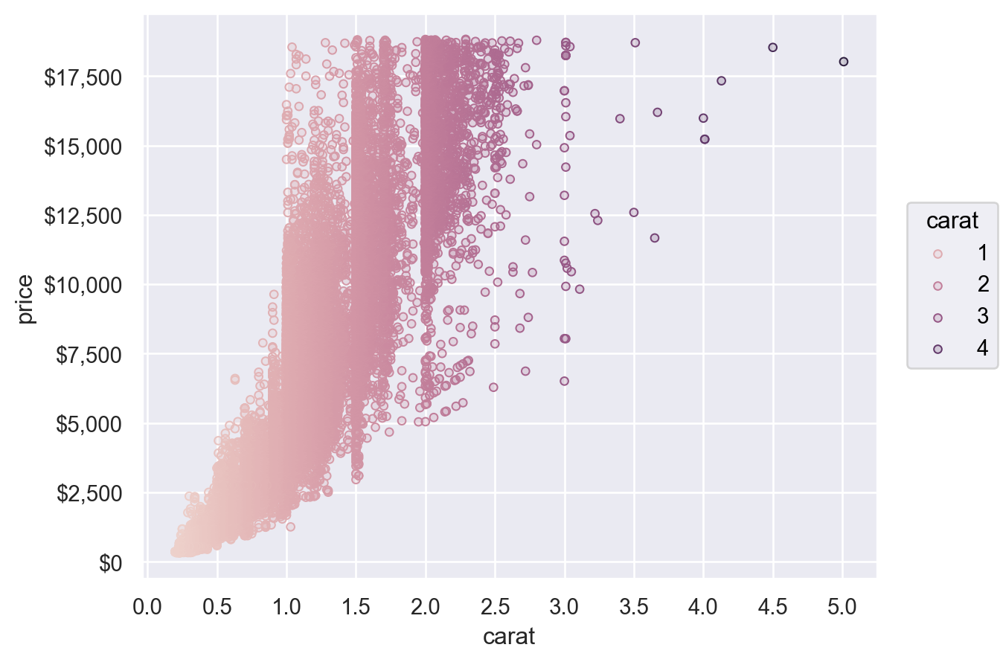

In [84]:
(
    so.Plot(diamonds, x="carat", y="price", color="carat")
    .add(so.Dots())
    .scale(
        x=so.Continuous().tick(every=0.5),
        y=so.Continuous().label(like="${x:,.0f}"),  # %표시: like="{x:.1f%}"
        color=so.Continuous().tick(at=[1, 2, 3, 4]),  # at은 그 지점에서 딱딱 찍어라. 컬러 매핑
    )
)

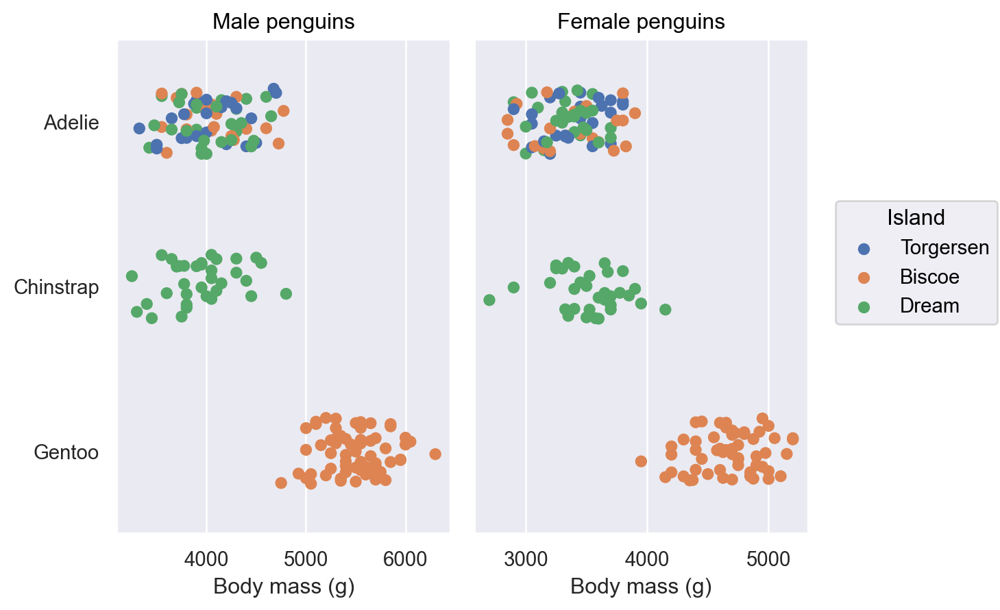

In [85]:
penguins = sns.load_dataset("penguins")

(
    so.Plot(penguins, x="body_mass_g", y="species", color="island")
    .facet(col="sex")
    .add(so.Dot(), so.Jitter(0.5))
    .share(x=False)
    .limit(y=(2.5, -0.5)) # 좌표를 제한, limit은 자주 쓰게 된다
    .label(
        x="Body mass (g)",
        y="",
        color=str.capitalize,
        title="{} penguins".format,
    )
)

In [86]:
plt.style.library["seaborn-v0_8-whitegrid"]

RcParams({'axes.axisbelow': True,
          'axes.edgecolor': '.8',
          'axes.facecolor': 'white',
          'axes.grid': True,
          'axes.labelcolor': '.15',
          'axes.linewidth': 1.0,
          'figure.facecolor': 'white',
          'font.family': ['sans-serif'],
          'font.sans-serif': ['Arial',
                              'Liberation Sans',
                              'DejaVu Sans',
                              'Bitstream Vera Sans',
                              'sans-serif'],
          'grid.color': '.8',
          'grid.linestyle': '-',
          'image.cmap': 'Greys',
          'legend.frameon': False,
          'legend.numpoints': 1,
          'legend.scatterpoints': 1,
          'lines.solid_capstyle': <CapStyle.round: 'round'>,
          'text.color': '.15',
          'xtick.color': '.15',
          'xtick.direction': 'out',
          'xtick.major.size': 0.0,
          'xtick.minor.size': 0.0,
          'ytick.color': '.15',
          'ytick.direct

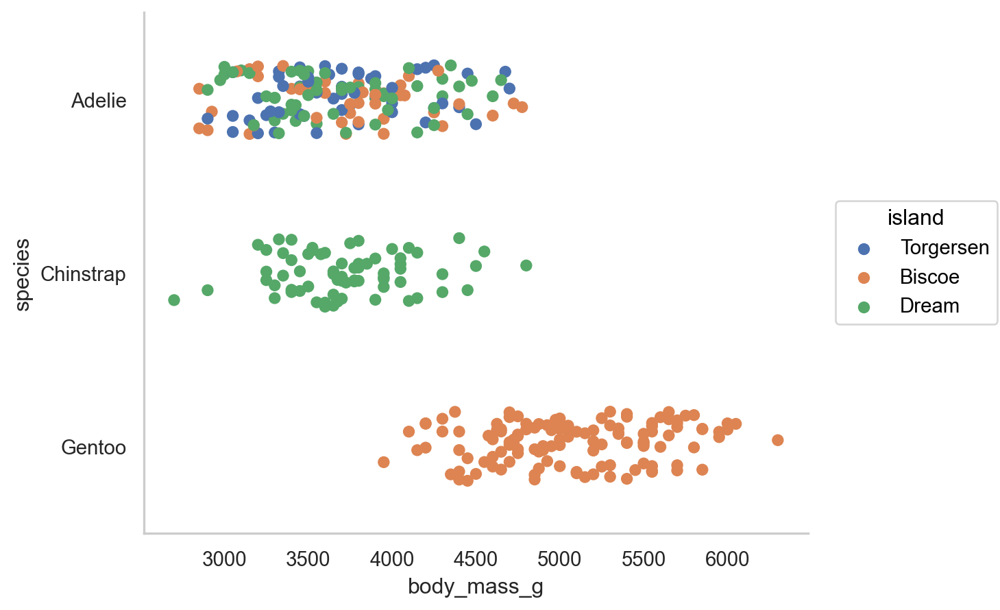

In [87]:
p = so.Plot(penguins, x="body_mass_g", y="species", color="island").add(so.Dot(), so.Jitter(0.5))
p.theme(
    {
        "axes.facecolor": "white",
        "axes.edgecolor": "0.8",
        "axes.spines.top": False,
        "axes.spines.right": False,
    }
)

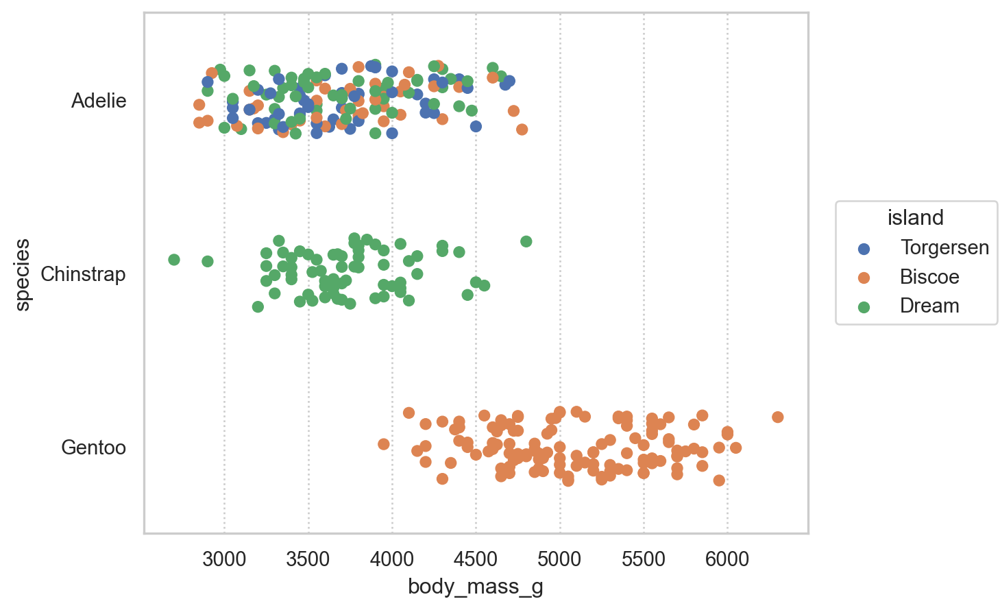

In [88]:
p.theme({**sns.axes_style("whitegrid"), "grid.linestyle": ":"})

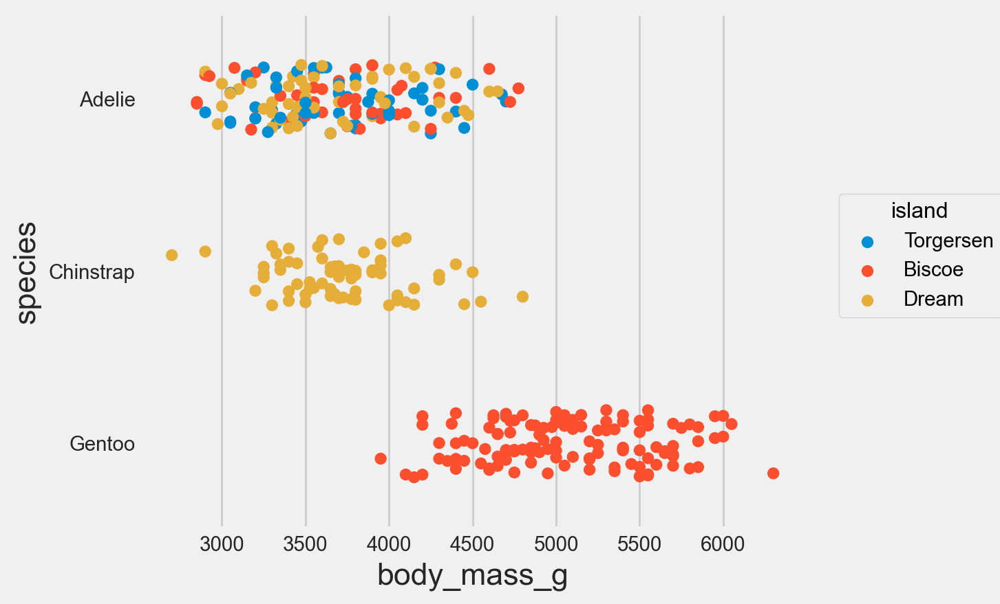

In [89]:
# Matplotlib의 스타일을 사용

p.theme({**plt.style.library["fivethirtyeight"]})